## Generate partial trajectories of a Lorenz system with Variational Autoencoders

### Introduction
##### Lorenz system

Lorenz system is a system of ordinary differential equation. It is the result of the semplification of the model for atmospheric convenction:
\begin{aligned}{\frac {\mathrm {d} x}{\mathrm {d} t}}&=\sigma (y-x),\\[6pt]{\frac {\mathrm {d} y}{\mathrm {d} t}}&=x(\rho -z)-y,\\[6pt]{\frac {\mathrm {d} z}{\mathrm {d} t}}&=xy-\beta z.\end{aligned}

 $x$ is proportional to the rate of convection, $y$ to the horizontal temperature variation, $z$ to the vertical temperature variation.

Where $\sigma$, $\rho$ and $\beta$ are the parameters.
This is a caotic system, so it is hightly dependent on initial conditions, in absence of perfect knowledge of the initial conditions we cannot predict the trajectory.

##### From Autoencoder to VAE
Variational autoencoders are a type of generative neural network based on the same structure of autoencoders:

- a series of layers defined as the encoder part
- and a series of layers defined as the decoder part

![autoencoder](https://miro.medium.com/max/2524/1*bY_ShNK6lBCQ3D9LYIfwJg@2x.png)

Autoencoders are used for dimensionality reduction and noise attenuation however they are not generative model because the regularity of the latent space that is produced after training depends on architecture of the encoder, dimension of the latent space and distribution of the initial space.
In few words the biggest problem is that we do not enforce a regularization of the latent space, in this way if we sample in a random way we are almost certain to see noise as output.
![regularization](https://miro.medium.com/max/3742/1*9ouOKh2w-b3NNOVx4Mw9bg@2x.png)
For example we can force the latent space to be gaussian.
So the clear difference between autoencoders and VAE is that in VAE instead of encoding an input as a single point, we encode it as a distribution over the latent space.

| Autoencoder                                                  | Variational Autoencoder |
|--------------------------------------------------------------|-------------------------|
| faster to train (no regularization)                          | slower to train         |
| high compression ratio (compress as efficiently as possible) | good compression ratio  |
| no generative property                                       | generative model        |

### Goal of the project
We want to train a VAE to generate partial trajectories of a Lorenz system with predefined parameters and two Lorenz attractors.

$$
I = -\log p(x)\\
H = -\sum _x p(x)\log p(x) \\
KL(p||q) = H(q) - H(p) = -\sum _x q(x)\log q(x) +\sum _x p(x)\log p(x)\\
=-\sum _x p(x)\log q(x) +\sum _x p(x)\log p(x)\\
=\sum_x p(x) \log \frac{p(x)}{q(x)}
=-\sum_x p(x) \log \frac{q(x)}{p(x)}
$$
KL divergence is not a distance function! 

Properties:

- KL $\ge 0$
- KL is not symmetric


### Introduction to Variational Inference
The method of regularization in Variational autoencoders is based on variational inference 

$$
z \rightarrow x
$$

$$
p(z|x) = \frac{p(x|z)p(z)}{p(x)}=\frac{p(x,z)}{p(x)} \label{pzx}\tag{1}
$$

Compute $p(x)$ is complicated because this marginal distribution is:
$$
p(x) = \int p(x|z)p(z)dz
$$
is difficult to calculate especially in high dimensional space. We can approximate the solution of this integral with two methods:

- Monte Carlo with Gibbs sampling an unbiased with high variance.

- Variational Inference zero variance, biased estimation.

##### What is Variational Inference?

I want to compute $p(z|x)$ but i can't if i try to resolve directly from definition $\ref{pzx}.$ 

We define a distribution $q(z)$ that approximate $p(z|x)$ so that $q(z)$ is a tractable distribution, for example in the family of Gaussian exponentials.

$q(z)$ can depend on $x$ or not, depending on the problem, for example: $x$ can be given so i just need the density at point $z$, $q(z)$.

I want to $\min KL(q||p)$, where $q$ is $q(z)$ and $p$ is $p(z|x)$
$$
\min KL(q(z)||p(z|x)) = \min -\sum_z q(z) \log \frac{p(z|x)}{q(z)}
$$
We replace $p(z|x)$ definition $\ref{pzx},$ and obtain(we drop min):
$$
\begin{align*}
KL(q(z)||p(z|x))&=-\sum_z q(z)\log \frac{\frac{p(x,z)}{p(x)}}{q(z)}\\
&=-\sum_z q(z)\log \frac{p(x,z)}{q(z)}\frac{1}{p(x)}\\
&=-\sum_z q(z)\left[ \log \frac{p(x,z)}{q(z)}-\log p(x)\right]\\
&=-\sum_z q(z)\log \frac{p(x,z)}{q(z)}+\sum_z q(z)\log p(x)
\end{align*}
$$


Hence $\sum_z q(z) \log p(x) = \log p(x) \overbrace{\sum_z q(z)}^1 = \log p(x)$ , now by changing the position of the three terms:
$$
\log p(x) = KL(q(z)||p(z|x)) + \underbrace{ \sum_z q(z)\log\frac{p(x,z)}{q(z)}}_\mathcal{L}
$$
Let $\log p(x)$ be fixed (x is given), KL the quantity that I want to minimize and $\mathcal{L}$ a constant,because of his property ( KL$\ge 0$), instead of minimizing KL divergence I can maximize $\mathcal{L}$ that is the _variational lower bound_.
$$
\mathcal{L} \le \log p(x)
$$

$$
\begin{align*}
\mathcal{L} &= \sum_z q(z)\log\frac{p(x,z)}{q(z)}\\
&=\sum_z q(z)\log\frac{p(x|z)p(z)}{q(z)}\\
&=\sum_z q(z) \left[\log p(x|z) + \log \frac{p(z)}{q(z)} \right]\\
&=\underbrace{\sum_z q(z) \log p(x|z)}_{E_{q(z)}\log p(x|z)} + \underbrace{\sum_z q(z)\log \frac{p(z)}{q(z)}}_{-KL(q(z)||p(z))}\\
\end{align*}
$$


To make $q(z)$ similar to $p(z|x)$ I can minimize KL divergence, but this is identical to maximize lower bound $\mathcal L$.

Maximizing $\mathcal L$ is equivalent to minimizing $-KL(q(z)||p(z))$ and we need to maximize the expectation of the logarithm ($z$ should generate the observations $x$).


### From variational inference theory to an autoencoder

Given a graphical model
$$
z\xrightarrow{p(x|z)}x
$$
This can be computed 
$$
z \xleftarrow{q(z|x)}x
$$
instead of $p(z|x)$ that is hard to compute, $z$ is our hidden variable

$q$ can be our _encoder_ that map: $q: x \rightarrow z$

![encoder](https://miro.medium.com/max/700/1*XYyWimolMhPDMg8qCNlcwg@2x.png)

$p$ our _decoder_ that map: $ p: z \rightarrow \hat{x}$
![decoder](https://miro.medium.com/max/700/1*1n6HwjwUWbmE9PvCzOVcbw@2x.png)
What we observe at the end of the encoder should match another distribution $p$ that we can choose, for example Gaussian Distribution, so distribution of $z$ is Gaussian. 

The first part of the final objective function that we want to minimize, the expectation of the logarithm, is conceptually reconstruction error.
$$
E_{q(z)}\log p(x|z) = |x-\hat{x}|
$$
Why ?

Because there is a deterministic function between $z$ and $\hat{x}$, a neural network that has been trained. So $p(x|z)$ can be written as:

$p(x|z) = p(x|\hat{x})$

Moreover if you choose Gaussian distribution form for $p$ it will have this form $p(x|\hat{x}) = e^{-|x-\hat{x}|^2}$ and if you take the logarithm you obtain $ |x-\hat{x}|^2$, the reconstruction error.

Our cost function of the variational autoencoder is:
$$
|x-\hat{x}|^2+KL(q(z|x)||N(\mu,\Sigma))
$$

$$
KL = -\frac{1}{2}\sum(1+\log\Sigma^2-\mu^2-\Sigma^2)
$$
We want the encoder to generate the mean and variance of these Gaussian distributions, so the output this layer will be a vector of dimension $d$ for the mean and a vector $d$ for the variance, so we force covariance to zero for simplicity.

The decoder sample from the distribution that we have generated. 

## Import the libraries

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import cnames
from matplotlib import animation
import pandas as pd
from sklearn import preprocessing
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from helperfuns import * #function generate video
import seaborn as sns

## Generate the data

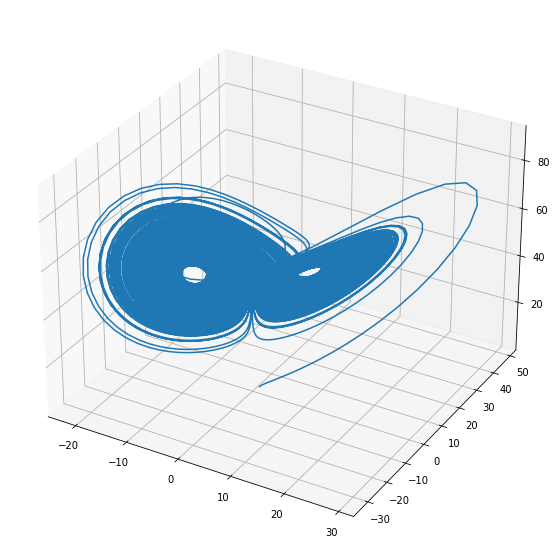

In [2]:
rho = 50.0
sigma = 10.0
beta = 4.0 / 3.0

def f(state, t):
    x, y, z = state  # Unpack the state vector
    return sigma * (y - x), x * (rho - z) - y, x * y - beta * z  # Derivatives

state0 = [1.0, 1.0, 1.0]
t = np.arange(0.0, 400.0, 0.01)

states = odeint(f, state0, t)

fig = plt.figure(figsize=(10,10))
ax = fig.gca(projection="3d")
ax.plot(states[:, 0], states[:, 1], states[:, 2])
plt.draw()
plt.show()

In [3]:
states.shape

(40000, 3)

Text(0.5, 1.0, 'z')

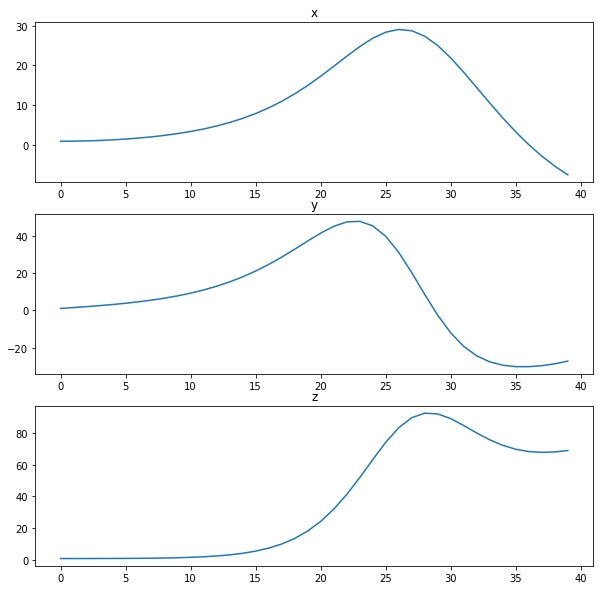

In [4]:
fig, axs = plt.subplots(3, figsize=(10,10))
axs[0].plot(states[:40,0])
axs[0].set_title("x")
axs[1].plot(states[:40,1])
axs[1].set_title("y")
axs[2].plot(states[:40,2])
axs[2].set_title("z")

In a standard problem we would rescale the dataset in a 0-1 range but from previous test the network does not produce good results.

In [ ]:
#min_max_scaler = preprocessing.MinMaxScaler()
#min_max_scaler.fit(states.reshape(-1,1))
#states = min_max_scaler.transform(states)

We divide the trajectory into chunks of length 40

In [5]:
dataset = np.array(np.vsplit(states,1000))
print(dataset.shape)

(1000, 40, 3)


In [6]:
x_temp, x_test, _, _ = train_test_split(dataset, dataset, test_size=0.05)
x_train, x_valid, _, _ = train_test_split(x_temp,
                                          x_temp,
                                          test_size=0.1)

In [7]:
x_test.shape, x_train.shape, x_valid.shape

((50, 40, 3), (855, 40, 3), (95, 40, 3))

Text(0.5, 1.0, 'z')

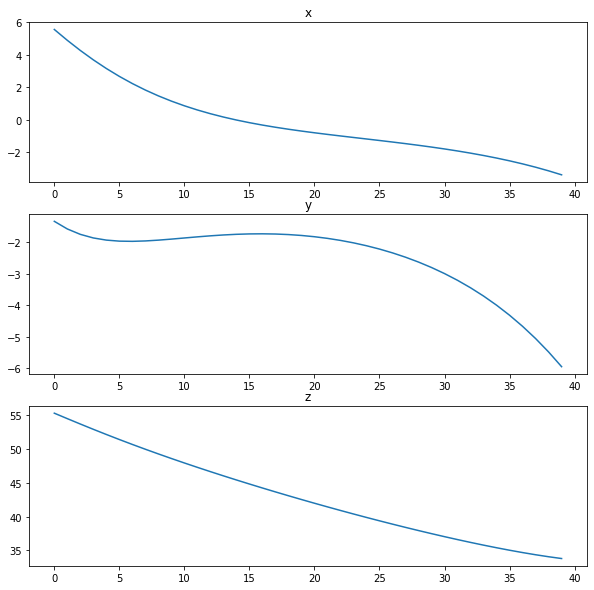

In [8]:
sample = np.random.randint(0,855)
fig, axs = plt.subplots(3, figsize=(10,10))
axs[0].plot(x_train[sample,:,0])
axs[0].set_title("x")
axs[1].plot(x_train[sample,:,1])
axs[1].set_title("y")
axs[2].plot(x_train[sample,:,2])
axs[2].set_title("z")

## Define the network blocks

![reparametrizationTrick](https://miro.medium.com/max/3704/1*S8CoO3TGtFBpzv8GvmgKeg@2x.png)

### Create a sampling layer

In [9]:
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

### Build the encoder

In [10]:
latent_dim = 32
regularizer = keras.regularizers.l2(1e-3)
encoder_inputs = keras.Input(shape=(40, 3))
x = layers.Conv1D(32, 3, activation="relu", strides=1, padding="same",kernel_regularizer=regularizer)(encoder_inputs)
x = layers.Conv1D(32, 3, activation="relu", strides=2, padding="same",kernel_regularizer=regularizer)(x)
x = layers.Flatten()(x)
x = layers.Dense(16, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean",kernel_regularizer=regularizer)(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])
encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 40, 3)]      0                                            
__________________________________________________________________________________________________
conv1d (Conv1D)                 (None, 40, 32)       320         input_1[0][0]                    
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 20, 32)       3104        conv1d[0][0]                     
__________________________________________________________________________________________________
flatten (Flatten)               (None, 640)          0           conv1d_1[0][0]                   
____________________________________________________________________________________________

### Build the decoder

In [11]:
latent_inputs = keras.Input(shape=(latent_dim,))
x = layers.Dense(20 * 32, activation="relu",kernel_regularizer=regularizer)(latent_inputs)
x = layers.Reshape((20, 32))(x)
x = layers.Conv1DTranspose(32, 3, activation="relu", strides=2, padding="same",kernel_regularizer=regularizer)(x)
x = layers.Conv1DTranspose(32, 3, activation="relu", strides=1, padding="same",kernel_regularizer=regularizer)(x)
decoder_outputs = layers.Conv1DTranspose(3, 3, strides=1, activation="linear", padding="same", kernel_regularizer=regularizer)(x)
decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

Model: "decoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 32)]              0         
_________________________________________________________________
dense_1 (Dense)              (None, 640)               21120     
_________________________________________________________________
reshape (Reshape)            (None, 20, 32)            0         
_________________________________________________________________
conv1d_transpose (Conv1DTran (None, 40, 32)            3104      
_________________________________________________________________
conv1d_transpose_1 (Conv1DTr (None, 40, 32)            3104      
_________________________________________________________________
conv1d_transpose_2 (Conv1DTr (None, 40, 3)             291       
Total params: 27,619
Trainable params: 27,619
Non-trainable params: 0
_______________________________________________________

In [19]:
def model(latent_dim,channels):
    latent_dim = latent_dim
    regularizer = keras.regularizers.l2(1e-3)
    encoder_inputs = keras.Input(shape=(40, 3))
    x = layers.Conv1D(channels, 3, activation="relu", strides=1, padding="same",kernel_regularizer=regularizer)(encoder_inputs)
    x = layers.Conv1D(channels, 3, activation="relu", strides=2, padding="same",kernel_regularizer=regularizer)(x)
    x = layers.Flatten()(x)
    x = layers.Dense(16, activation="relu")(x)
    z_mean = layers.Dense(latent_dim, name="z_mean",kernel_regularizer=regularizer)(x)
    z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
    z = Sampling()([z_mean, z_log_var])
    encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")

    latent_inputs = keras.Input(shape=(latent_dim,))
    x = layers.Dense(20 * channels, activation="relu",kernel_regularizer=regularizer)(latent_inputs)
    x = layers.Reshape((20, channels))(x)
    x = layers.Conv1DTranspose(channels, 3, activation="relu", strides=2, padding="same",kernel_regularizer=regularizer)(x)
    x = layers.Conv1DTranspose(channels, 3, activation="relu", strides=1, padding="same",kernel_regularizer=regularizer)(x)
    decoder_outputs = layers.Conv1DTranspose(3, 3, strides=1, activation="linear", padding="same", kernel_regularizer=regularizer)(x)
    decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
    return encoder, decoder

### Define the VAE as a `Model` with a custom `train_step`

$$
KL = -\frac{1}{2}\sum(1+\log\Sigma^2-\mu^2-\Sigma^2)
$$

In [14]:
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data)
            reconstruction = self.decoder(z)
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                    keras.losses.mean_squared_error(data, reconstruction), axis=(1)
                )
            )
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)) #you can find this in the review
            kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            total_loss = reconstruction_loss +kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }
    def call(self,x):
        x = self.encoder(x)
        return self.decoder(x)

### Train the VAE
We perform a coarse hyperparameter optimization search (2 and 3 1D convolutional layers for encoder and decoder), we visualize the generative performance and see that it is enough.

In [20]:
tf.config.run_functions_eagerly(True)
test_loss = []
channels = [32, 16, 8]
for channel in channels:
    encoder, decoder = model(16,channel)
    vae = VAE(encoder, decoder)
    vae.compile(optimizer=keras.optimizers.Adam(lr=0.001))
    vae.fit(x_train, epochs=500, batch_size=8)
    encoded_test = np.array(vae.encoder.predict(x_test))
    vae_test = vae.predict(x_test)
    MSE = np.mean(np.sum(tf.keras.metrics.mean_squared_error(x_test, vae_test),axis=1))
    test_loss.append(MSE)

/home/cristianoc/.local/lib/python3.8/site-packages/tensorflow/python/data/ops/dataset_ops.py:3349: UserWarning: Even though the tf.config.experimental_run_functions_eagerly option is set, this option does not apply to tf.data functions. tf.data functions are still traced and executed as graphs.
  warnings.warn(


Epoch 1/500
107/107 [==============================] - 2s 20ms/step - loss: 48011.5354 - reconstruction_loss: 14691.9941 - kl_loss: 5345.5498
Epoch 2/500
107/107 [==============================] - 2s 20ms/step - loss: 3086.0577 - reconstruction_loss: 2776.4868 - kl_loss: 190.8843
Epoch 3/500
107/107 [==============================] - 2s 19ms/step - loss: 2719.0947 - reconstruction_loss: 2469.2559 - kl_loss: 149.8501
Epoch 4/500
107/107 [==============================] - 2s 19ms/step - loss: 2472.1654 - reconstruction_loss: 2285.3694 - kl_loss: 129.9327
Epoch 5/500
107/107 [==============================] - 2s 19ms/step - loss: 2314.0150 - reconstruction_loss: 2174.6907 - kl_loss: 118.7783
Epoch 6/500
107/107 [==============================] - 2s 19ms/step - loss: 2250.2520 - reconstruction_loss: 2075.7429 - kl_loss: 107.6705
Epoch 7/500
107/107 [==============================] - 2s 19ms/step - loss: 2161.5190 - reconstruction_loss: 2054.7410 - kl_loss: 96.3931
Epoch 8/500
107/107 [====

107/107 [==============================] - 2s 19ms/step - loss: 75.3616 - reconstruction_loss: 39.3494 - kl_loss: 34.6498
Epoch 121/500
107/107 [==============================] - 2s 19ms/step - loss: 62.4830 - reconstruction_loss: 28.7243 - kl_loss: 34.7339
Epoch 122/500
107/107 [==============================] - 2s 19ms/step - loss: 65.3480 - reconstruction_loss: 32.2505 - kl_loss: 34.0342
Epoch 123/500
107/107 [==============================] - 2s 19ms/step - loss: 67.0567 - reconstruction_loss: 46.4951 - kl_loss: 33.6655
Epoch 124/500
107/107 [==============================] - 2s 19ms/step - loss: 77.0453 - reconstruction_loss: 52.1123 - kl_loss: 33.9764
Epoch 125/500
107/107 [==============================] - 2s 19ms/step - loss: 72.4980 - reconstruction_loss: 37.3555 - kl_loss: 33.8823
Epoch 126/500
107/107 [==============================] - 2s 19ms/step - loss: 66.3564 - reconstruction_loss: 33.1402 - kl_loss: 33.7265
Epoch 127/500
107/107 [==============================] - 2s 19

107/107 [==============================] - 2s 19ms/step - loss: 48.7627 - reconstruction_loss: 20.9506 - kl_loss: 25.0603
Epoch 241/500
107/107 [==============================] - 2s 19ms/step - loss: 44.0113 - reconstruction_loss: 17.7111 - kl_loss: 25.0714
Epoch 242/500
107/107 [==============================] - 2s 19ms/step - loss: 44.9290 - reconstruction_loss: 23.2343 - kl_loss: 24.5572
Epoch 243/500
107/107 [==============================] - 2s 19ms/step - loss: 46.0778 - reconstruction_loss: 22.0075 - kl_loss: 24.9476
Epoch 244/500
107/107 [==============================] - 2s 19ms/step - loss: 44.6029 - reconstruction_loss: 18.1389 - kl_loss: 24.7802
Epoch 245/500
107/107 [==============================] - 2s 19ms/step - loss: 45.2451 - reconstruction_loss: 19.1700 - kl_loss: 24.4706
Epoch 246/500
107/107 [==============================] - 2s 19ms/step - loss: 45.4473 - reconstruction_loss: 20.1229 - kl_loss: 24.4592
Epoch 247/500
107/107 [==============================] - 2s 19

107/107 [==============================] - 2s 19ms/step - loss: 42.1298 - reconstruction_loss: 17.4669 - kl_loss: 20.2061
Epoch 361/500
107/107 [==============================] - 2s 19ms/step - loss: 33.1422 - reconstruction_loss: 13.9570 - kl_loss: 20.0492
Epoch 362/500
107/107 [==============================] - 2s 19ms/step - loss: 40.3458 - reconstruction_loss: 20.8898 - kl_loss: 20.3069
Epoch 363/500
107/107 [==============================] - 2s 19ms/step - loss: 36.6449 - reconstruction_loss: 15.1604 - kl_loss: 19.8847
Epoch 364/500
107/107 [==============================] - 2s 19ms/step - loss: 38.6190 - reconstruction_loss: 16.6541 - kl_loss: 19.8071
Epoch 365/500
107/107 [==============================] - 2s 19ms/step - loss: 32.2574 - reconstruction_loss: 12.1887 - kl_loss: 19.7653
Epoch 366/500
107/107 [==============================] - 2s 19ms/step - loss: 35.5183 - reconstruction_loss: 16.5797 - kl_loss: 19.8103
Epoch 367/500
107/107 [==============================] - 2s 19

107/107 [==============================] - 2s 19ms/step - loss: 38.2357 - reconstruction_loss: 16.0454 - kl_loss: 17.7727
Epoch 481/500
107/107 [==============================] - 2s 19ms/step - loss: 30.5831 - reconstruction_loss: 12.1881 - kl_loss: 17.6775
Epoch 482/500
107/107 [==============================] - 2s 20ms/step - loss: 28.8584 - reconstruction_loss: 13.0160 - kl_loss: 17.4420
Epoch 483/500
107/107 [==============================] - 2s 19ms/step - loss: 29.8361 - reconstruction_loss: 12.2055 - kl_loss: 17.5028
Epoch 484/500
107/107 [==============================] - 2s 20ms/step - loss: 31.1316 - reconstruction_loss: 12.6434 - kl_loss: 17.5022
Epoch 485/500
107/107 [==============================] - 2s 20ms/step - loss: 28.6841 - reconstruction_loss: 11.6361 - kl_loss: 17.3771
Epoch 486/500
107/107 [==============================] - 2s 20ms/step - loss: 30.1453 - reconstruction_loss: 11.3827 - kl_loss: 17.5488
Epoch 487/500
107/107 [==============================] - 2s 20

Epoch 40/500
107/107 [==============================] - 2s 19ms/step - loss: 95.7630 - reconstruction_loss: 41.9784 - kl_loss: 54.2889
Epoch 41/500
107/107 [==============================] - 2s 19ms/step - loss: 96.2726 - reconstruction_loss: 44.5494 - kl_loss: 53.2590
Epoch 42/500
107/107 [==============================] - 2s 19ms/step - loss: 97.2807 - reconstruction_loss: 41.5674 - kl_loss: 53.4994
Epoch 43/500
107/107 [==============================] - 2s 19ms/step - loss: 90.6254 - reconstruction_loss: 39.3802 - kl_loss: 53.1578
Epoch 44/500
107/107 [==============================] - 2s 19ms/step - loss: 93.8571 - reconstruction_loss: 44.5979 - kl_loss: 52.9182
Epoch 45/500
107/107 [==============================] - 2s 19ms/step - loss: 91.4056 - reconstruction_loss: 40.7487 - kl_loss: 53.0784
Epoch 46/500
107/107 [==============================] - 2s 19ms/step - loss: 90.1234 - reconstruction_loss: 38.5655 - kl_loss: 53.7771
Epoch 47/500
107/107 [==============================] -

107/107 [==============================] - 2s 19ms/step - loss: 55.2245 - reconstruction_loss: 18.8505 - kl_loss: 36.0222
Epoch 161/500
107/107 [==============================] - 2s 19ms/step - loss: 51.3438 - reconstruction_loss: 18.3255 - kl_loss: 35.5424
Epoch 162/500
107/107 [==============================] - 2s 19ms/step - loss: 58.4814 - reconstruction_loss: 21.5865 - kl_loss: 35.7339
Epoch 163/500
107/107 [==============================] - 2s 19ms/step - loss: 57.9959 - reconstruction_loss: 19.6731 - kl_loss: 35.9290
Epoch 164/500
107/107 [==============================] - 2s 20ms/step - loss: 57.5117 - reconstruction_loss: 21.5650 - kl_loss: 35.6050
Epoch 165/500
107/107 [==============================] - 2s 19ms/step - loss: 56.3603 - reconstruction_loss: 21.3557 - kl_loss: 36.0542
Epoch 166/500
107/107 [==============================] - 2s 20ms/step - loss: 54.6847 - reconstruction_loss: 18.8088 - kl_loss: 35.8815
Epoch 167/500
107/107 [==============================] - 2s 19

107/107 [==============================] - 2s 21ms/step - loss: 47.1459 - reconstruction_loss: 17.6983 - kl_loss: 27.8242
Epoch 281/500
107/107 [==============================] - 2s 22ms/step - loss: 42.4405 - reconstruction_loss: 14.2026 - kl_loss: 27.8143
Epoch 282/500
107/107 [==============================] - 2s 21ms/step - loss: 44.8363 - reconstruction_loss: 20.2677 - kl_loss: 27.6503
Epoch 283/500
107/107 [==============================] - 2s 21ms/step - loss: 49.7474 - reconstruction_loss: 18.6121 - kl_loss: 27.4265
Epoch 284/500
107/107 [==============================] - 2s 22ms/step - loss: 42.7519 - reconstruction_loss: 16.6342 - kl_loss: 27.7893
Epoch 285/500
107/107 [==============================] - 2s 21ms/step - loss: 42.8865 - reconstruction_loss: 15.7140 - kl_loss: 27.6359
Epoch 286/500
107/107 [==============================] - 3s 25ms/step - loss: 43.4745 - reconstruction_loss: 14.9875 - kl_loss: 27.5968
Epoch 287/500
107/107 [==============================] - 2s 23

107/107 [==============================] - 2s 20ms/step - loss: 38.3596 - reconstruction_loss: 14.3457 - kl_loss: 23.4894
Epoch 401/500
107/107 [==============================] - 2s 19ms/step - loss: 32.8967 - reconstruction_loss: 10.5349 - kl_loss: 22.9290
Epoch 402/500
107/107 [==============================] - 2s 19ms/step - loss: 34.9240 - reconstruction_loss: 14.4398 - kl_loss: 23.0989
Epoch 403/500
107/107 [==============================] - 2s 19ms/step - loss: 42.8312 - reconstruction_loss: 16.1376 - kl_loss: 23.3569
Epoch 404/500
107/107 [==============================] - 2s 19ms/step - loss: 34.1709 - reconstruction_loss: 10.2533 - kl_loss: 23.1439
Epoch 405/500
107/107 [==============================] - 2s 19ms/step - loss: 39.0542 - reconstruction_loss: 15.7213 - kl_loss: 23.0087
Epoch 406/500
107/107 [==============================] - 2s 19ms/step - loss: 35.7267 - reconstruction_loss: 14.0385 - kl_loss: 23.0032
Epoch 407/500
107/107 [==============================] - 2s 19

107/107 [==============================] - 2s 19ms/step - loss: 3057.3342 - reconstruction_loss: 2401.2676 - kl_loss: 645.2856
Epoch 20/500
107/107 [==============================] - 2s 19ms/step - loss: 2978.1892 - reconstruction_loss: 2287.0671 - kl_loss: 600.9865
Epoch 21/500
107/107 [==============================] - 2s 19ms/step - loss: 2716.3471 - reconstruction_loss: 2172.0044 - kl_loss: 561.7442
Epoch 22/500
107/107 [==============================] - 2s 19ms/step - loss: 2591.5865 - reconstruction_loss: 2073.2820 - kl_loss: 525.1100
Epoch 23/500
107/107 [==============================] - 2s 19ms/step - loss: 2491.0963 - reconstruction_loss: 1989.0283 - kl_loss: 493.4536
Epoch 24/500
107/107 [==============================] - 2s 20ms/step - loss: 2342.0312 - reconstruction_loss: 1911.6085 - kl_loss: 467.5355
Epoch 25/500
107/107 [==============================] - 2s 19ms/step - loss: 2279.9199 - reconstruction_loss: 1835.8123 - kl_loss: 443.8420
Epoch 26/500
107/107 [===========

107/107 [==============================] - 2s 19ms/step - loss: 392.0941 - reconstruction_loss: 276.2315 - kl_loss: 102.3640
Epoch 79/500
107/107 [==============================] - 2s 19ms/step - loss: 374.4081 - reconstruction_loss: 269.1421 - kl_loss: 100.3290
Epoch 80/500
107/107 [==============================] - 2s 19ms/step - loss: 361.0122 - reconstruction_loss: 266.1465 - kl_loss: 98.7241
Epoch 81/500
107/107 [==============================] - 2s 19ms/step - loss: 379.2138 - reconstruction_loss: 263.9090 - kl_loss: 97.0391
Epoch 82/500
107/107 [==============================] - 2s 20ms/step - loss: 344.3897 - reconstruction_loss: 260.3440 - kl_loss: 95.6166
Epoch 83/500
107/107 [==============================] - 2s 19ms/step - loss: 349.7205 - reconstruction_loss: 255.3913 - kl_loss: 94.4570
Epoch 84/500
107/107 [==============================] - 2s 19ms/step - loss: 358.4263 - reconstruction_loss: 255.2750 - kl_loss: 93.6303
Epoch 85/500
107/107 [==============================

107/107 [==============================] - 2s 19ms/step - loss: 91.2484 - reconstruction_loss: 40.0542 - kl_loss: 52.1870
Epoch 197/500
107/107 [==============================] - 2s 19ms/step - loss: 94.1046 - reconstruction_loss: 42.4351 - kl_loss: 52.4156
Epoch 198/500
107/107 [==============================] - 2s 19ms/step - loss: 97.8631 - reconstruction_loss: 42.7331 - kl_loss: 51.9523
Epoch 199/500
107/107 [==============================] - 2s 19ms/step - loss: 93.7626 - reconstruction_loss: 41.6899 - kl_loss: 51.9978
Epoch 200/500
107/107 [==============================] - 2s 19ms/step - loss: 97.5646 - reconstruction_loss: 44.0362 - kl_loss: 52.1844
Epoch 201/500
107/107 [==============================] - 2s 19ms/step - loss: 93.5292 - reconstruction_loss: 39.1038 - kl_loss: 51.5668
Epoch 202/500
107/107 [==============================] - 2s 19ms/step - loss: 91.2524 - reconstruction_loss: 38.8148 - kl_loss: 51.2842
Epoch 203/500
107/107 [==============================] - 2s 19

107/107 [==============================] - 2s 19ms/step - loss: 70.3996 - reconstruction_loss: 28.2123 - kl_loss: 43.6295
Epoch 317/500
107/107 [==============================] - 2s 19ms/step - loss: 67.1393 - reconstruction_loss: 24.7912 - kl_loss: 44.1276
Epoch 318/500
107/107 [==============================] - 2s 19ms/step - loss: 66.8526 - reconstruction_loss: 23.6828 - kl_loss: 43.7821
Epoch 319/500
107/107 [==============================] - 2s 19ms/step - loss: 67.9367 - reconstruction_loss: 24.2975 - kl_loss: 43.2595
Epoch 320/500
107/107 [==============================] - 2s 19ms/step - loss: 71.0870 - reconstruction_loss: 28.8088 - kl_loss: 43.9525
Epoch 321/500
107/107 [==============================] - 2s 19ms/step - loss: 73.5367 - reconstruction_loss: 28.9841 - kl_loss: 43.5944
Epoch 322/500
107/107 [==============================] - 2s 19ms/step - loss: 65.3690 - reconstruction_loss: 21.5184 - kl_loss: 43.5254
Epoch 323/500
107/107 [==============================] - 2s 19

107/107 [==============================] - 2s 19ms/step - loss: 62.0255 - reconstruction_loss: 20.5059 - kl_loss: 40.7468
Epoch 437/500
107/107 [==============================] - 2s 19ms/step - loss: 61.4263 - reconstruction_loss: 21.1871 - kl_loss: 41.1371
Epoch 438/500
107/107 [==============================] - 2s 19ms/step - loss: 59.9785 - reconstruction_loss: 20.7737 - kl_loss: 41.4864
Epoch 439/500
107/107 [==============================] - 2s 19ms/step - loss: 75.2886 - reconstruction_loss: 32.7521 - kl_loss: 41.2622
Epoch 440/500
107/107 [==============================] - 2s 19ms/step - loss: 56.9262 - reconstruction_loss: 16.0107 - kl_loss: 41.0828
Epoch 441/500
107/107 [==============================] - 2s 19ms/step - loss: 59.1058 - reconstruction_loss: 19.5070 - kl_loss: 41.0844
Epoch 442/500
107/107 [==============================] - 2s 19ms/step - loss: 59.6188 - reconstruction_loss: 18.4155 - kl_loss: 40.8251
Epoch 443/500
107/107 [==============================] - 2s 19

In [21]:
test_loss

[10.136238, 7.401278, 10.864828]

In [265]:
tf.config.run_functions_eagerly(True)
test_loss = []
latent_dim = [32, 16, 8]
for dim in latent_dim:
    encoder, decoder = model(dim,16)
    vae = VAE(encoder, decoder)
    vae.compile(optimizer=keras.optimizers.Adam(lr=0.001))
    vae.fit(x_train, epochs=500, batch_size=8)
    encoded_test = np.array(vae.encoder.predict(x_test))
    vae_test = vae.predict(x_test)
    MSE = np.mean(np.sum(tf.keras.metrics.mean_squared_error(x_test, vae_test),axis=1))
    test_loss.append(MSE)

Epoch 1/500
  7/107 [>.............................] - ETA: 1s - loss: 1125419.0134 - reconstruction_loss: 40289.9922 - kl_loss: 420506.5312

/home/cristianoc/.local/lib/python3.8/site-packages/tensorflow/python/data/ops/dataset_ops.py:3349: UserWarning: Even though the tf.config.experimental_run_functions_eagerly option is set, this option does not apply to tf.data functions. tf.data functions are still traced and executed as graphs.
  warnings.warn(


107/107 [==============================] - 2s 19ms/step - loss: 171172.4754 - reconstruction_loss: 16409.0879 - kl_loss: 28357.3496
Epoch 2/500
107/107 [==============================] - 2s 19ms/step - loss: 2799.8785 - reconstruction_loss: 2611.2368 - kl_loss: 174.4265
Epoch 3/500
107/107 [==============================] - 2s 19ms/step - loss: 2489.4192 - reconstruction_loss: 2309.4976 - kl_loss: 141.0504
Epoch 4/500
107/107 [==============================] - 2s 19ms/step - loss: 2354.4899 - reconstruction_loss: 2215.8540 - kl_loss: 127.4157
Epoch 5/500
107/107 [==============================] - 2s 19ms/step - loss: 2233.9960 - reconstruction_loss: 2140.3145 - kl_loss: 120.8109
Epoch 6/500
107/107 [==============================] - 2s 19ms/step - loss: 2169.0453 - reconstruction_loss: 2112.6794 - kl_loss: 114.2034
Epoch 7/500
107/107 [==============================] - 2s 19ms/step - loss: 2111.6286 - reconstruction_loss: 2075.9592 - kl_loss: 107.6404
Epoch 8/500
107/107 [=============

107/107 [==============================] - 2s 19ms/step - loss: 73.6384 - reconstruction_loss: 27.2412 - kl_loss: 41.6891
Epoch 121/500
107/107 [==============================] - 2s 19ms/step - loss: 65.8968 - reconstruction_loss: 28.6721 - kl_loss: 40.8461
Epoch 122/500
107/107 [==============================] - 2s 19ms/step - loss: 71.4811 - reconstruction_loss: 28.8639 - kl_loss: 41.2638
Epoch 123/500
107/107 [==============================] - 2s 19ms/step - loss: 72.1339 - reconstruction_loss: 30.4887 - kl_loss: 41.0117
Epoch 124/500
107/107 [==============================] - 2s 19ms/step - loss: 71.8960 - reconstruction_loss: 44.9355 - kl_loss: 40.7284
Epoch 125/500
107/107 [==============================] - 2s 19ms/step - loss: 101.2109 - reconstruction_loss: 45.5165 - kl_loss: 41.6243
Epoch 126/500
107/107 [==============================] - 2s 19ms/step - loss: 67.2634 - reconstruction_loss: 27.5060 - kl_loss: 40.5548
Epoch 127/500
107/107 [==============================] - 2s 1

107/107 [==============================] - 2s 19ms/step - loss: 47.3087 - reconstruction_loss: 19.0457 - kl_loss: 29.0766
Epoch 241/500
107/107 [==============================] - 2s 19ms/step - loss: 50.8813 - reconstruction_loss: 23.5843 - kl_loss: 29.6191
Epoch 242/500
107/107 [==============================] - 2s 19ms/step - loss: 48.5250 - reconstruction_loss: 18.3227 - kl_loss: 29.2652
Epoch 243/500
107/107 [==============================] - 2s 19ms/step - loss: 48.6746 - reconstruction_loss: 20.6560 - kl_loss: 29.2502
Epoch 244/500
107/107 [==============================] - 2s 19ms/step - loss: 45.2298 - reconstruction_loss: 16.8861 - kl_loss: 29.1138
Epoch 245/500
107/107 [==============================] - 2s 19ms/step - loss: 53.1550 - reconstruction_loss: 24.0189 - kl_loss: 29.0652
Epoch 246/500
107/107 [==============================] - 2s 19ms/step - loss: 49.1292 - reconstruction_loss: 18.2419 - kl_loss: 28.7814
Epoch 247/500
107/107 [==============================] - 2s 19

107/107 [==============================] - 2s 19ms/step - loss: 43.4446 - reconstruction_loss: 16.7973 - kl_loss: 24.4540
Epoch 361/500
107/107 [==============================] - 2s 19ms/step - loss: 37.5486 - reconstruction_loss: 13.1306 - kl_loss: 24.0967
Epoch 362/500
107/107 [==============================] - 2s 19ms/step - loss: 40.0835 - reconstruction_loss: 17.7847 - kl_loss: 24.0945
Epoch 363/500
107/107 [==============================] - 2s 19ms/step - loss: 40.4340 - reconstruction_loss: 16.8878 - kl_loss: 24.0234
Epoch 364/500
107/107 [==============================] - 2s 19ms/step - loss: 46.4797 - reconstruction_loss: 20.0504 - kl_loss: 24.3284
Epoch 365/500
107/107 [==============================] - 2s 19ms/step - loss: 37.8894 - reconstruction_loss: 13.0665 - kl_loss: 24.1942
Epoch 366/500
107/107 [==============================] - 2s 19ms/step - loss: 43.3509 - reconstruction_loss: 21.4541 - kl_loss: 23.9128
Epoch 367/500
107/107 [==============================] - 2s 19

107/107 [==============================] - 2s 19ms/step - loss: 34.2498 - reconstruction_loss: 12.9831 - kl_loss: 21.0979
Epoch 481/500
107/107 [==============================] - 2s 19ms/step - loss: 31.6217 - reconstruction_loss: 10.6952 - kl_loss: 20.8023
Epoch 482/500
107/107 [==============================] - 2s 19ms/step - loss: 32.5919 - reconstruction_loss: 11.3950 - kl_loss: 20.8572
Epoch 483/500
107/107 [==============================] - 2s 19ms/step - loss: 31.5905 - reconstruction_loss: 12.4278 - kl_loss: 20.7994
Epoch 484/500
107/107 [==============================] - 2s 19ms/step - loss: 37.6965 - reconstruction_loss: 14.1960 - kl_loss: 21.0266
Epoch 485/500
107/107 [==============================] - 2s 19ms/step - loss: 34.7009 - reconstruction_loss: 13.2676 - kl_loss: 21.1324
Epoch 486/500
107/107 [==============================] - 2s 19ms/step - loss: 34.3753 - reconstruction_loss: 11.8697 - kl_loss: 20.8970
Epoch 487/500
107/107 [==============================] - 2s 19

107/107 [==============================] - 2s 20ms/step - loss: 98.4077 - reconstruction_loss: 51.3197 - kl_loss: 46.8837
Epoch 41/500
107/107 [==============================] - 2s 19ms/step - loss: 92.3799 - reconstruction_loss: 58.2129 - kl_loss: 46.2163
Epoch 42/500
107/107 [==============================] - 2s 20ms/step - loss: 95.4594 - reconstruction_loss: 50.5350 - kl_loss: 46.5078
Epoch 43/500
107/107 [==============================] - 2s 19ms/step - loss: 118.1815 - reconstruction_loss: 67.4883 - kl_loss: 46.7647
Epoch 44/500
107/107 [==============================] - 2s 19ms/step - loss: 110.5664 - reconstruction_loss: 57.5679 - kl_loss: 45.5927
Epoch 45/500
107/107 [==============================] - 2s 19ms/step - loss: 106.9251 - reconstruction_loss: 57.9757 - kl_loss: 45.0477
Epoch 46/500
107/107 [==============================] - 2s 19ms/step - loss: 104.1386 - reconstruction_loss: 57.4743 - kl_loss: 45.1317
Epoch 47/500
107/107 [==============================] - 2s 19ms/

107/107 [==============================] - 2s 19ms/step - loss: 53.5842 - reconstruction_loss: 26.5125 - kl_loss: 28.3139
Epoch 161/500
107/107 [==============================] - 2s 19ms/step - loss: 48.4893 - reconstruction_loss: 19.4806 - kl_loss: 28.0075
Epoch 162/500
107/107 [==============================] - 2s 19ms/step - loss: 42.7517 - reconstruction_loss: 15.2939 - kl_loss: 27.5678
Epoch 163/500
107/107 [==============================] - 2s 19ms/step - loss: 43.3831 - reconstruction_loss: 16.7336 - kl_loss: 27.6977
Epoch 164/500
107/107 [==============================] - 2s 19ms/step - loss: 49.0857 - reconstruction_loss: 20.9538 - kl_loss: 27.6295
Epoch 165/500
107/107 [==============================] - 2s 19ms/step - loss: 55.2529 - reconstruction_loss: 31.6723 - kl_loss: 27.8999
Epoch 166/500
107/107 [==============================] - 2s 19ms/step - loss: 54.6212 - reconstruction_loss: 23.4703 - kl_loss: 27.8724
Epoch 167/500
107/107 [==============================] - 2s 19

107/107 [==============================] - 2s 19ms/step - loss: 45.3705 - reconstruction_loss: 18.2118 - kl_loss: 24.7481
Epoch 281/500
107/107 [==============================] - 2s 19ms/step - loss: 38.9821 - reconstruction_loss: 15.3210 - kl_loss: 24.8627
Epoch 282/500
107/107 [==============================] - 2s 19ms/step - loss: 39.6820 - reconstruction_loss: 16.0070 - kl_loss: 25.1053
Epoch 283/500
107/107 [==============================] - 2s 19ms/step - loss: 46.8630 - reconstruction_loss: 18.2313 - kl_loss: 25.0163
Epoch 284/500
107/107 [==============================] - 2s 19ms/step - loss: 41.4927 - reconstruction_loss: 19.9515 - kl_loss: 24.7093
Epoch 285/500
107/107 [==============================] - 2s 19ms/step - loss: 41.1396 - reconstruction_loss: 15.6508 - kl_loss: 25.0147
Epoch 286/500
107/107 [==============================] - 2s 19ms/step - loss: 40.7428 - reconstruction_loss: 14.1016 - kl_loss: 24.7426
Epoch 287/500
107/107 [==============================] - 2s 19

107/107 [==============================] - 2s 18ms/step - loss: 37.7906 - reconstruction_loss: 13.9185 - kl_loss: 22.1107
Epoch 401/500
107/107 [==============================] - 2s 18ms/step - loss: 38.4419 - reconstruction_loss: 15.1560 - kl_loss: 22.0759
Epoch 402/500
107/107 [==============================] - 2s 18ms/step - loss: 38.1336 - reconstruction_loss: 15.2159 - kl_loss: 21.9895
Epoch 403/500
107/107 [==============================] - 2s 18ms/step - loss: 34.6046 - reconstruction_loss: 13.2000 - kl_loss: 21.7857
Epoch 404/500
107/107 [==============================] - 2s 18ms/step - loss: 38.1793 - reconstruction_loss: 14.5184 - kl_loss: 21.7761
Epoch 405/500
107/107 [==============================] - 2s 18ms/step - loss: 36.1498 - reconstruction_loss: 13.1525 - kl_loss: 21.9606
Epoch 406/500
107/107 [==============================] - 2s 18ms/step - loss: 35.9151 - reconstruction_loss: 12.4112 - kl_loss: 21.7264
Epoch 407/500
107/107 [==============================] - 2s 18

107/107 [==============================] - 2s 18ms/step - loss: 2100.0133 - reconstruction_loss: 2108.4890 - kl_loss: 52.0280
Epoch 20/500
107/107 [==============================] - 2s 18ms/step - loss: 2139.1684 - reconstruction_loss: 2106.8271 - kl_loss: 49.1556
Epoch 21/500
107/107 [==============================] - 2s 18ms/step - loss: 2098.1238 - reconstruction_loss: 2100.2546 - kl_loss: 46.1022
Epoch 22/500
107/107 [==============================] - 2s 18ms/step - loss: 2157.2283 - reconstruction_loss: 2097.4446 - kl_loss: 43.2019
Epoch 23/500
107/107 [==============================] - 2s 18ms/step - loss: 2218.4015 - reconstruction_loss: 2095.2197 - kl_loss: 41.5748
Epoch 24/500
107/107 [==============================] - 2s 18ms/step - loss: 2152.4137 - reconstruction_loss: 2111.7520 - kl_loss: 40.4007
Epoch 25/500
107/107 [==============================] - 2s 18ms/step - loss: 2168.1463 - reconstruction_loss: 2088.9197 - kl_loss: 39.4304
Epoch 26/500
107/107 [==================

107/107 [==============================] - 2s 18ms/step - loss: 85.3520 - reconstruction_loss: 47.5972 - kl_loss: 33.0270
Epoch 139/500
107/107 [==============================] - 2s 18ms/step - loss: 63.8792 - reconstruction_loss: 34.4617 - kl_loss: 33.2661
Epoch 140/500
107/107 [==============================] - 2s 18ms/step - loss: 65.3486 - reconstruction_loss: 29.3801 - kl_loss: 33.2375
Epoch 141/500
107/107 [==============================] - 2s 18ms/step - loss: 63.6851 - reconstruction_loss: 34.5115 - kl_loss: 32.6599
Epoch 142/500
107/107 [==============================] - 2s 18ms/step - loss: 68.8911 - reconstruction_loss: 34.2949 - kl_loss: 32.4195
Epoch 143/500
107/107 [==============================] - 2s 19ms/step - loss: 73.2863 - reconstruction_loss: 37.4297 - kl_loss: 32.7334
Epoch 144/500
107/107 [==============================] - 2s 18ms/step - loss: 84.2954 - reconstruction_loss: 56.4076 - kl_loss: 33.1004
Epoch 145/500
107/107 [==============================] - 2s 18

107/107 [==============================] - 2s 18ms/step - loss: 47.4657 - reconstruction_loss: 18.5742 - kl_loss: 28.3707
Epoch 259/500
107/107 [==============================] - 2s 18ms/step - loss: 45.8257 - reconstruction_loss: 20.5836 - kl_loss: 28.1110
Epoch 260/500
107/107 [==============================] - 2s 18ms/step - loss: 55.1120 - reconstruction_loss: 29.0333 - kl_loss: 27.8679
Epoch 261/500
107/107 [==============================] - 2s 18ms/step - loss: 50.9240 - reconstruction_loss: 20.3319 - kl_loss: 27.8800
Epoch 262/500
107/107 [==============================] - 2s 18ms/step - loss: 46.3261 - reconstruction_loss: 21.2762 - kl_loss: 27.5478
Epoch 263/500
107/107 [==============================] - 2s 18ms/step - loss: 48.4534 - reconstruction_loss: 17.9786 - kl_loss: 27.5683
Epoch 264/500
107/107 [==============================] - 2s 19ms/step - loss: 44.6120 - reconstruction_loss: 19.5372 - kl_loss: 27.4627
Epoch 265/500
107/107 [==============================] - 2s 18

107/107 [==============================] - 2s 18ms/step - loss: 33.3694 - reconstruction_loss: 12.7660 - kl_loss: 21.2131
Epoch 379/500
107/107 [==============================] - 2s 18ms/step - loss: 35.3482 - reconstruction_loss: 14.1349 - kl_loss: 20.9668
Epoch 380/500
107/107 [==============================] - 2s 18ms/step - loss: 34.6713 - reconstruction_loss: 15.0217 - kl_loss: 20.9272
Epoch 381/500
107/107 [==============================] - 2s 18ms/step - loss: 39.1823 - reconstruction_loss: 16.3598 - kl_loss: 20.9589
Epoch 382/500
107/107 [==============================] - 2s 18ms/step - loss: 34.3551 - reconstruction_loss: 12.5317 - kl_loss: 20.7466
Epoch 383/500
107/107 [==============================] - 2s 18ms/step - loss: 35.5583 - reconstruction_loss: 13.4504 - kl_loss: 21.1040
Epoch 384/500
107/107 [==============================] - 2s 18ms/step - loss: 32.6545 - reconstruction_loss: 11.8276 - kl_loss: 20.9197
Epoch 385/500
107/107 [==============================] - 2s 18

107/107 [==============================] - 2s 18ms/step - loss: 26.0773 - reconstruction_loss: 12.5805 - kl_loss: 14.7055
Epoch 499/500
107/107 [==============================] - 2s 18ms/step - loss: 24.7712 - reconstruction_loss: 10.9059 - kl_loss: 14.7570
Epoch 500/500
107/107 [==============================] - 2s 18ms/step - loss: 23.5821 - reconstruction_loss: 9.1254 - kl_loss: 14.6380


In [266]:
test_loss

[4.188255, 4.088762, 4.517716]

### Train with best configuration

In [15]:
encoder, decoder = model(16,16)
vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam(lr=0.001))
vae.fit(x_train, epochs=500, batch_size=8)

Epoch 1/500
107/107 [==============================] - 0s 2ms/step - loss: 292542210.9630 - reconstruction_loss: 6718495.0000 - kl_loss: 49405808.0000
Epoch 2/500
107/107 [==============================] - 0s 2ms/step - loss: 28258.1763 - reconstruction_loss: 20892.1816 - kl_loss: 3823.4924
Epoch 3/500
107/107 [==============================] - 0s 2ms/step - loss: 15342.5137 - reconstruction_loss: 8980.0439 - kl_loss: 4314.7188
Epoch 4/500
107/107 [==============================] - 0s 2ms/step - loss: 8686.1450 - reconstruction_loss: 5420.5171 - kl_loss: 2488.0269
Epoch 5/500
107/107 [==============================] - 0s 2ms/step - loss: 6084.6936 - reconstruction_loss: 4173.3833 - kl_loss: 1580.7428
Epoch 6/500
107/107 [==============================] - 0s 2ms/step - loss: 4981.9437 - reconstruction_loss: 3523.9226 - kl_loss: 1096.1129
Epoch 7/500
107/107 [==============================] - 0s 2ms/step - loss: 4170.6703 - reconstruction_loss: 3164.5061 - kl_loss: 811.1023
Epoch 8/500
1

107/107 [==============================] - 0s 2ms/step - loss: 77.9453 - reconstruction_loss: 40.0183 - kl_loss: 39.9697
Epoch 121/500
107/107 [==============================] - 0s 2ms/step - loss: 86.3950 - reconstruction_loss: 45.8264 - kl_loss: 39.9209
Epoch 122/500
107/107 [==============================] - 0s 2ms/step - loss: 82.0084 - reconstruction_loss: 43.1646 - kl_loss: 39.5508
Epoch 123/500
107/107 [==============================] - 0s 2ms/step - loss: 77.7169 - reconstruction_loss: 39.9362 - kl_loss: 39.4347
Epoch 124/500
107/107 [==============================] - 0s 2ms/step - loss: 95.4523 - reconstruction_loss: 52.9690 - kl_loss: 39.3723
Epoch 125/500
107/107 [==============================] - 0s 2ms/step - loss: 96.5256 - reconstruction_loss: 49.3043 - kl_loss: 39.4454
Epoch 126/500
107/107 [==============================] - 0s 2ms/step - loss: 84.8934 - reconstruction_loss: 39.2187 - kl_loss: 39.2712
Epoch 127/500
107/107 [==============================] - 0s 2ms/step 

107/107 [==============================] - 0s 2ms/step - loss: 66.9793 - reconstruction_loss: 31.6149 - kl_loss: 28.5286
Epoch 241/500
107/107 [==============================] - 0s 2ms/step - loss: 63.2048 - reconstruction_loss: 38.0435 - kl_loss: 28.5530
Epoch 242/500
107/107 [==============================] - 0s 2ms/step - loss: 67.2334 - reconstruction_loss: 28.2983 - kl_loss: 28.4541
Epoch 243/500
107/107 [==============================] - 0s 2ms/step - loss: 47.1887 - reconstruction_loss: 22.5992 - kl_loss: 28.3165
Epoch 244/500
107/107 [==============================] - 0s 2ms/step - loss: 52.2814 - reconstruction_loss: 21.0247 - kl_loss: 28.0250
Epoch 245/500
107/107 [==============================] - 0s 2ms/step - loss: 44.6303 - reconstruction_loss: 20.0490 - kl_loss: 27.8256
Epoch 246/500
107/107 [==============================] - 0s 2ms/step - loss: 59.3198 - reconstruction_loss: 24.5517 - kl_loss: 27.8301
Epoch 247/500
107/107 [==============================] - 0s 2ms/step 

107/107 [==============================] - 0s 2ms/step - loss: 42.9909 - reconstruction_loss: 19.3316 - kl_loss: 22.9609
Epoch 361/500
107/107 [==============================] - 0s 2ms/step - loss: 39.6618 - reconstruction_loss: 16.2677 - kl_loss: 23.0577
Epoch 362/500
107/107 [==============================] - 0s 2ms/step - loss: 35.9269 - reconstruction_loss: 13.3984 - kl_loss: 22.9226
Epoch 363/500
107/107 [==============================] - 0s 2ms/step - loss: 36.4984 - reconstruction_loss: 12.9370 - kl_loss: 22.8249
Epoch 364/500
107/107 [==============================] - 0s 2ms/step - loss: 33.3099 - reconstruction_loss: 10.9375 - kl_loss: 22.8810
Epoch 365/500
107/107 [==============================] - 0s 2ms/step - loss: 36.5903 - reconstruction_loss: 13.6749 - kl_loss: 22.5451
Epoch 366/500
107/107 [==============================] - 0s 2ms/step - loss: 36.3711 - reconstruction_loss: 15.2398 - kl_loss: 22.5217
Epoch 367/500
107/107 [==============================] - 0s 2ms/step 

107/107 [==============================] - 0s 2ms/step - loss: 27.5450 - reconstruction_loss: 9.2189 - kl_loss: 19.3519
Epoch 481/500
107/107 [==============================] - 0s 2ms/step - loss: 30.5840 - reconstruction_loss: 12.6963 - kl_loss: 19.3127
Epoch 482/500
107/107 [==============================] - 0s 2ms/step - loss: 33.6577 - reconstruction_loss: 13.4280 - kl_loss: 19.0966
Epoch 483/500
107/107 [==============================] - 0s 2ms/step - loss: 31.8673 - reconstruction_loss: 12.6843 - kl_loss: 19.2580
Epoch 484/500
107/107 [==============================] - 0s 2ms/step - loss: 29.5431 - reconstruction_loss: 9.8223 - kl_loss: 19.3938
Epoch 485/500
107/107 [==============================] - 0s 2ms/step - loss: 30.0676 - reconstruction_loss: 11.7032 - kl_loss: 19.3166
Epoch 486/500
107/107 [==============================] - 0s 2ms/step - loss: 30.2674 - reconstruction_loss: 10.5035 - kl_loss: 19.3539
Epoch 487/500
107/107 [==============================] - 0s 2ms/step - 

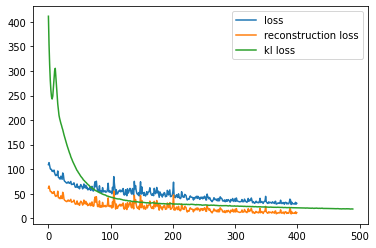

In [16]:
plt.plot(vae.history.history['loss'][100:], label="loss")
plt.plot(vae.history.history['reconstruction_loss'][100:], label="reconstruction loss")
plt.plot(vae.history.history['kl_loss'][10:], label="kl loss")
plt.legend()

In [50]:
#vae.save_weights("model_latent_16_big_dataset.h5")

In [22]:
vae = VAE(encoder, decoder)
vae.load_weights("model_latent_16_big_dataset.h5")

ValueError: Unable to load weights saved in HDF5 format into a subclassed Model which has not created its variables yet. Call the Model first, then load the weights.

### Can the network at least reconstruct the trajectory?

In [17]:
encoded_test = np.array(vae.encoder.predict(x_test))
vae_test = vae.predict(x_test)

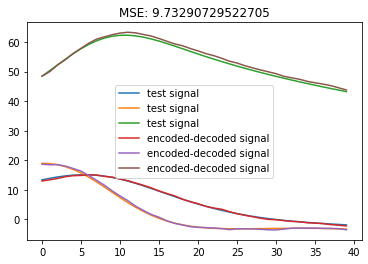

In [19]:
sample = np.random.randint(0,50)
MSE = np.mean(np.sum(tf.keras.metrics.mean_squared_error(
    x_test, vae_test
),axis=1))
plt.title("MSE: {}".format(MSE))
plt.plot(x_test[sample],label='test signal')
plt.plot(vae_test[sample],label='encoded-decoded signal')
plt.legend()
plt.show()

We can try to plot the latent space, but as we can see with dimension 16 it is really sparse.

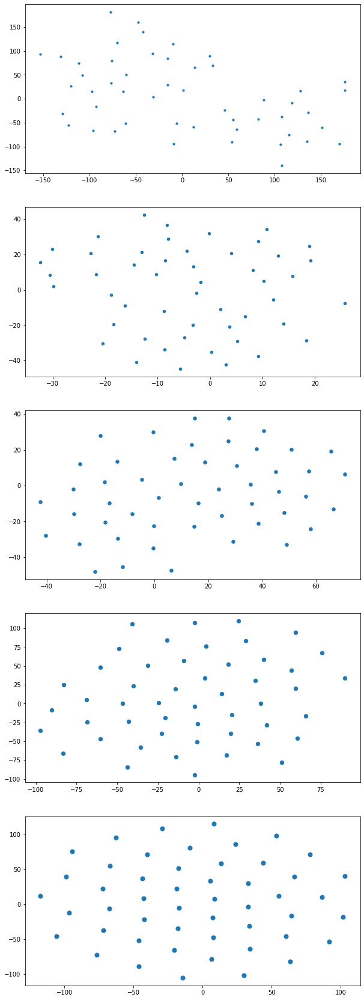

In [29]:
from sklearn.manifold import TSNE
fig, axs = plt.subplots(5, figsize=(10,30))
for i, perplexity in enumerate([10,20,30,40,50]):
    X_embedded = TSNE(n_components=2, perplexity=perplexity).fit_transform(encoded_test[2,:,:])
    axs[i].scatter(X_embedded[:,0],X_embedded[:,1], perplexity)

### Sampling the latent space

Sampling a high dimensional space without some prior knowledge as we will see can easily return noise.
For this reason, we will take the mean distribution returned by the forward pass of the test set and analyze which are the areas of the latent space produce meaningful partial trajectories.

In [20]:
mean_ = pd.DataFrame(encoded_test[0,:,:])
logvar_ = pd.DataFrame(encoded_test[1,:,:])
z = pd.DataFrame(encoded_test[2,:,:])

In [21]:
z.describe().T.sort_values(by='std')

,count,mean,std,min,25%,50%,75%,max
9,50.0,0.148467,0.750043,-0.904935,-0.359877,-0.006989,0.329693,2.414644
3,50.0,-0.046285,0.766075,-1.679465,-0.618779,0.046996,0.475809,1.867412
14,50.0,-0.827322,0.816006,-2.683313,-1.234056,-0.952872,-0.300397,0.916544
2,50.0,-0.227716,0.845592,-2.465034,-0.802221,-0.299188,0.245915,1.936802
12,50.0,-0.115161,0.874467,-2.939907,-0.409685,-0.173910,0.425870,1.937985
13,50.0,-0.116254,0.893457,-2.053551,-0.813664,-0.063437,0.295620,2.179310
15,50.0,0.041466,0.905657,-2.106598,-0.556131,0.069413,0.601649,1.879939
0,50.0,0.006961,0.927788,-1.968764,-0.720795,-0.067800,0.506474,1.853589
11,50.0,-0.208600,0.953814,-2.521852,-0.936730,-0.182269,0.536300,1.963998
5,50.0,-0.080817,0.986278,-1.917977,-0.495491,-0.290705,0.494220,2.081623


In [24]:
mean_.describe().T

,count,mean,std,min,25%,50%,75%,max
0,50.0,0.017151,0.044213,-0.165662,0.002689,0.031061,0.044744,0.078941
1,50.0,0.035422,1.240722,-2.451859,-0.827413,-0.013264,0.970788,2.599367
2,50.0,0.028866,0.187581,-0.440555,-0.092761,0.045967,0.171456,0.376229
3,50.0,0.009805,0.018055,-0.032766,0.001073,0.008192,0.018401,0.072534
4,50.0,0.378268,1.177512,-1.534435,-0.444397,-0.144545,0.990967,4.122189
5,50.0,0.005479,0.023354,-0.040117,-0.007957,0.001664,0.013745,0.096735
6,50.0,-0.008295,0.027157,-0.075253,-0.019616,-0.009137,0.003747,0.092700
7,50.0,-0.975219,1.004005,-3.601784,-1.387402,-1.023338,-0.553182,1.598806
8,50.0,-0.562662,1.262583,-2.911133,-1.717269,-0.340894,0.474419,1.347554
9,50.0,0.035234,0.027884,-0.077128,0.026237,0.037109,0.052617,0.094206


In [25]:
logvar_.describe().T

,count,mean,std,min,25%,50%,75%,max
0,50.0,-0.294553,0.015204,-0.330745,-0.300683,-0.294474,-0.285830,-0.235288
1,50.0,-4.904725,0.281004,-5.478347,-5.151310,-4.905403,-4.758305,-3.842010
2,50.0,-0.502536,0.133773,-1.011586,-0.578172,-0.492878,-0.392229,-0.282523
3,50.0,-0.392745,0.043678,-0.523046,-0.408169,-0.389374,-0.366827,-0.243926
4,50.0,-6.734386,0.464826,-7.473924,-7.178038,-6.737171,-6.464870,-5.461438
5,50.0,-0.044344,0.028961,-0.126476,-0.061901,-0.044750,-0.021208,0.008368
6,50.0,-0.127837,0.030121,-0.195673,-0.148082,-0.129339,-0.109648,-0.054289
7,50.0,-8.202712,0.585111,-9.283092,-8.658760,-8.326096,-7.811548,-6.541327
8,50.0,-8.191969,0.584646,-9.699253,-8.498099,-8.180863,-7.826686,-6.414306
9,50.0,-0.230433,0.025356,-0.303499,-0.242015,-0.227684,-0.211997,-0.157049


As we already have seen in the previous section the reconstruction of the test set is good, here we also plot the 3d rapresentation

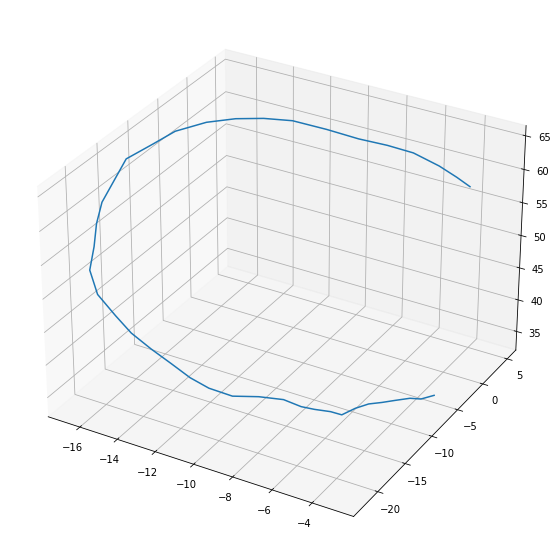

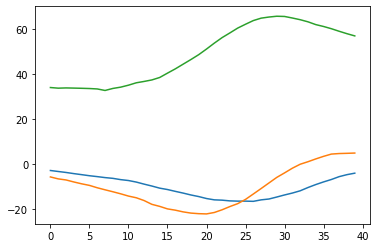

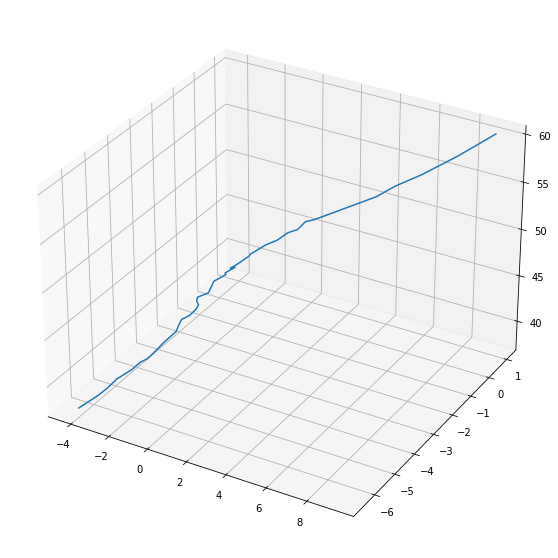

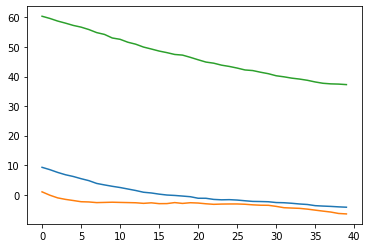

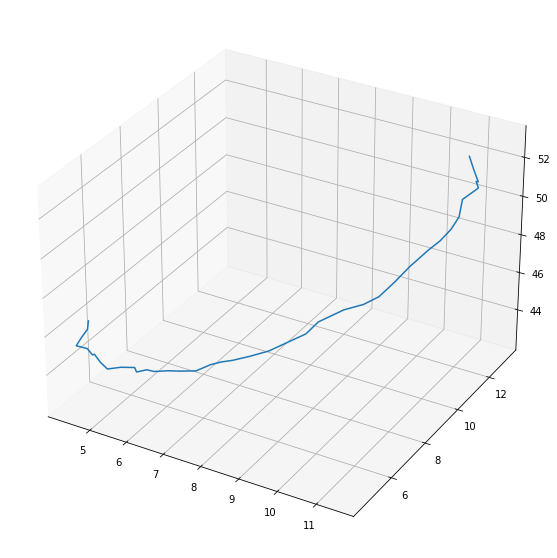

...

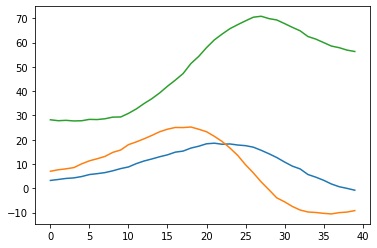

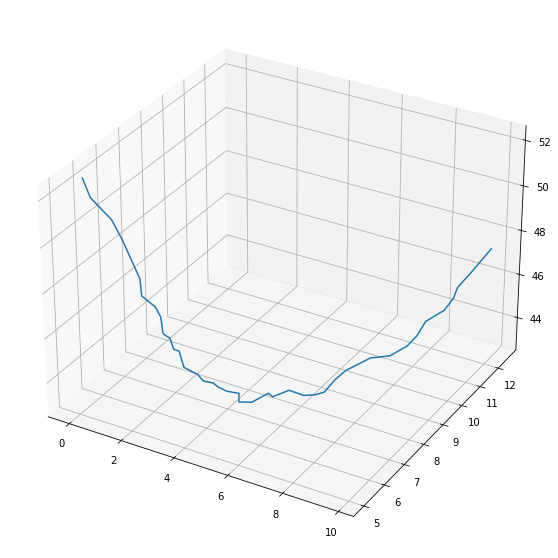

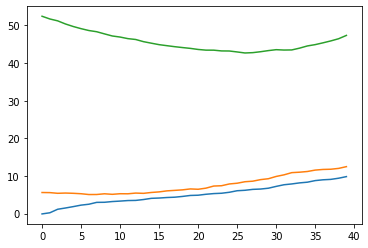

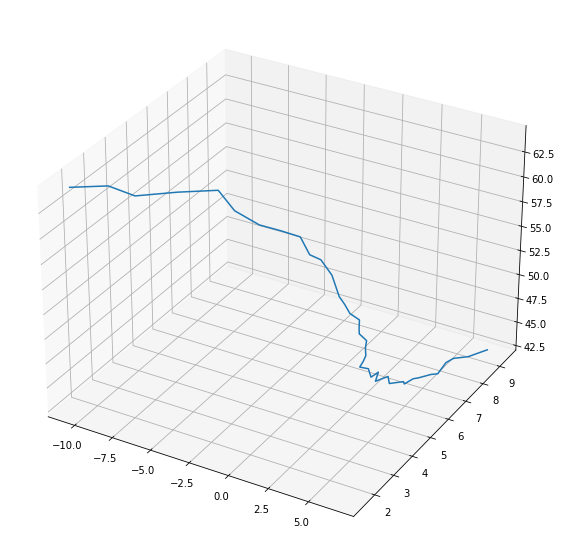

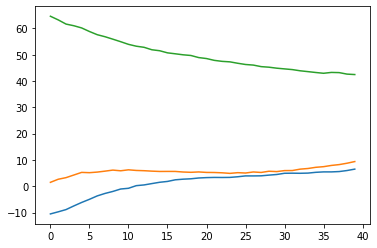

In [26]:
for sample in range(50):
    fig = plt.figure(figsize=(10,10))
    ax = fig.gca(projection="3d")
    ax.plot(vae_test[sample,:,0], vae_test[sample,:,1], vae_test[sample,:,2])
    plt.draw()
    plt.show()
    plt.plot(vae_test[sample,:,0])
    plt.plot(vae_test[sample,:,1])
    plt.plot(vae_test[sample,:,2])
    plt.show()

We can try to sample the latent space with a uniform distribution, however the trajectories that we obtain are for the most part greatly affected by noise.

In [ ]:
randomZ = np.random.uniform(-2,2.7,(50,16))
samplingReconstruction = vae.decoder.predict(randomZ)

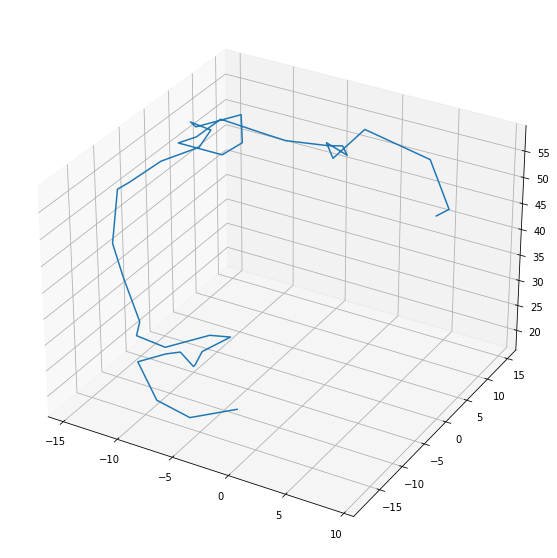

[-0.59447122 -1.5503444   1.01723701  0.99862204 -1.17865031  2.37157101
  0.47319904  2.06812284  0.33273525 -1.18297286 -1.94633571 -1.69513257
  2.07236102  2.55009758  0.25331224 -0.39230266]


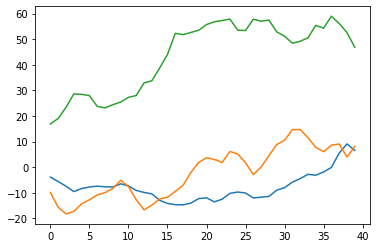

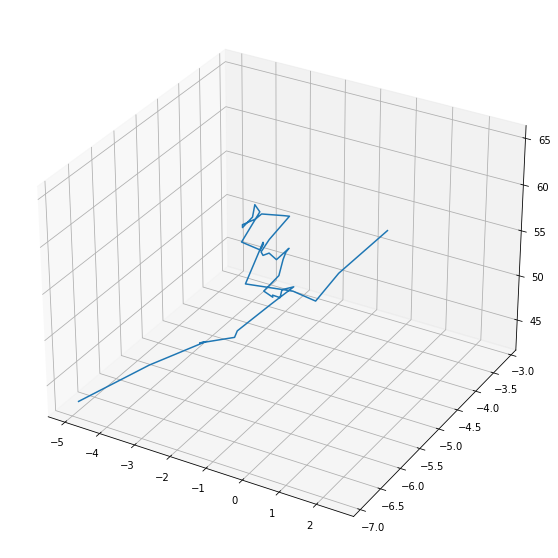

[ 0.70988475  1.40958542 -1.60436744 -0.37045444 -1.41552453  0.28116885
  0.36231276  0.74952389 -0.4674948   0.20875877  1.44634945  0.28053973
  2.34993637  1.43136811  0.28999415  2.25727637]


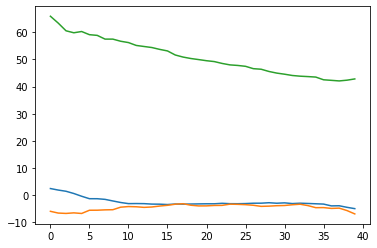

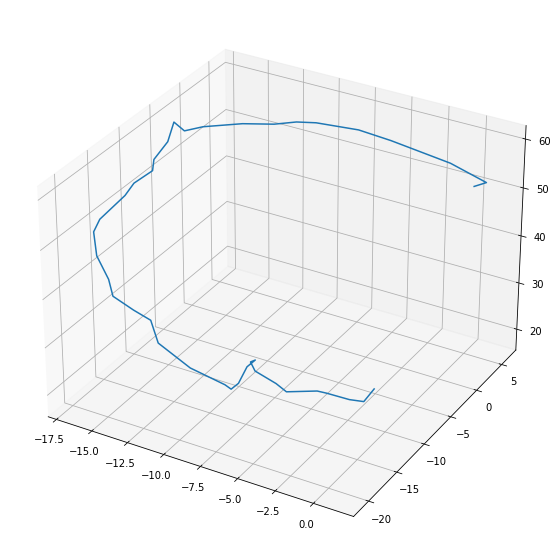

[ 2.12800565 -0.23078045  0.26443167  2.14362025 -0.02684887  2.10364242
 -0.355238    2.13151246  0.88145321  2.54104436 -1.64577672 -1.4714985
 -0.52888125  0.45065106  2.52759158 -1.42926125]


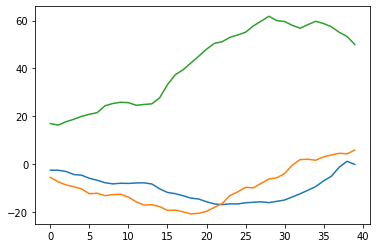

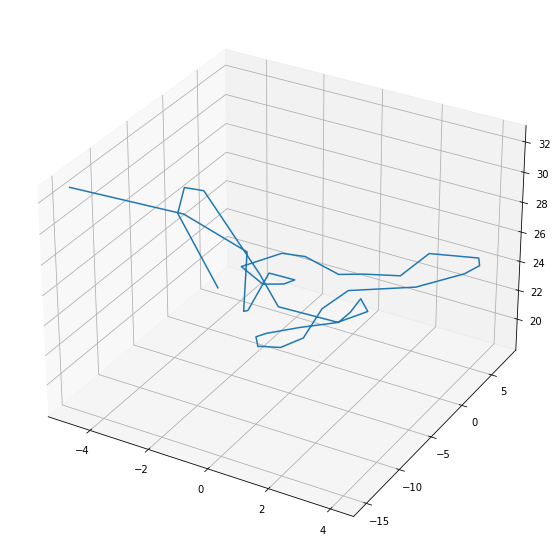

[-1.1271635  -0.42939406  1.11372266 -1.92455378  2.36227259 -0.79765688
 -0.43262261  1.36995034  1.67610249  1.60014781  1.32169032 -0.28244158
 -1.37676164 -0.04886721 -0.863542    1.61504193]


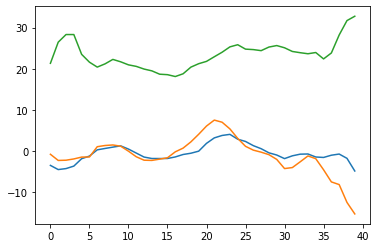

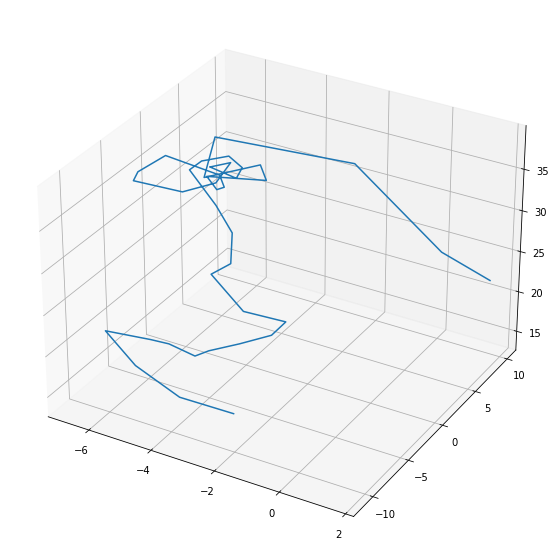

[-0.223994    0.84240963  1.75425863 -1.61577259 -1.91229722  0.38045579
  1.73303832 -1.51630828  0.93017816 -1.72878942 -0.0205148  -1.7083186
 -0.25060357 -0.55323764  1.93235725  2.32182573]


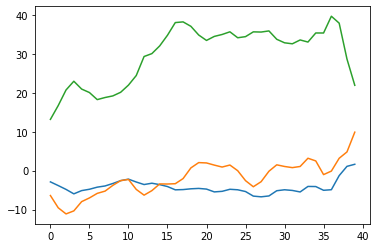

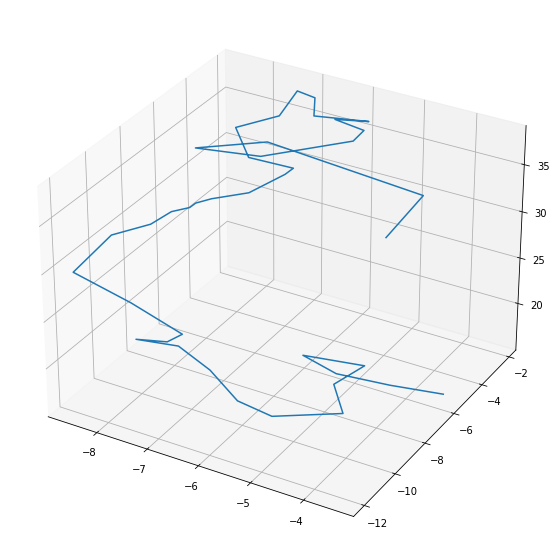

[-0.17282203 -0.35370913  1.30988192 -1.61365204  2.2427263   0.60600254
  0.95286819 -0.40249188  1.99418121  0.34670791  2.37099334 -1.57367766
  1.31387621  0.82044797  0.3873787   0.86184446]


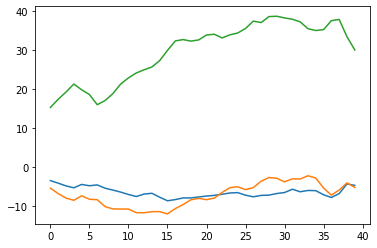

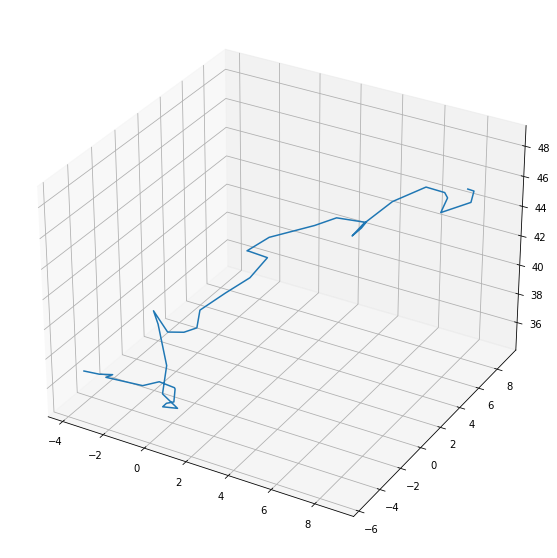

[ 2.64679757 -1.71892397  0.05982582 -0.23202917 -1.33210533 -0.16198734
 -1.67758117  2.35263384 -1.46581236 -1.09663536  0.05909699  2.0482412
  1.15594263  0.45979233  1.93654776  1.22799403]


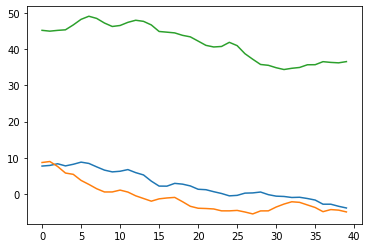

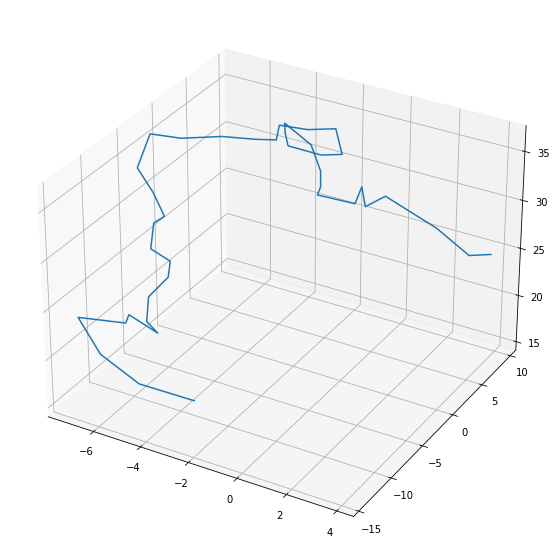

[-0.48612069  0.66527516  1.05195806  0.35759468  1.40505833  1.23746428
  1.3588586   0.22037403  0.96485842  0.21966341  0.3556687  -0.70912292
  1.63569866  1.47536012 -1.80749101  2.2496557 ]


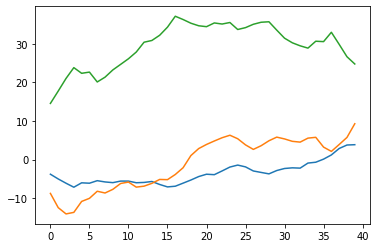

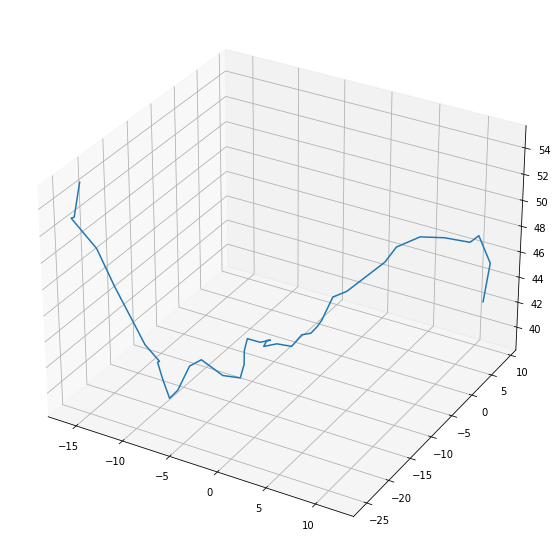

[ 2.44616304  1.05586912 -1.08675685  2.12228101  1.71442091 -1.10269505
 -0.22766472 -1.08643238  0.54930653  1.02041091 -1.16616109 -1.51859446
  0.62066261 -0.79896555  2.69075823 -1.20917678]


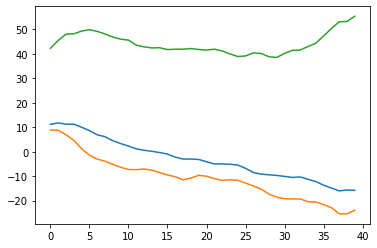

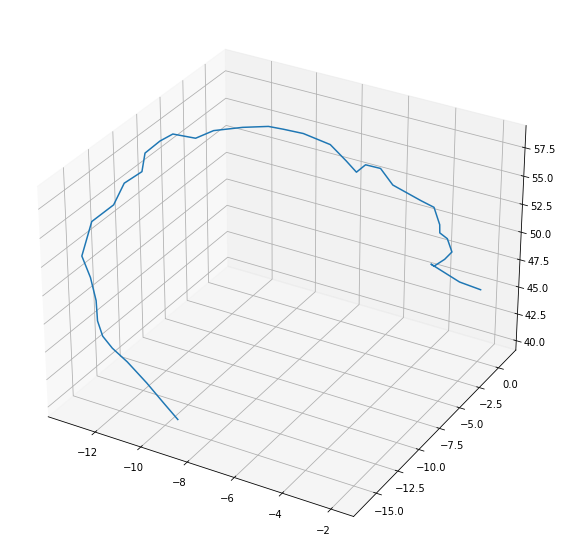

[ 1.96470123 -1.28110012 -1.45431373 -0.66823021  1.1091507   1.50470289
  0.72333332 -1.67686188 -1.50978488  1.57696241  0.10882085 -0.93174806
 -1.40674222  0.27864705 -1.01926475 -1.81350986]


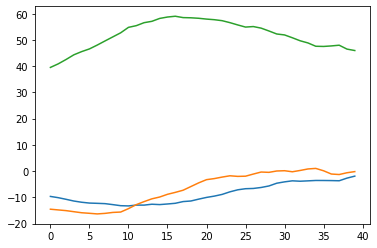

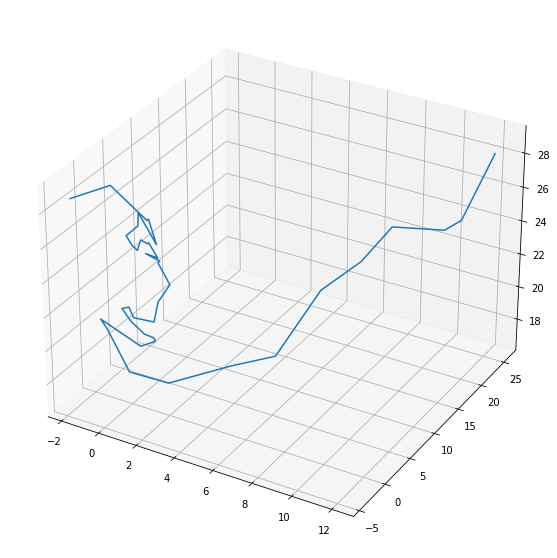

[ 0.21035831 -1.78929146  0.53646544  2.04485419  1.63829452  0.56614126
 -1.59771634 -1.17393544  0.56858919  0.26659564 -1.94225853  1.05115612
  1.21838496  2.04289566  0.45692892 -0.34177802]


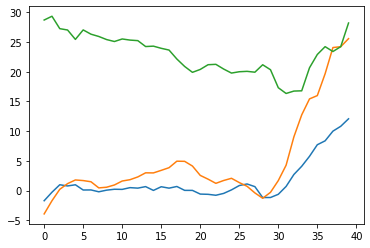

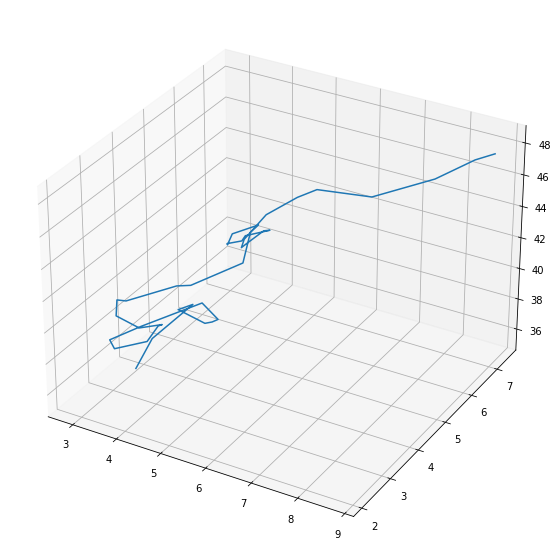

[ 1.47190916 -1.25609515 -0.52122201 -0.25823326  0.29725275 -0.11194706
  1.15209694 -0.16837832 -1.41161893  2.18581463 -0.88018145  1.81257155
  2.44732666  1.87553202 -0.25242098 -1.97174578]


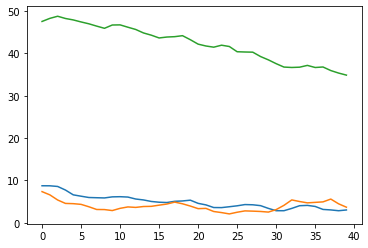

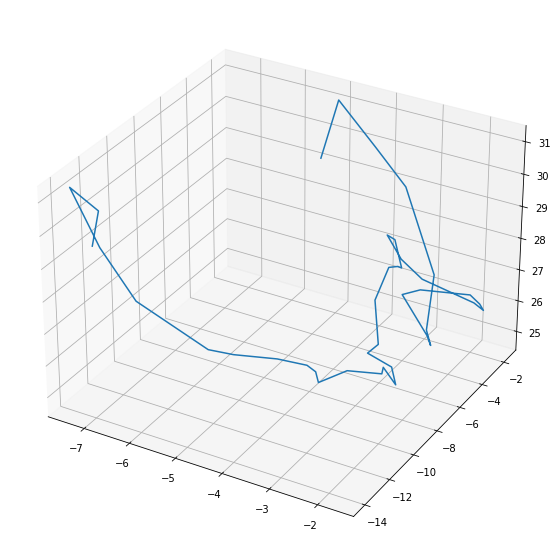

[ 0.87565305 -0.38209023  1.03923294 -0.91933107  0.6230416  -0.26109852
  1.02194335 -1.9161966  -1.40897603 -1.98433953  1.61182249 -0.72219784
 -0.33133971 -1.26192071  0.42332788  0.26185319]


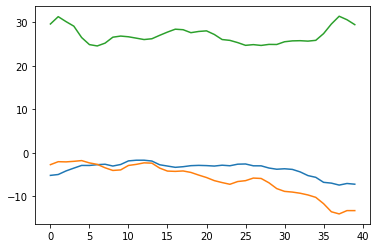

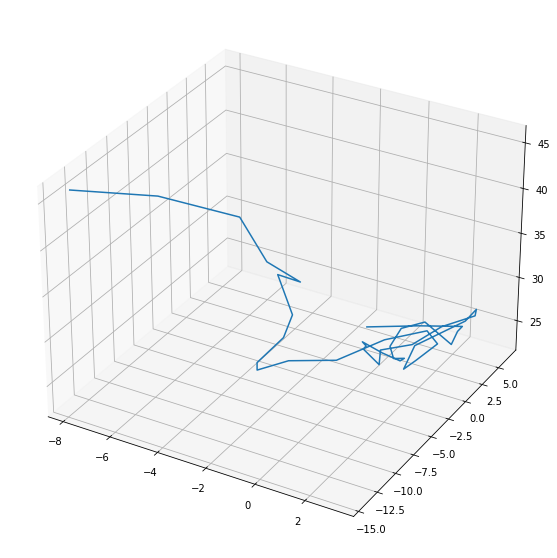

[-1.2275051   2.20277604 -0.91451977  1.65952437  0.70092919 -1.19623203
 -1.7337291   1.03608363  0.39598795  2.40584026 -1.78384211 -0.59095507
  1.83585804  1.26556316 -1.35230561 -1.30497712]


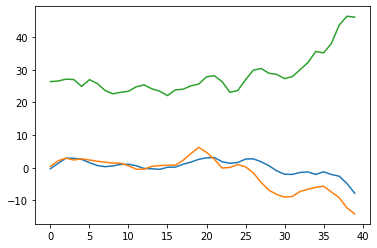

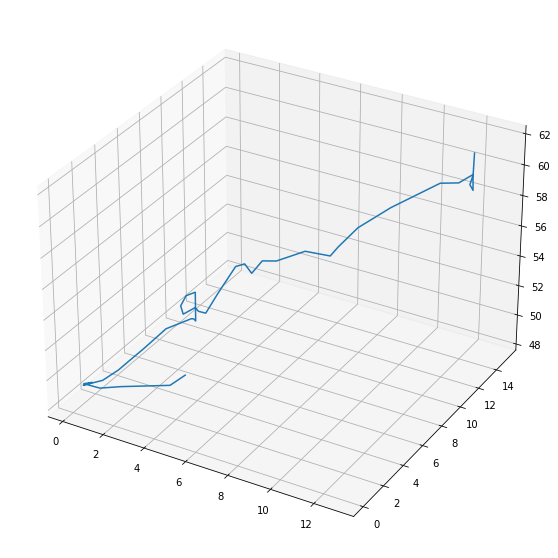

[ 1.02077833  2.04938801 -1.16189545  2.46538818 -0.8778969  -1.06372503
 -1.78509522 -0.87808531  0.6008994   0.80767914  2.07385841  1.57694991
  1.49671983 -1.32850975 -0.58868459 -0.55602425]


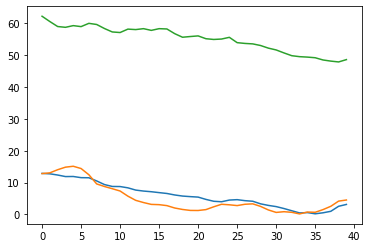

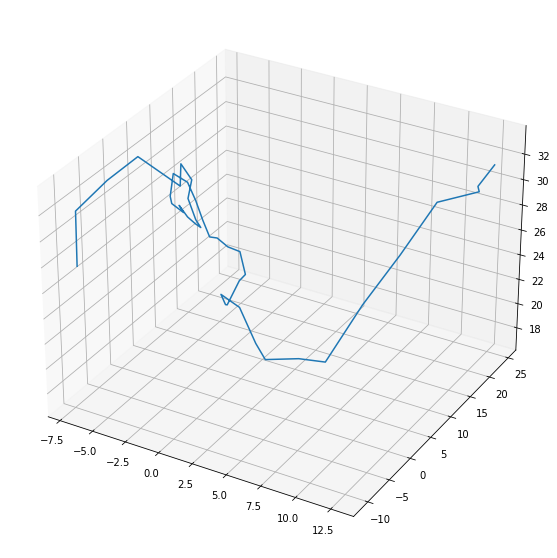

[-0.75739346  0.85133052  0.07528507 -1.10050743 -1.0822641   1.21542744
 -1.66540509 -0.26684621 -0.54294628  2.36634442 -1.22785482  0.63916101
 -1.5805657  -0.71255967 -0.28170605 -0.49082123]


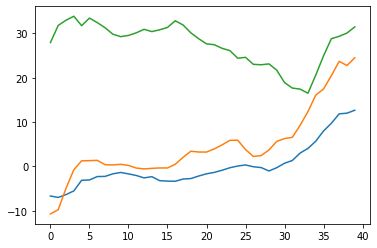

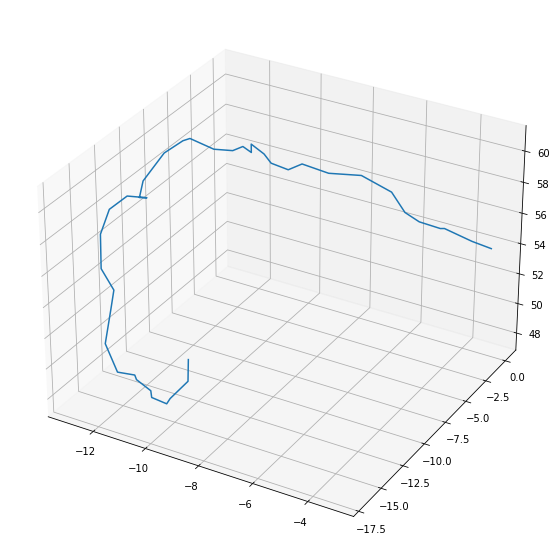

[ 1.72109404 -0.30037053 -1.65147546 -1.11979731 -0.51035756  1.12581587
  0.63316588 -0.8989421   0.62719104 -0.95933037  2.02361409 -1.35771823
  0.66519029  1.87828411 -0.51062777  2.32047803]


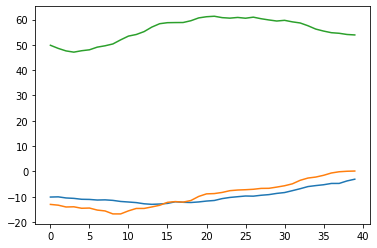

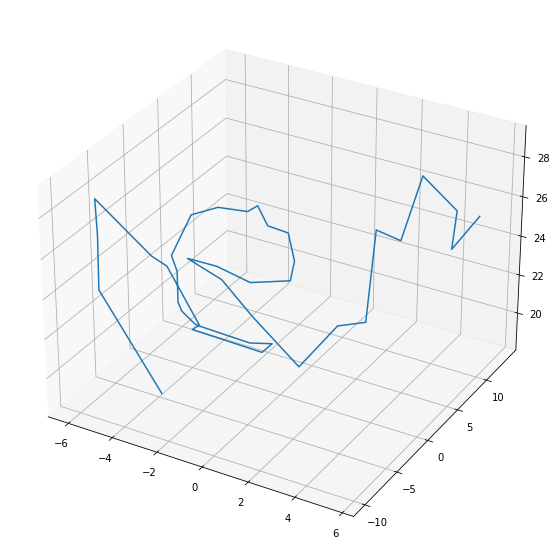

[-0.23721775 -0.89427995  1.6696631  -1.42534141  1.97597425  0.90251447
  1.66683386  1.20885016 -0.76032658  0.48475058 -0.6567176   0.59863505
  0.84911225  0.82086133  0.34656539 -0.30345333]


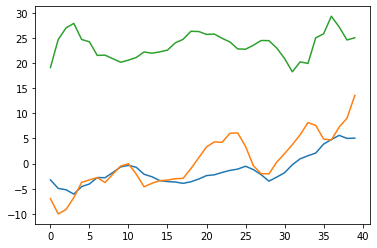

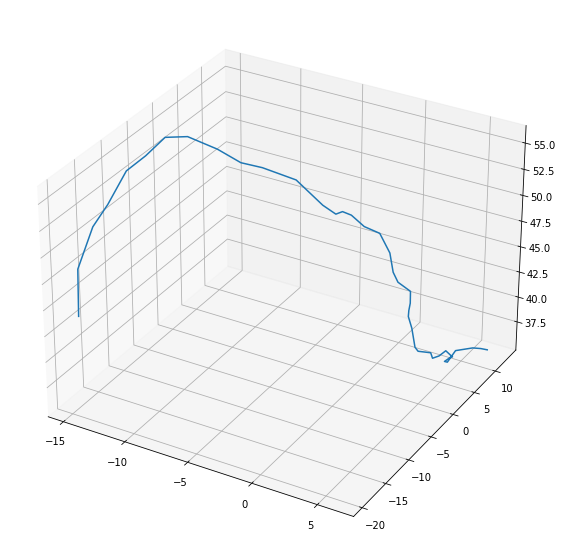

[ 1.78320804  1.84639008 -0.31739586 -0.13967251  0.20716198  2.23932971
  0.25552517 -0.65795347  1.2235269  -1.41162914 -0.22569699  2.51439689
  1.37268887 -0.21842295 -1.2125771  -1.51360546]


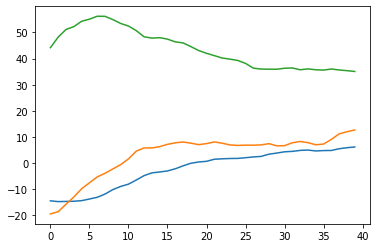

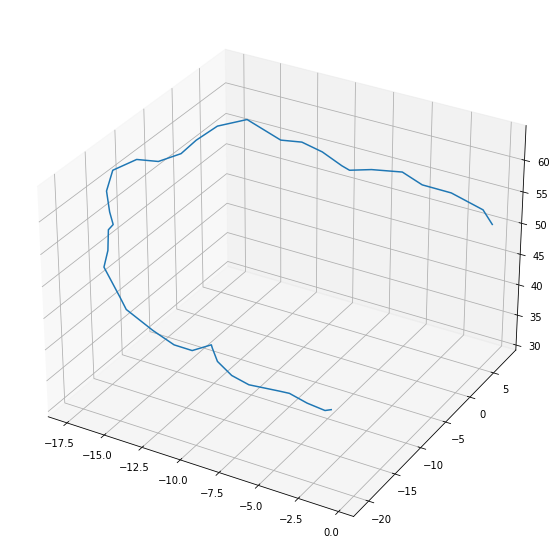

[ 1.33914784  0.94492149 -1.65407991 -0.37917768 -1.06192474  1.83848572
  1.0264239   0.60978152  0.59710063  0.0374966  -1.63410036 -1.84650678
  0.55517219  2.63500188 -0.8883837  -1.71177525]


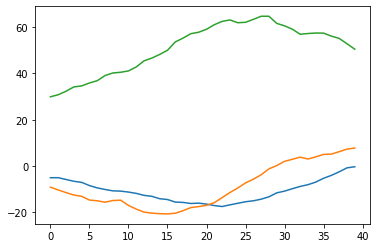

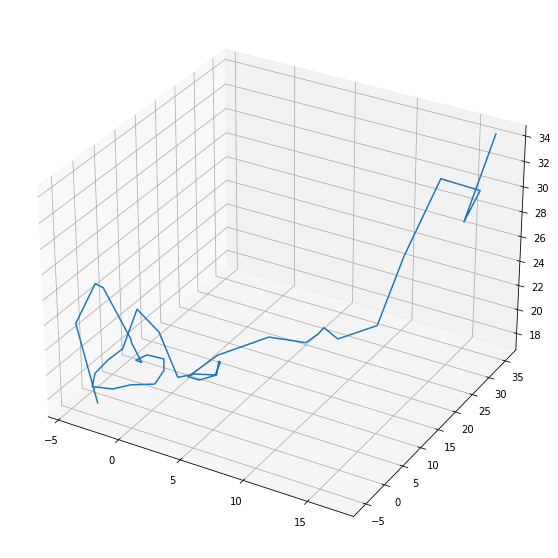

[-1.69650612  0.48520719  2.60317301  0.82255807 -0.77073676  0.18699408
  1.41344813 -0.28029231 -1.61152083  0.23305832  0.74209719  1.19689561
 -0.5592962   1.60824155 -0.62829637  0.02123151]


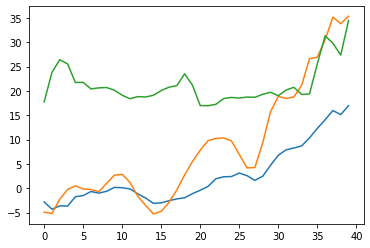

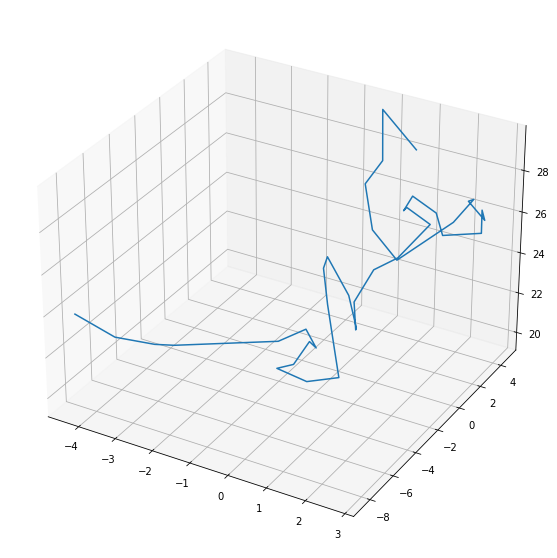

[ 2.62864904 -0.73004722  2.26348046  2.30768093  0.78227624 -0.08669865
  0.75841214  1.16666258 -0.96911165  1.34734621  1.06664872  1.96023346
  2.12349221  1.04666221  1.71477289 -0.85600879]


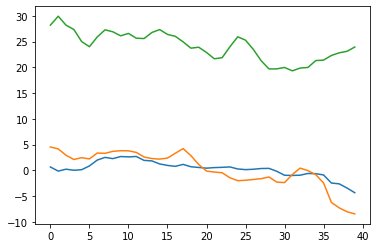

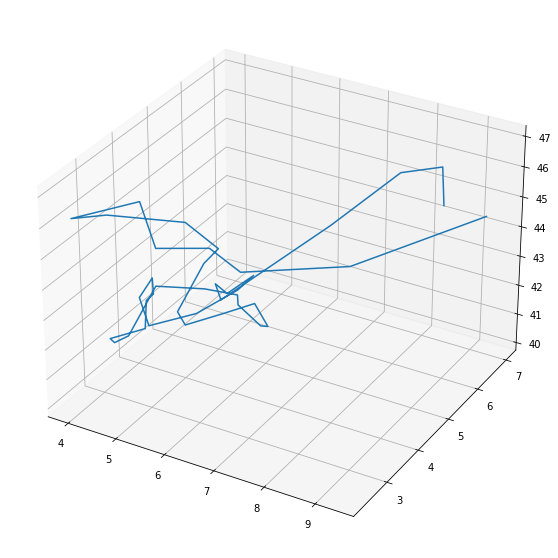

[-1.88907044  0.89156801 -1.84163998 -1.39545695 -0.33894377 -1.21535805
  0.83869219 -1.28934991  2.47206239 -1.6391594  -0.11356473 -0.6127569
 -0.23473441 -0.8089333  -1.42889347 -1.4083845 ]


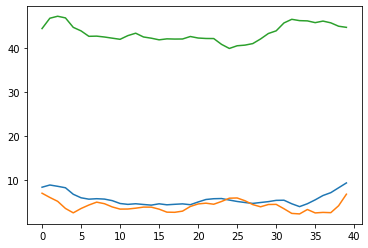

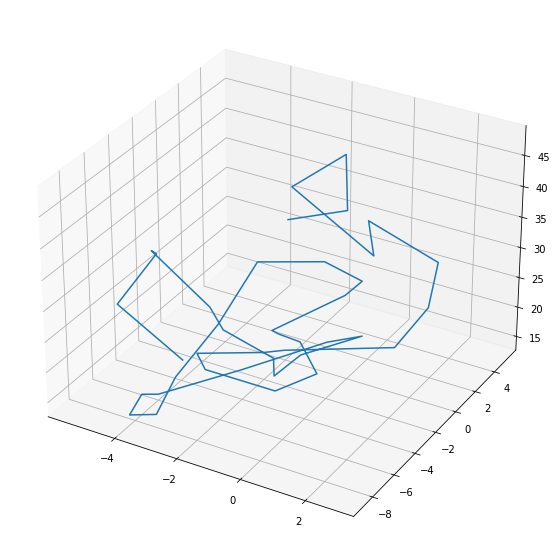

[-1.70950672 -0.84203906  2.07386581  2.01944138 -1.95668602 -1.45533272
 -0.35977189  1.46937741  1.48830624  0.31026785 -1.52884685 -0.54921327
  2.34853654  0.87816417 -0.48404043  0.36261884]


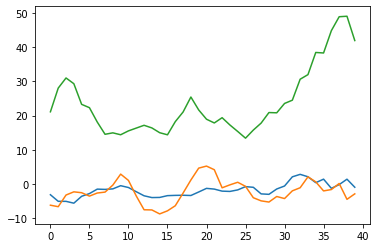

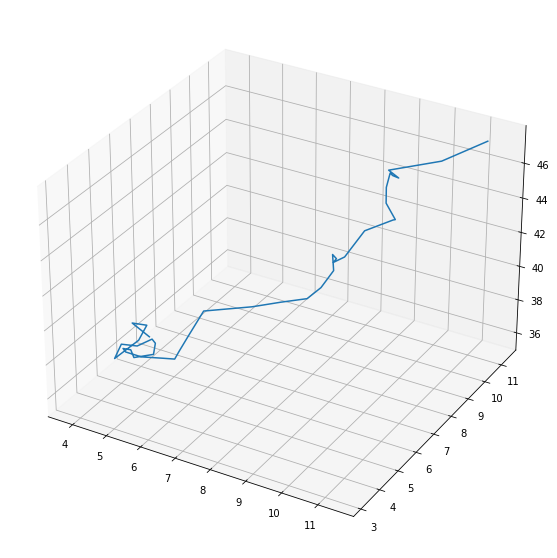

[-1.63632327  2.67520185 -0.82156136 -1.73917884 -0.09196966 -1.1312093
 -1.15382927 -0.40156668  1.77472478  0.48785767  1.0356296   0.56979867
 -1.54092942  0.27685222  0.59848279 -1.32795899]


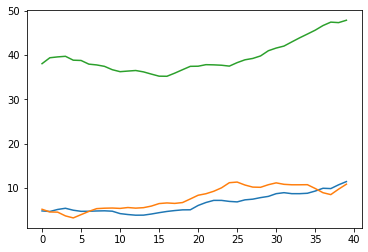

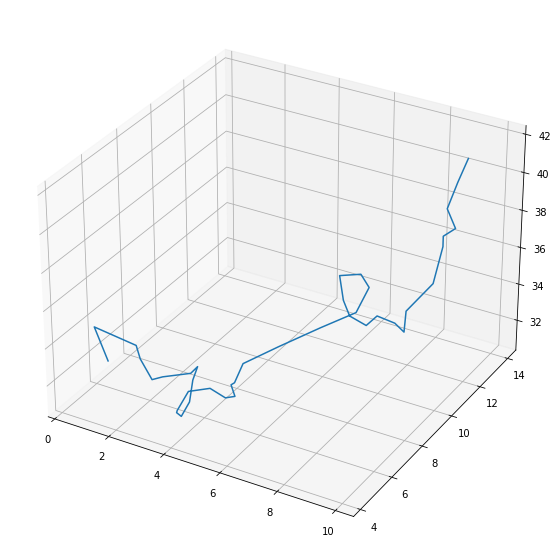

[-1.1280594  -0.25743009  0.34899574 -1.00968674  1.27207849 -0.86449509
  0.61273261  0.83126314 -0.76689977  0.3270888   2.23302721  1.22163612
  0.64720193  1.04050092 -0.89770147  1.72931478]


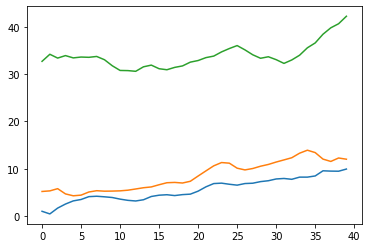

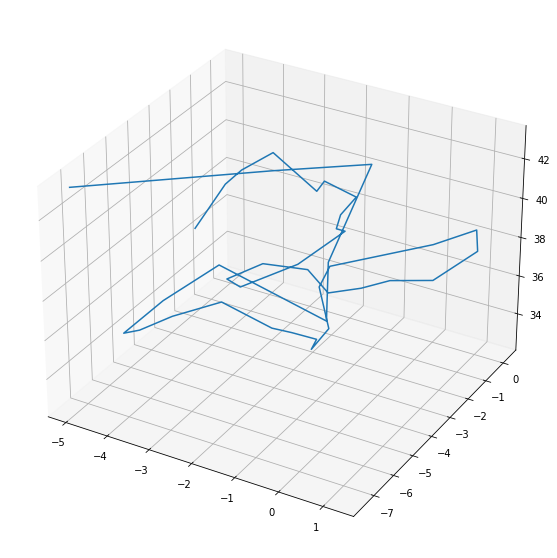

[-1.66452044  0.906722   -1.30000682  0.17631723  1.24992909  0.11122135
  2.30357581  2.27695207 -1.05540326  1.06831471 -0.43097942 -0.56387732
  1.4343584   1.90699856 -0.51187705 -1.26968613]


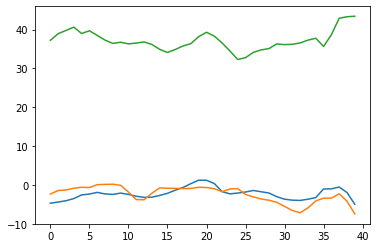

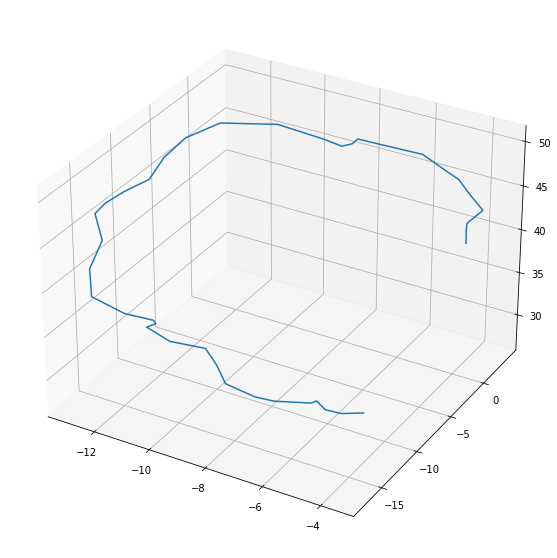

[ 1.12637213 -1.5165994  -0.16595349  2.1911877   1.43821769  1.73218686
 -1.20480093  1.69675506 -0.59123042 -0.54804156  0.99198876 -0.69794369
  0.37747299  2.66230681  1.46228847 -1.42284771]


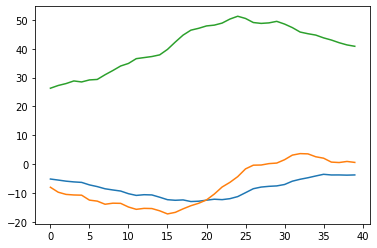

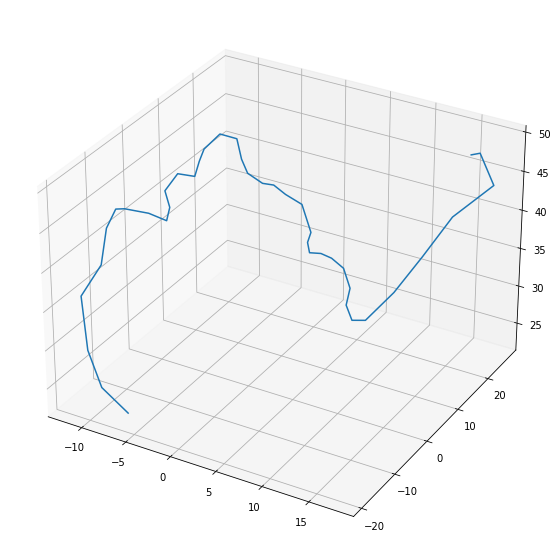

[-1.24962059 -0.47840482 -0.36526472  1.00612108 -0.42755659  2.59046212
 -0.23474521 -0.30564945  1.53523951  2.44534142 -0.17815644  0.61068539
 -0.8441023   1.1106003   2.12842423  1.94743802]


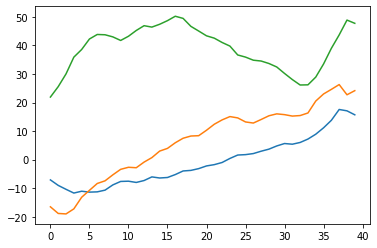

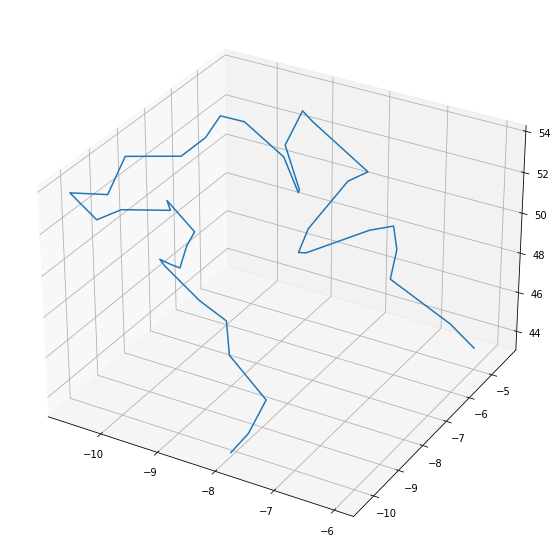

[ 1.9969552   0.26441169 -1.59341042 -0.80451606 -1.32213786  1.08431053
 -1.4625331  -0.91582905 -0.67692996  1.18845918 -1.59941255 -1.0079872
  1.53679839  2.10650431  1.20392967 -0.7575827 ]


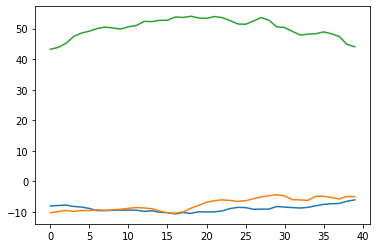

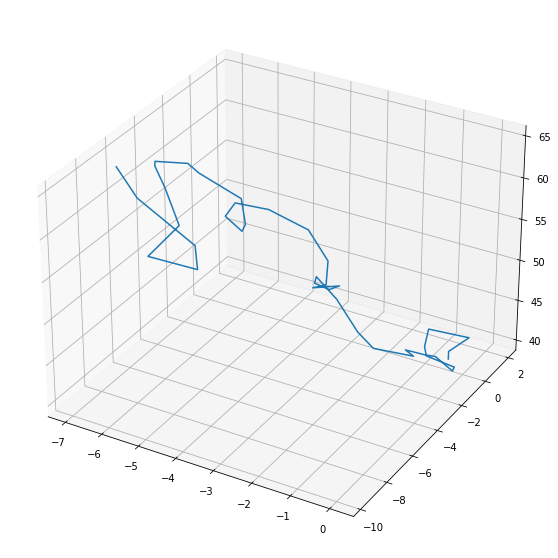

[ 2.68543814 -0.15337626 -1.01605767  1.99511327 -1.24349419  1.38207337
  1.95818219  1.71673842  0.79774655  0.3826621   0.4852594   1.93974915
  0.33417491  2.02732747  2.64014019  1.9940456 ]


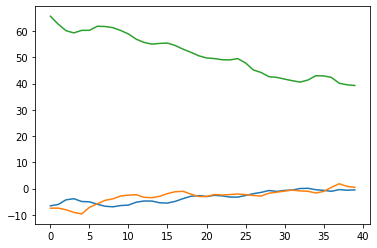

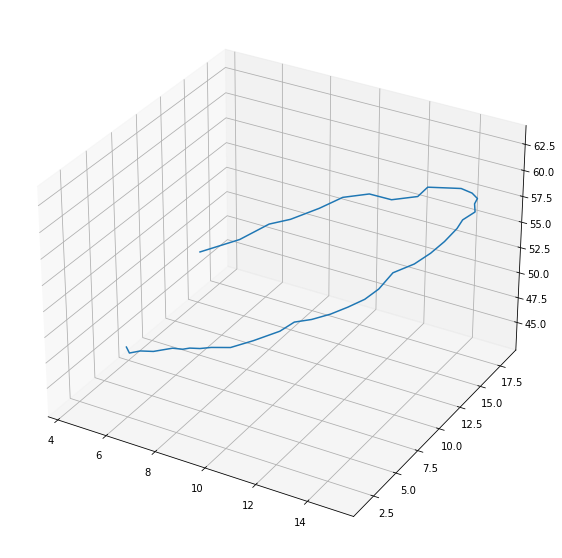

[-0.85574418 -1.98645614 -1.37619059  1.54062544  1.22553909 -1.82265223
 -1.94134328 -0.23311006  2.66977121 -0.44083109  0.23954171  2.50945253
  0.75735688 -0.69678135  0.90246741 -1.96619845]


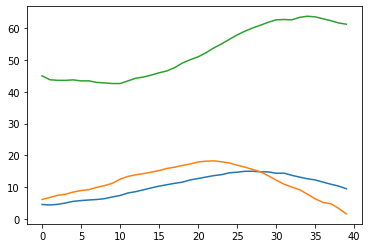

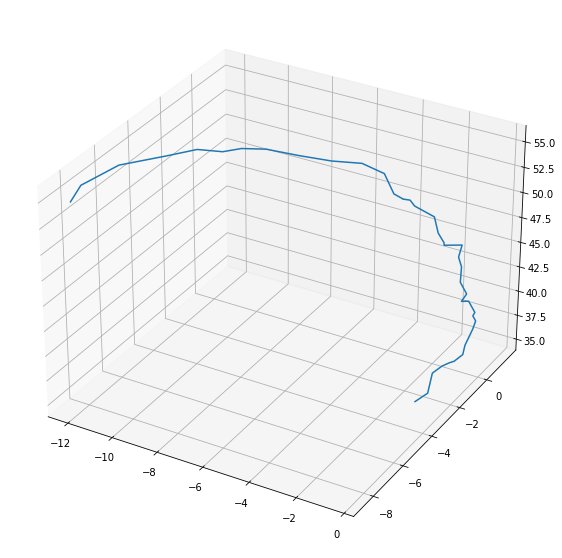

[ 1.34075503 -1.49391541 -0.92646843 -1.07081144  1.70428106  1.04109446
  1.04805079 -0.75464843  2.08987651 -0.33808552  0.28584558  0.7924303
  2.21749961 -0.13202782  0.46003417 -0.89959137]


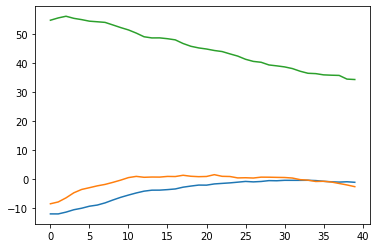

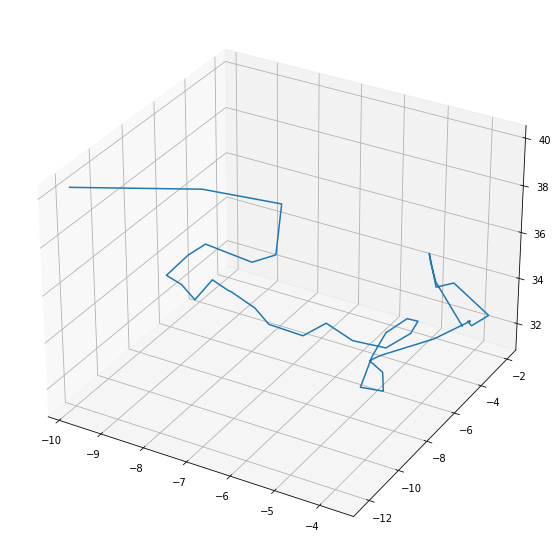

[-0.86754122 -0.49129364 -0.35647394 -0.59599131 -0.76037925  0.04626981
  2.26077884  1.05429541 -1.50394567  1.84902314  0.48551057 -1.23431317
  2.16670723  1.96053268 -1.05725918  2.32796789]


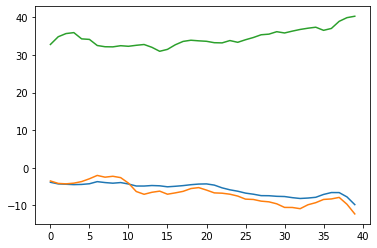

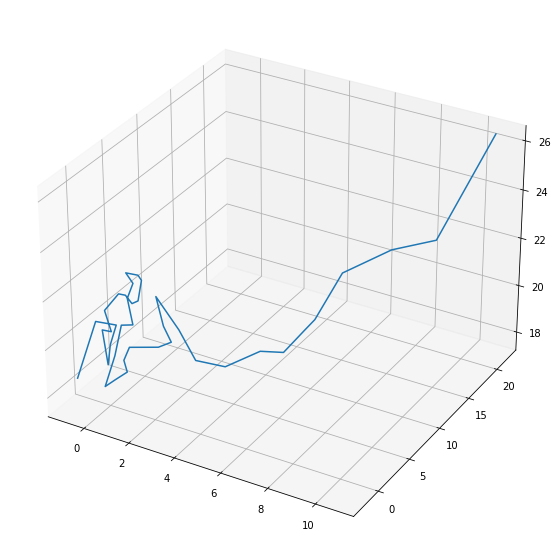

[ 0.05903807 -0.14431691  1.64914416 -0.73870566 -0.06838298 -0.57528489
  1.46311004 -1.97378487  1.39574846  0.40585263 -0.32549144  0.58824025
 -0.23020038  0.42065185  0.75913651  1.23543346]


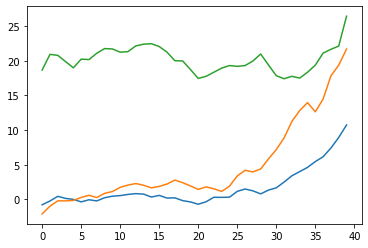

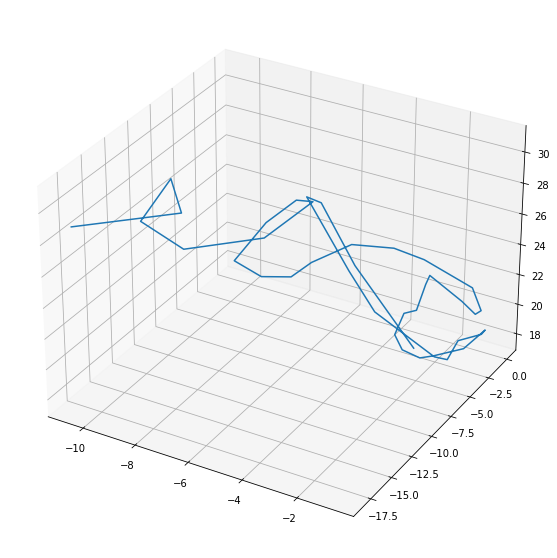

[-0.0047211  -1.35512919  2.66301036 -0.99546719  1.16743497 -0.81990749
 -1.36448193  0.59118368  0.28164166 -1.84933856  1.77188484 -0.90809313
 -1.82496011 -1.53733161  1.65861037 -0.05225669]


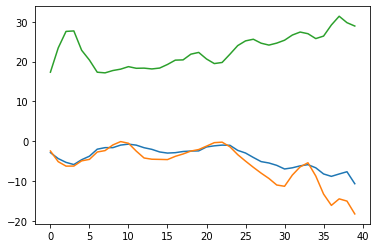

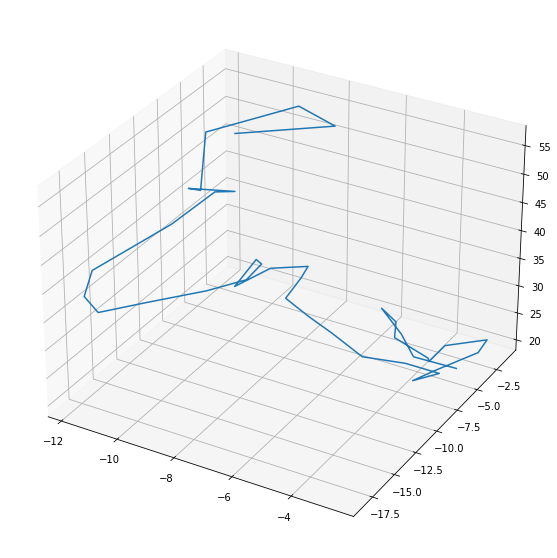

[-0.41734486 -0.84356347  0.6719039   1.54583876  1.60523265  0.09534528
 -1.76579114  2.67907877 -1.83295071 -1.72089116 -1.99591251 -1.48852483
  1.95627592  1.16940744 -0.4303825  -0.94639316]


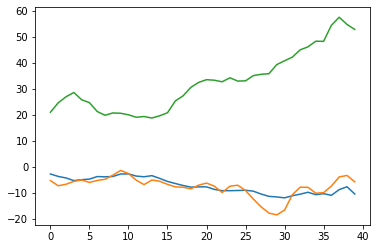

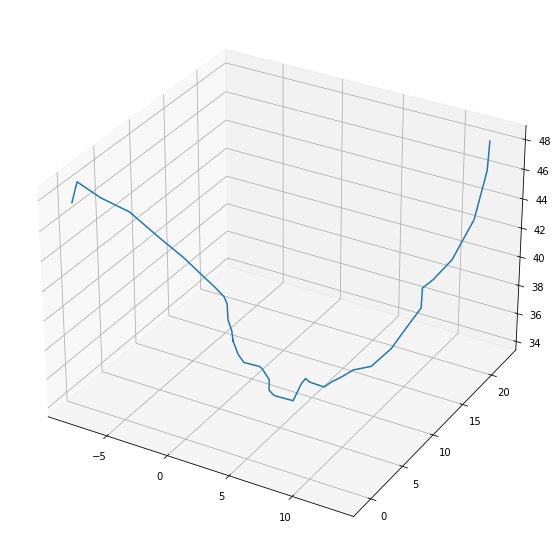

[-0.83832507  0.58954013 -0.02965634 -1.50875418  2.64648045  0.64426287
  0.8599363  -0.37923163  0.93392127  1.26649543  2.08257721  2.05061875
 -1.34734316  0.19112785 -0.22916845 -0.18608976]


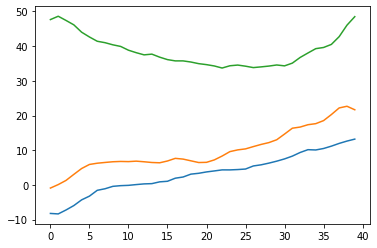

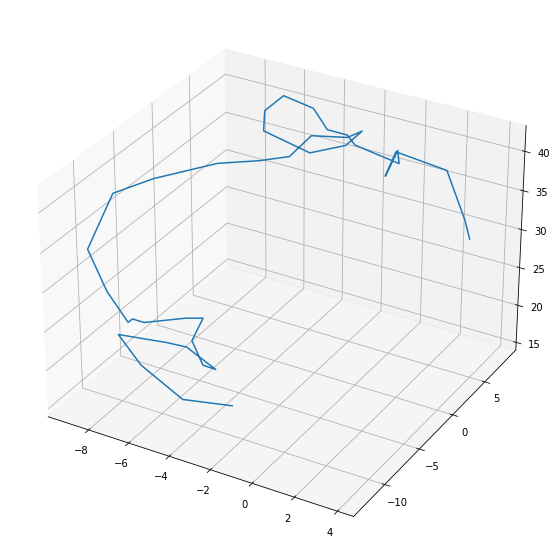

[-1.92178578 -1.98649416  1.4208652   0.77825271  2.43336882  0.7571482
  1.32112956  0.57804155 -1.47831017  0.0791983   1.99491128 -1.89629006
  1.08957682 -0.47044956 -1.10572974  2.29710414]


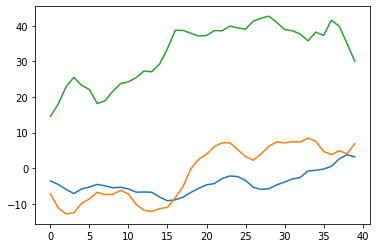

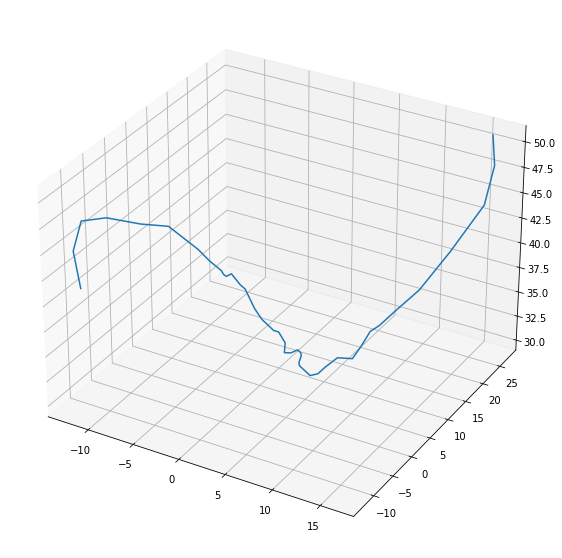

[-1.94300545 -1.34733806 -0.0311002   0.82825534  0.13675813  1.08037471
 -0.33074339 -0.7926274   0.33637612  0.75144922  2.67905523  1.123086
  1.56001929  2.0458519   2.09339717  1.29069672]


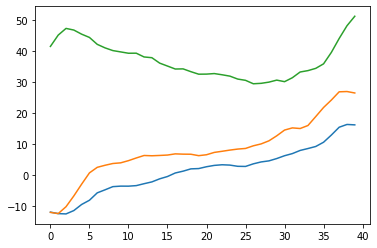

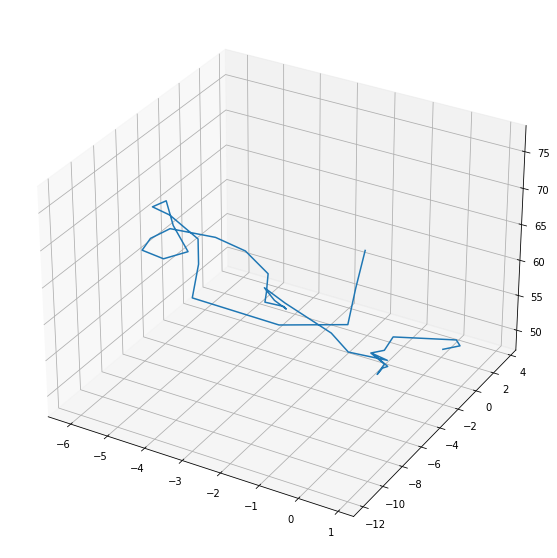

[ 1.81572564 -0.39918502 -1.70440318 -0.33655937  2.41534195  0.96129232
  0.2810846   2.42692511  2.48748843  0.0847743   2.30346371  1.68695663
 -0.24324027 -0.49817714 -0.54240724 -0.0740791 ]


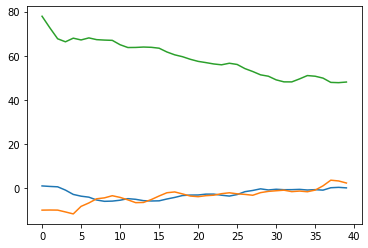

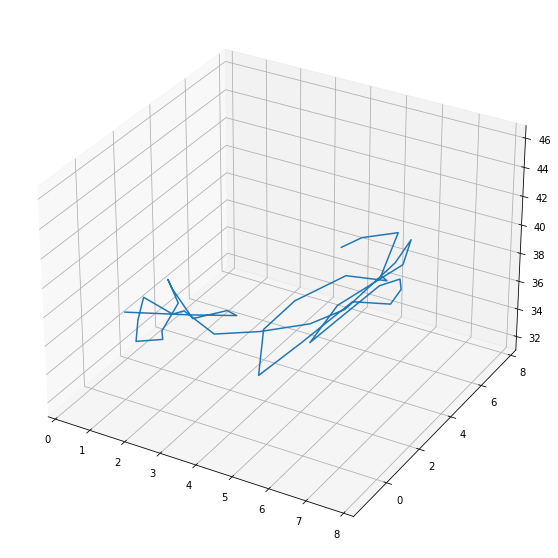

[-1.05248039 -1.43083782 -1.576091   -0.81706563  2.15887124 -0.30690598
 -1.17346573  1.69813476  0.99082162 -0.89254946 -1.92649979  0.95394865
 -1.03553485 -1.11788772  0.59063161  1.65901527]


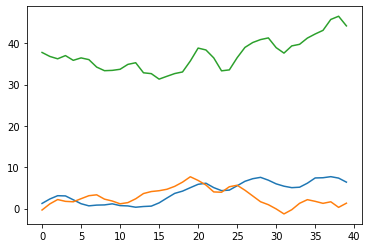

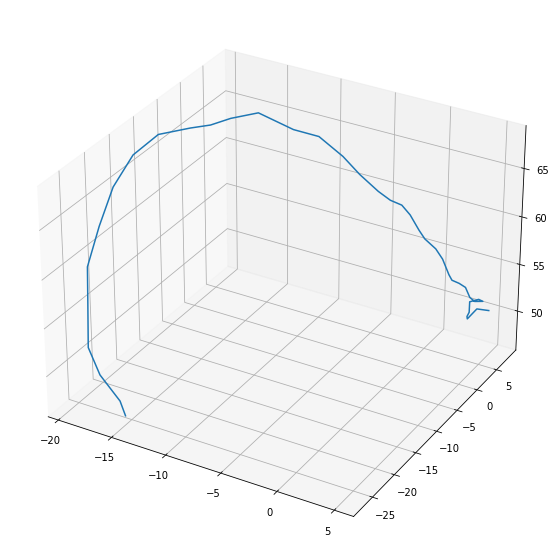

[ 0.81750064 -0.90475599 -1.57863288  1.19487024 -0.74467173  2.28494669
  1.42121612 -1.94434502  0.39784984  0.40187377  2.534146    0.58676002
 -1.47352115 -1.23162719  0.34473872 -0.80070952]


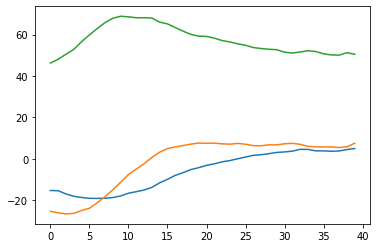

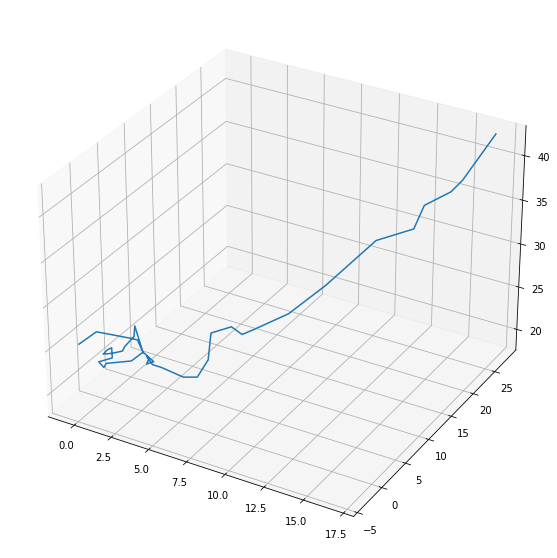

[-1.16185092  2.0422102   0.04611467  1.99267887  2.64453632 -0.50971272
  0.50846138 -1.5095797   0.46190672 -0.41584125 -1.92050437  0.90193349
  0.82815229  0.59584455 -1.57658299  1.26981431]


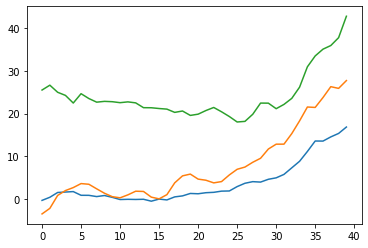

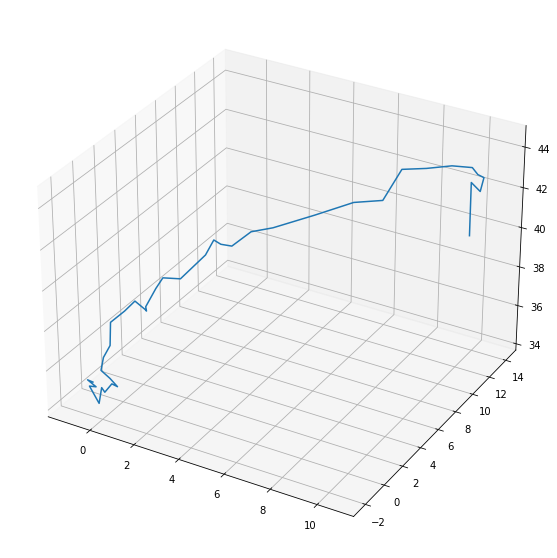

[ 0.63943078 -0.251816   -0.03789116 -0.64358329  2.01248072 -1.20017203
 -1.76445748  0.21160867  0.37285975 -1.35482016  1.88857649  0.6230793
  1.0858165  -1.85001397  0.91013893  0.6446392 ]


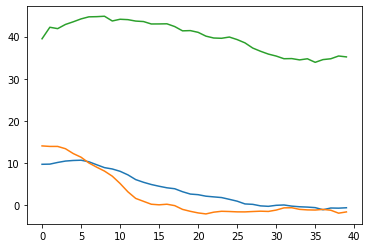

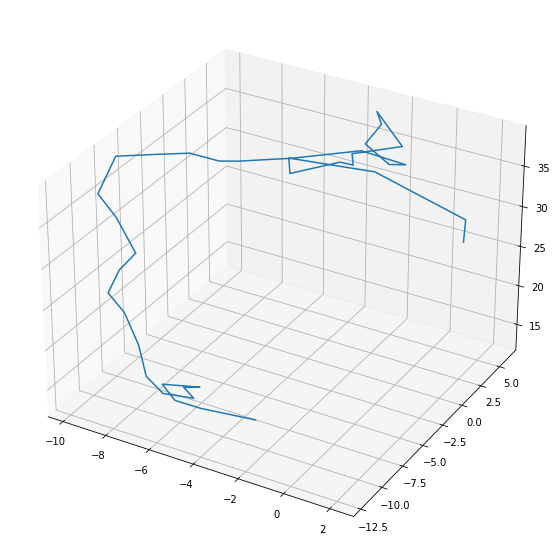

[ 0.43271382  2.47419984  1.51085722 -0.54668421  2.24850076  1.17024478
  1.43248551 -1.43562282 -1.1313235  -1.88487325  1.38831999 -1.38965961
  0.89135878  1.45836194 -1.5458298   2.59718524]


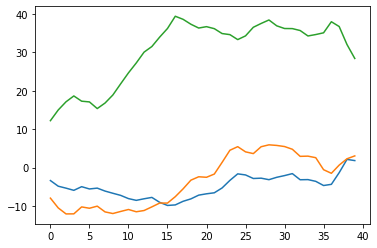

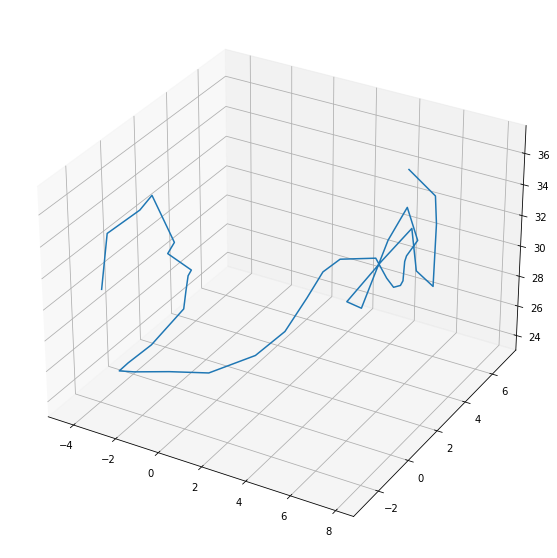

[-1.74185236 -0.81225134 -0.19022429  0.31295447 -0.84024677  0.0244605
  1.05935998  2.12428289  1.34125884  2.66527937  0.46933487  0.39736607
  1.47906016  1.39923173 -1.67895667 -0.33027911]


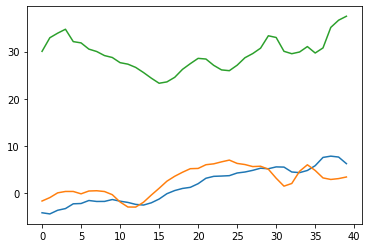

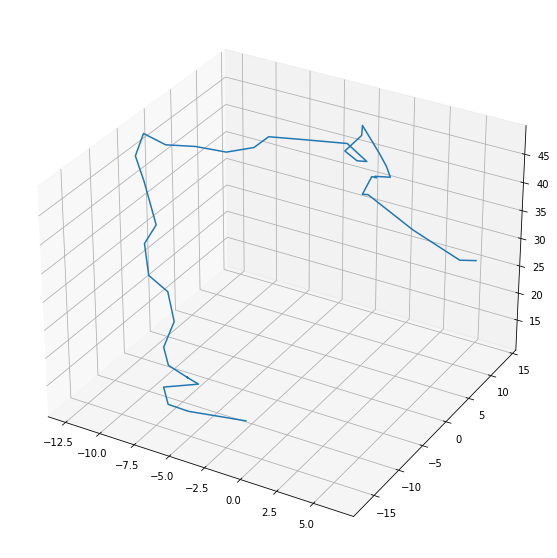

[ 1.96743578  1.91288006  2.26078136 -0.32237418 -0.61773301  2.30449394
  1.24167091 -1.39164282 -1.45364472  1.90986213 -0.44685469 -0.90960866
 -1.35504091 -1.08752036 -0.32622694  1.90720296]


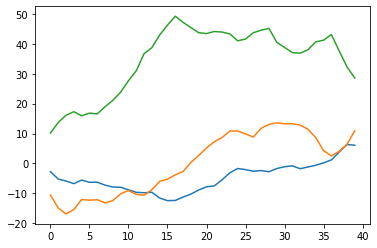

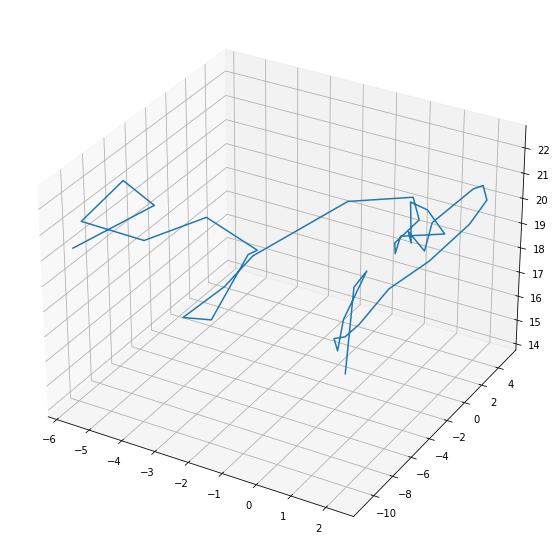

[ 1.59886571  2.38175708  2.48257766  0.12017656 -1.80042155 -1.82437636
  2.236201   -1.64384381 -1.32902013  2.32991471 -1.11755486  0.02704357
 -1.97267782 -1.93145137 -0.01137416 -0.36494165]


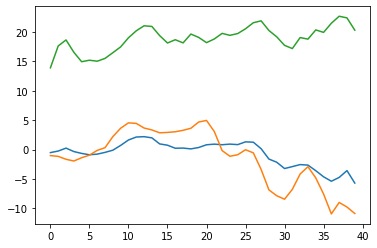

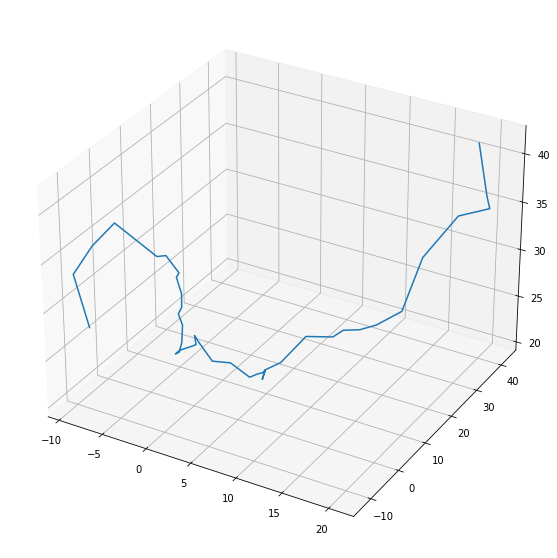

[-1.41387727  0.16281115  1.35030972  1.13592771  0.45979618  1.87705185
 -1.15328394  1.14194533  1.0535508  -0.25554677  0.85912992  2.69981166
  0.33096592 -1.70953074  1.23587828  0.47417262]


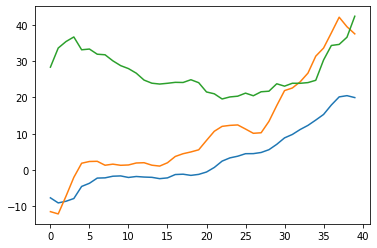

In [38]:
for sample in range(50):
    fig = plt.figure(figsize=(10,10))
    ax = fig.gca(projection="3d")
    ax.plot(samplingReconstruction[sample,:,0], samplingReconstruction[sample,:,1], samplingReconstruction[sample,:,2])
    plt.draw()
    plt.show()
    plt.plot(samplingReconstruction[sample,:,0])
    plt.plot(samplingReconstruction[sample,:,1])
    plt.plot(samplingReconstruction[sample,:,2])
    print(randomZ[sample])
    plt.show()

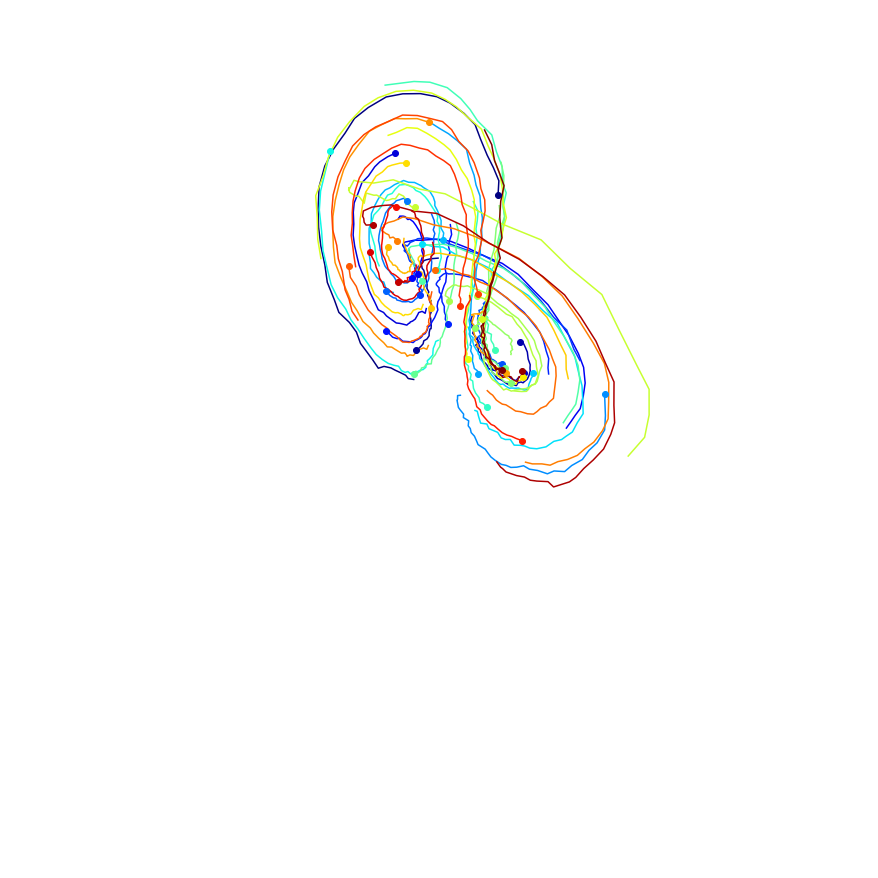

In [51]:
genvideo(vae_test, "vae_test.mp4")

In [55]:
x_t.shape, vae_test.shape, np.linspace(0, 4, 40).shape

((20, 1000, 3), (50, 40, 3), (40,))

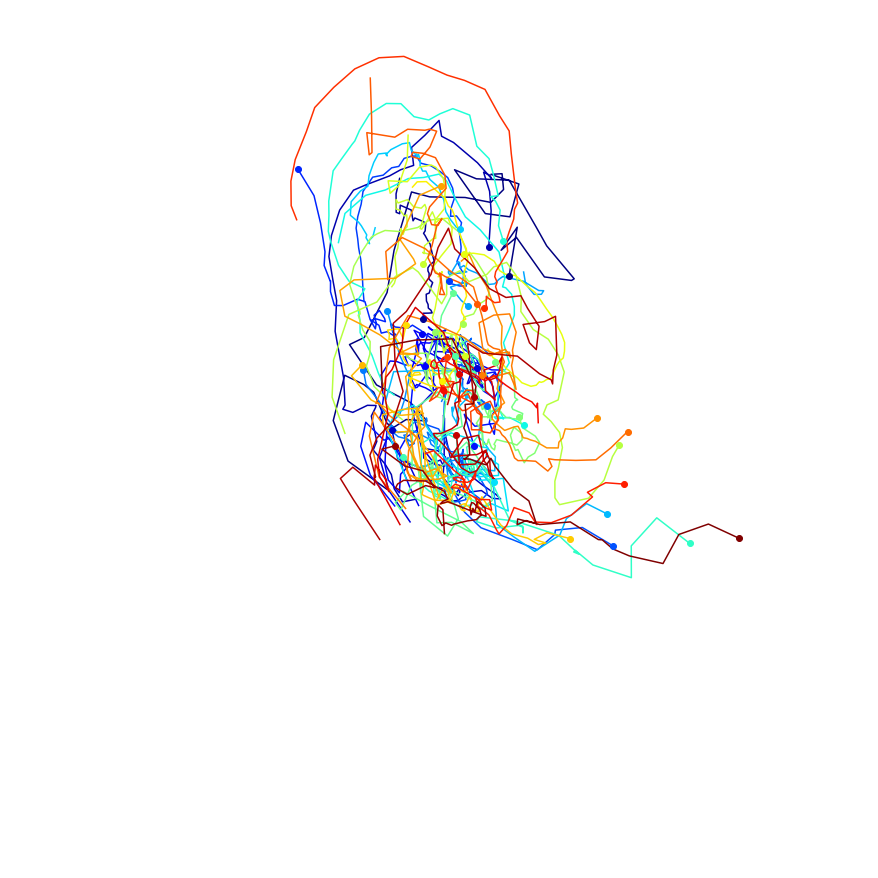

In [63]:
genvideo(samplingReconstruction, 'lorentz_traj_sampling.mp4')

Now instead of shooting blindly in a high dimension, we use the prior knowledge of the test set, we know where in the latent space we can produce perfect trajectories.
We can sample the neighbor with a normal distribution with the same mean like the one returned by the encoder of the test set
![sampling](https://miro.medium.com/max/2532/1*79AzftDm7WcQ9OfRH5Y-6g@2x.png)

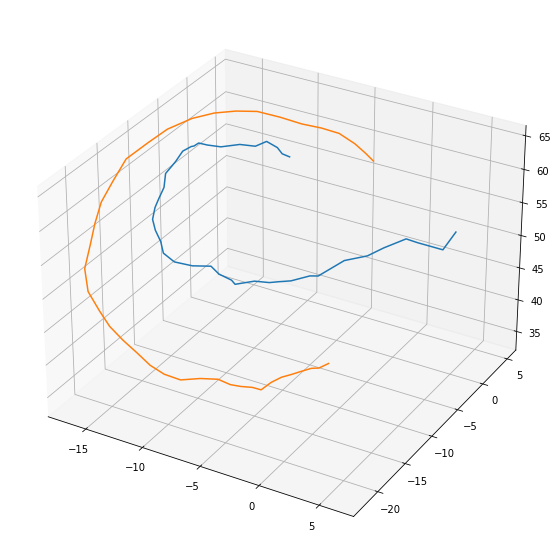

[-0.72851392 -2.29427978  0.08209029 -0.38151363  1.52284496 -0.61013737
  0.02710127 -0.80759972 -2.35042444  0.1964995  -0.0578973  -0.33467428
  0.57961644  1.02659779 -0.24034408  0.58452922]


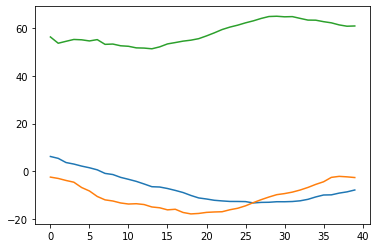

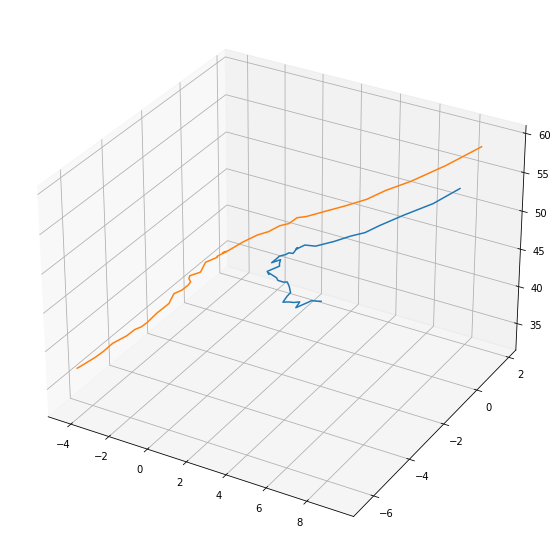

[ 0.8449413   0.16512786 -0.6034259   0.43613357  0.77203038 -0.3035919
 -0.63377893 -0.57477139 -0.25683683 -0.26704945  0.29022716 -0.59968448
  0.43248313  0.0423267  -1.04696635 -0.049457  ]


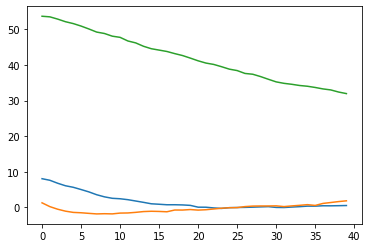

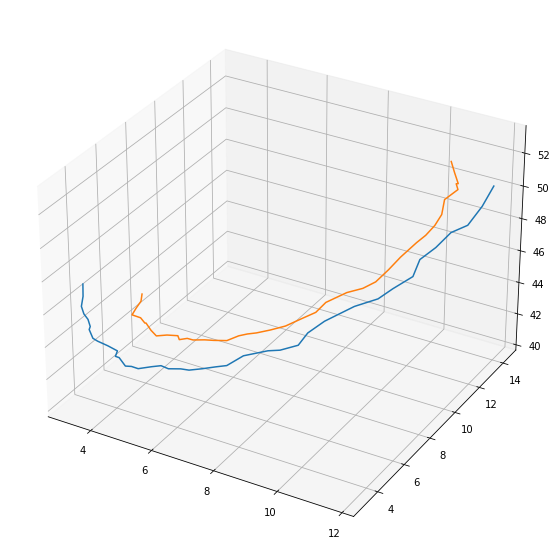

[ 0.42128467  1.28299398  0.44793594  0.08586019 -0.13795245  0.32822735
  0.12256343 -1.29774188  0.82601297 -1.20253602  0.5103701   1.07935819
  0.21615641 -0.0363107  -1.21486041 -0.07057115]


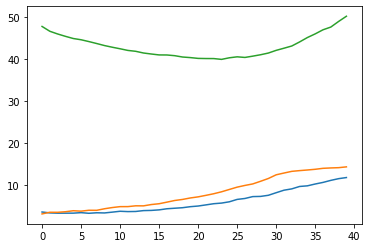

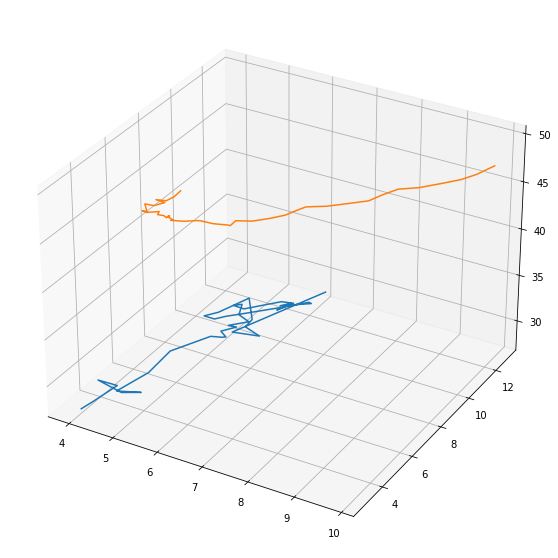

[-0.0118597   0.29012255 -0.113443   -0.47856799  0.4853479  -0.12524991
  0.25530375 -1.33575799  1.17417295  0.11891259  1.08881693 -0.9807853
 -0.33260793  0.45962946  0.01330562 -0.13570952]


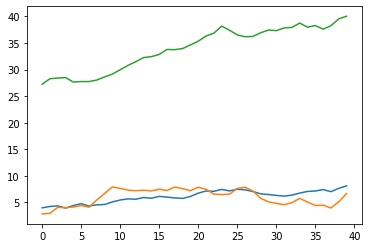

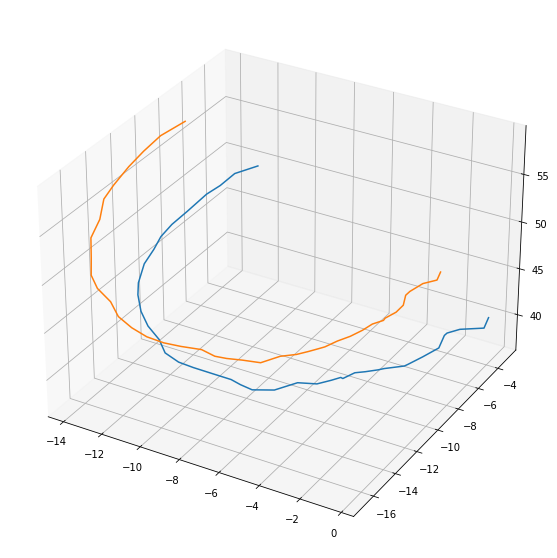

[ 0.07187051 -1.37435826  0.5702525  -0.13879633 -0.24717967 -0.1679254
 -0.64744708 -0.88195867 -1.83428954  0.6980797  -0.04430901 -0.2309014
  0.31085281  0.17120715  0.31417969 -0.04371731]


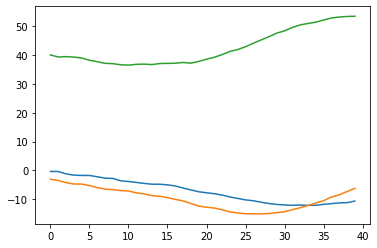

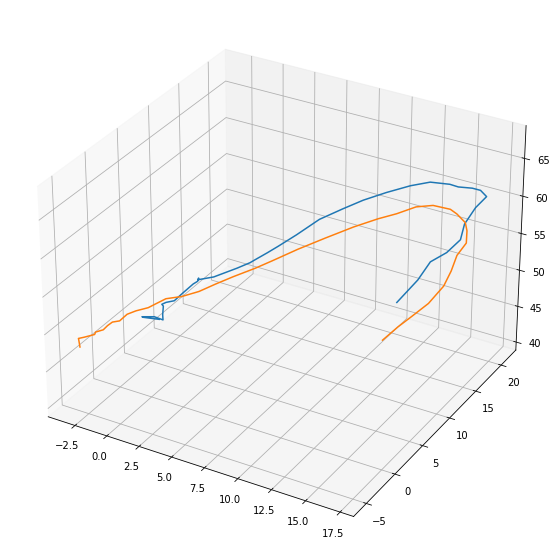

[ 0.59645107 -1.4198102   0.67451568  0.57791845  3.04069891 -0.79786158
  0.30721079 -1.59883054  0.84244309  0.542181   -0.19121096  0.35911947
 -0.27312111  1.00161639 -0.72898504 -0.88225921]


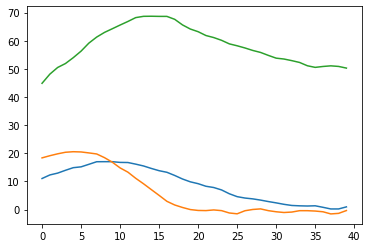

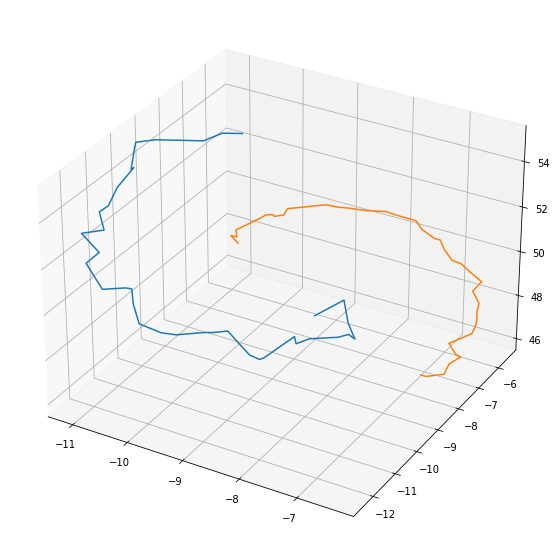

[-0.79287288 -0.1579398  -0.50324227  0.97884254 -0.06158592 -0.67688858
  0.53309038 -0.35662192 -2.5068909   0.49092009  0.34493413 -0.21872552
  0.73735066  0.08592135 -0.30267117  0.25011974]


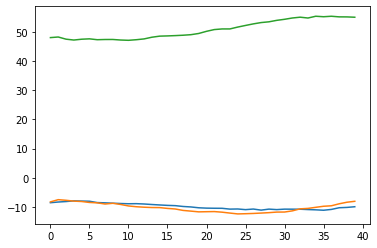

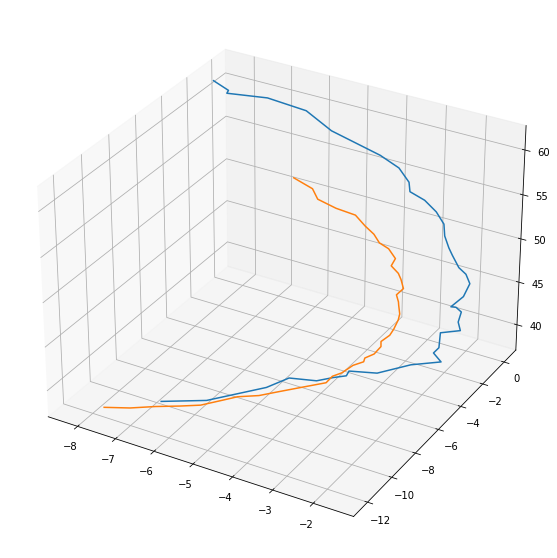

[ 0.79747314  0.49874513 -0.49249864  1.23085363 -0.76982871 -0.09736533
 -0.36205262 -0.76147642 -0.97610361  0.14139865  0.34369916  0.9138605
 -0.04133657 -0.59234225 -1.57056661 -0.33989472]


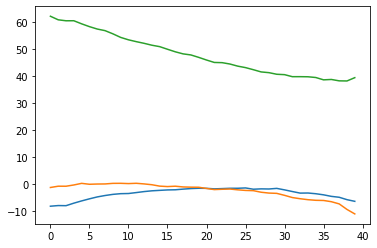

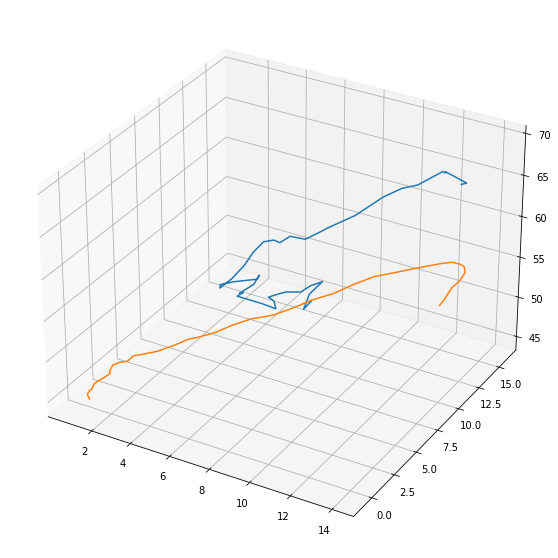

[-0.80361616 -0.23943175 -0.37796883 -0.14659173  1.98469538 -0.69647016
 -0.44421591 -1.21317133  0.64117153 -0.18390802  0.93455173 -0.70946426
 -0.14165836 -0.09691003 -2.04324431  0.9736353 ]


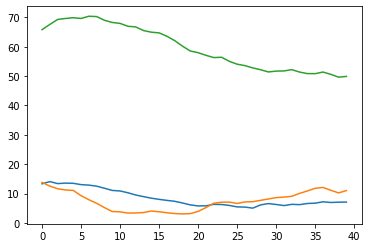

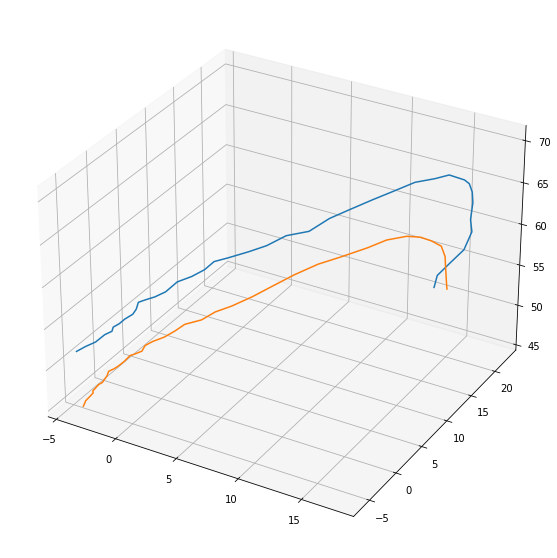

[ 0.24273116 -1.48622893  0.82562083  0.29314233  2.67167034 -0.31446353
  0.02394529 -2.0628475   0.17056675 -0.13240628  0.11899276  0.5334447
  0.19595744  0.15120669 -0.4906901  -0.35357265]


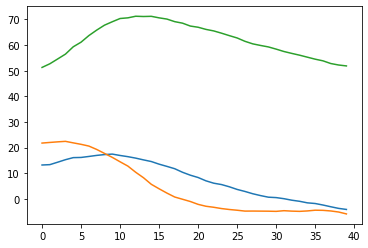

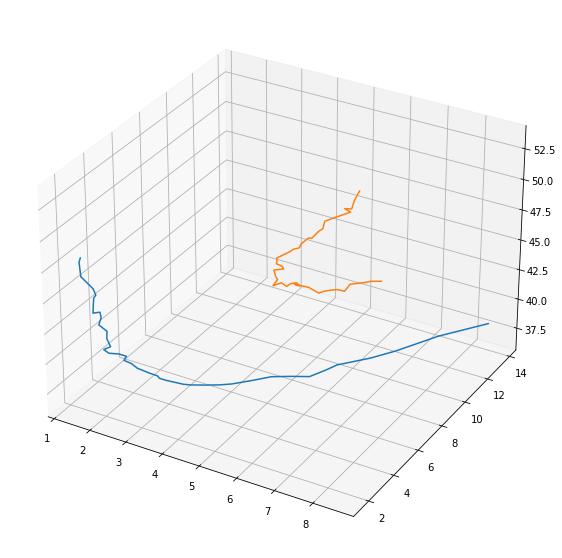

[ 0.44059791  1.34487096  0.46953143  0.44719298  0.20205302 -0.43253263
 -0.73688141 -0.72039724  0.28934167  0.7382724  -0.36620698 -0.25896276
  0.0759993   0.47369499 -1.1842983   0.10719741]


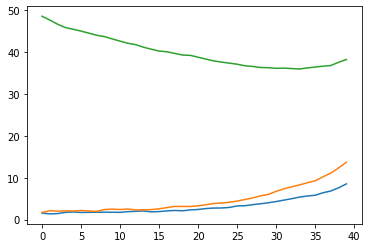

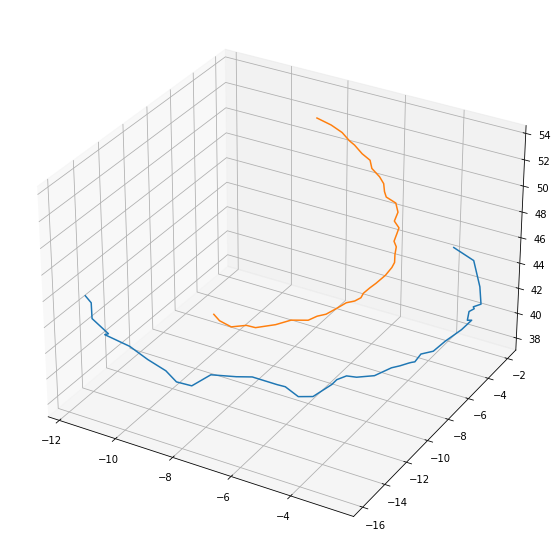

[ 0.04784708  0.41380822 -0.46395294  0.0386856  -0.54544065 -0.0376239
  0.22156879 -0.88110793 -1.52747397 -0.09382786  0.23803162  0.4105882
 -0.44015422  0.31966184  0.05470624 -0.73666008]


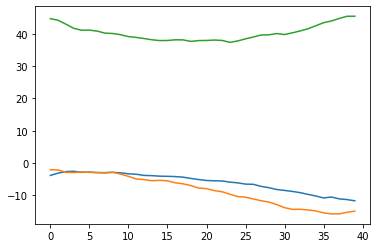

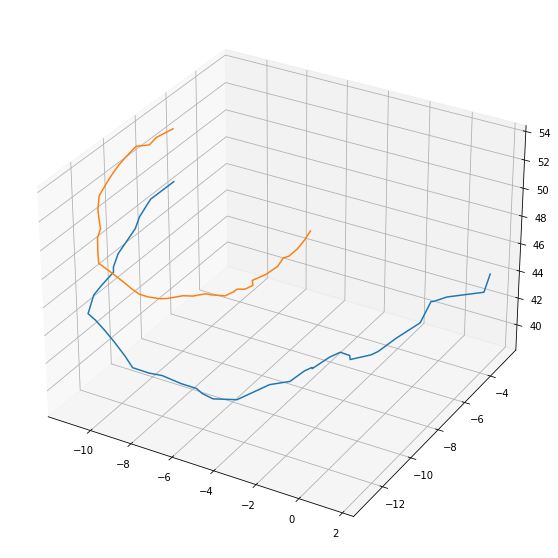

[-0.36925471 -1.27091213 -0.20887537  0.81475614 -0.10870937 -0.35504599
  0.29399793 -0.91328294 -1.56689189  0.20584384  0.71624356 -0.28634358
  1.54800539  0.45231329  0.06465446 -0.02968416]


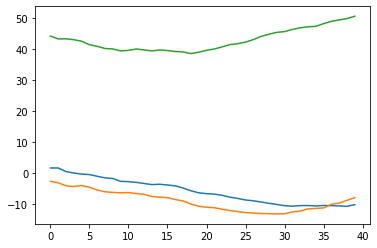

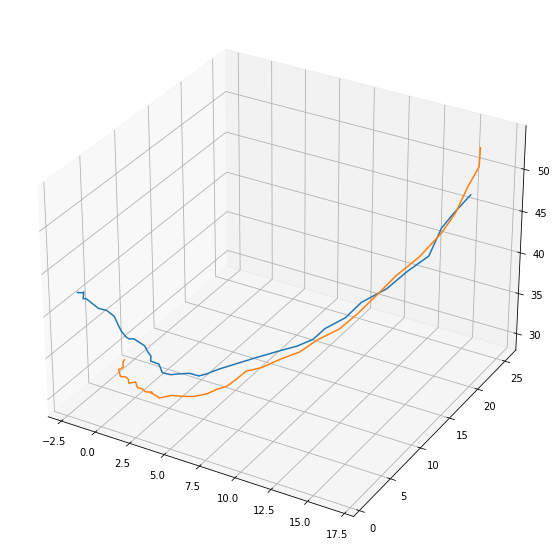

[-0.52846037  1.12272493  0.24910328 -0.32610129 -0.76059325 -0.31631379
  0.40324162 -0.53637301  0.99463395  0.51921503 -0.23758856  0.59257566
  0.08028968  0.56244516 -1.64140881 -0.11145368]


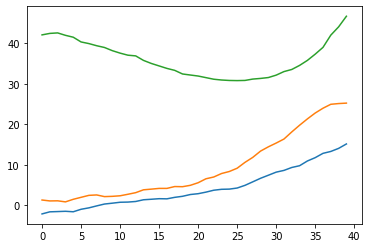

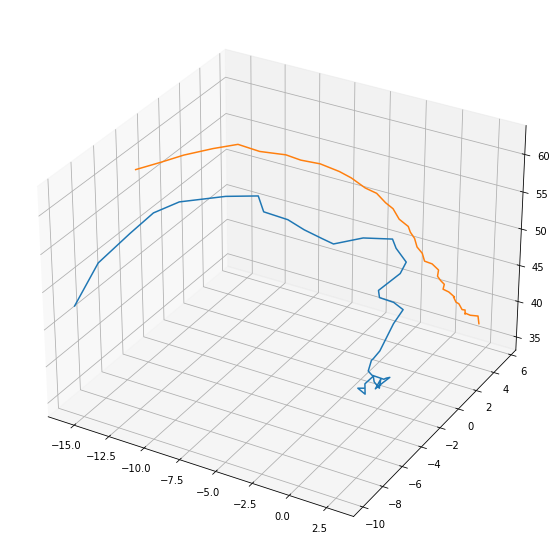

[ 0.77967403  1.59486789 -0.72586688 -0.98927949 -1.78108949 -1.08057865
 -0.25715074  0.35660493 -1.04443485  0.23467741  0.00738245 -0.03178947
 -0.01711214 -0.08073712 -1.88204069 -0.5762588 ]


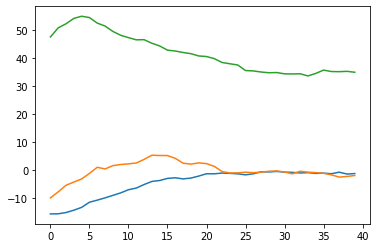

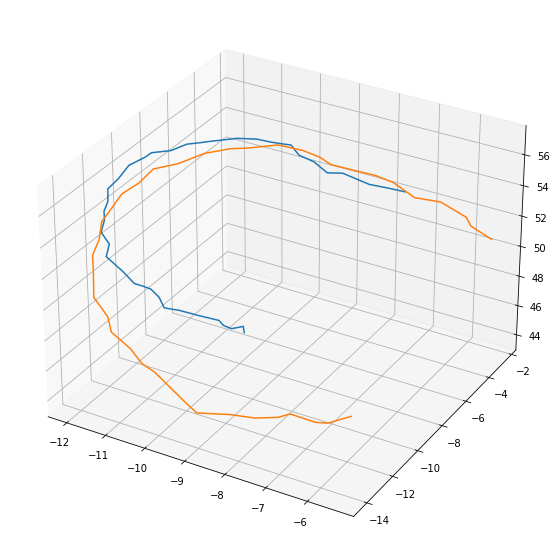

[ 0.50983122 -0.35777415 -0.22426188  0.4215619   0.65297988 -0.2545689
  0.07871966  0.06539092 -2.64404365 -0.30520421 -0.26971717  0.47356669
 -0.97073044  0.20272743 -0.6165488   0.35209497]


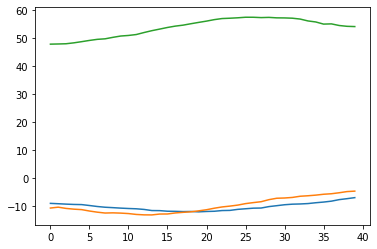

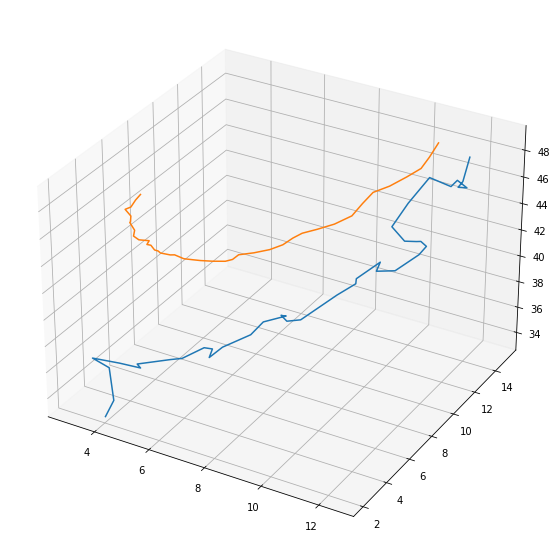

[ 2.22409435e-01 -3.99479860e-01  4.69422786e-01  1.86916501e-01
  1.32158981e-01 -2.04203393e-01  4.42635041e-01 -1.45679194e+00
  1.70237607e+00  2.85583558e-01  1.05065308e+00 -4.18351510e-01
 -8.99900548e-01  3.65600454e-01 -8.35178011e-01  1.47145945e-03]


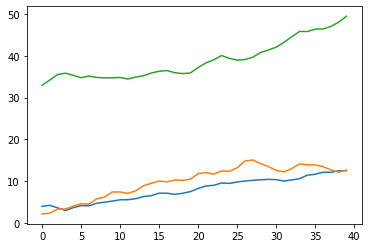

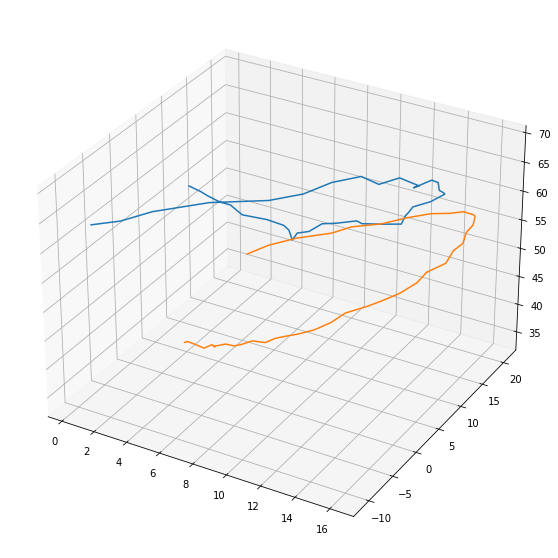

[-0.73503535 -0.2636025   0.4340495  -0.08645436 -1.27012087 -0.08932176
 -0.4697214  -3.21715251  0.61785124  0.91740235 -0.24484251  0.29176778
 -0.48792443  0.43752736 -1.16884307  0.45460909]


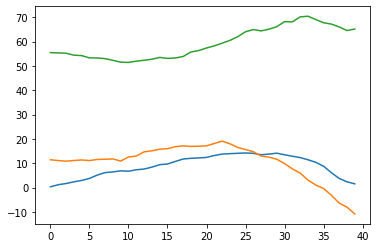

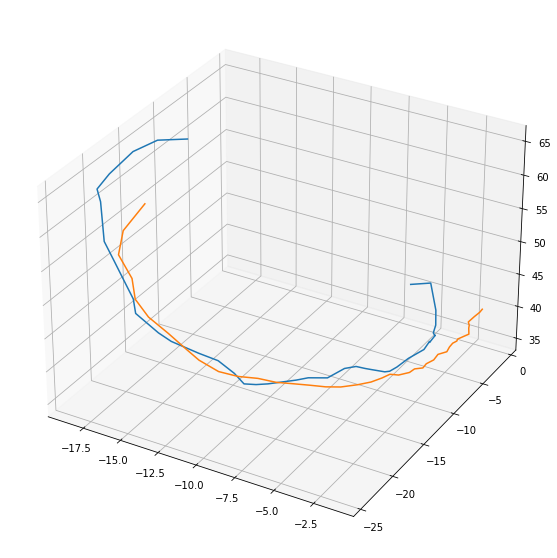

[ 0.00890817  0.08444199 -0.6562533   0.05075192 -1.35081865  0.61964272
 -0.20619665 -1.36112928 -2.68118891 -0.3795699   0.2097968   0.66141084
 -0.13408453  1.08242537  1.15571712 -0.04725453]


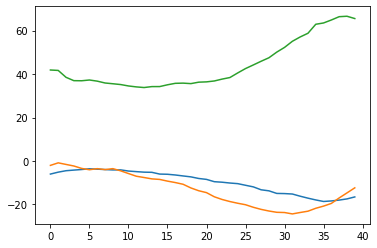

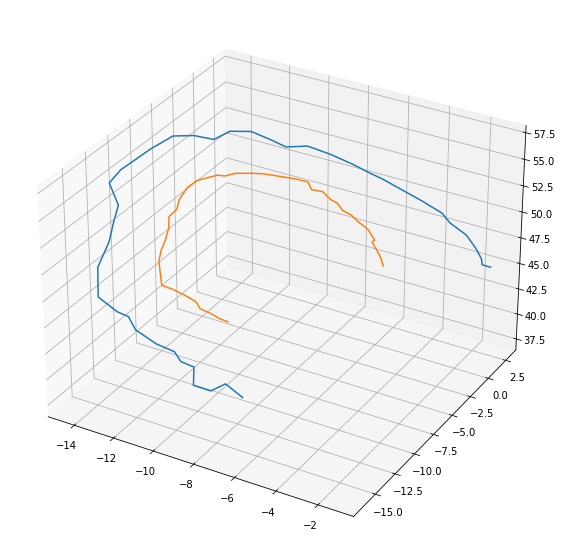

[-1.20553399 -1.01743777 -0.42859157  0.57344819  1.10804943 -1.03427349
 -0.11999231  1.20752079 -2.43514881 -0.34159303  1.04415942  0.00956142
 -0.23466087  0.19211534 -0.97401475 -0.22401944]


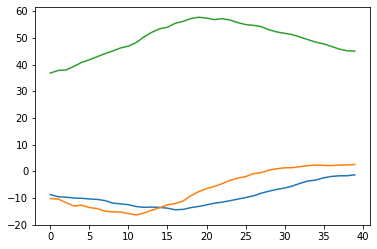

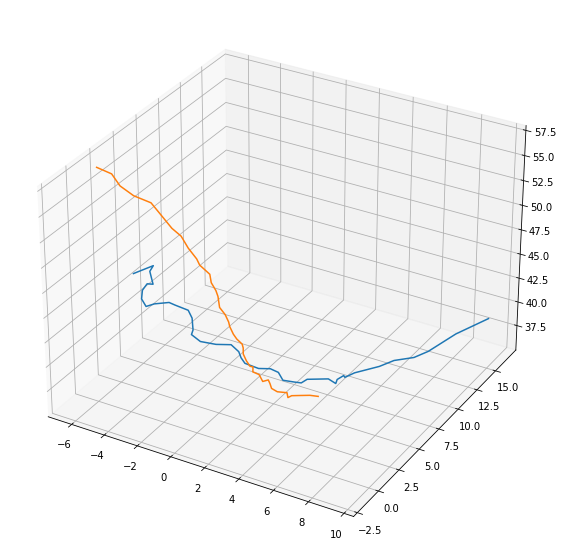

[ 0.61247792  1.84554154  0.63347611 -0.04673681  0.3570287  -0.02053548
  0.21744516 -0.11532796  0.08165546  0.93253892  0.24567239 -0.86567805
 -0.56017704  0.68447273 -1.75623862  0.18952294]


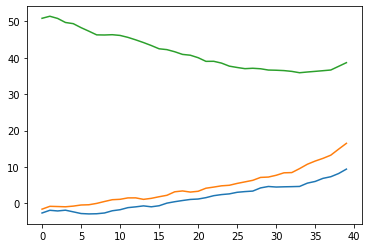

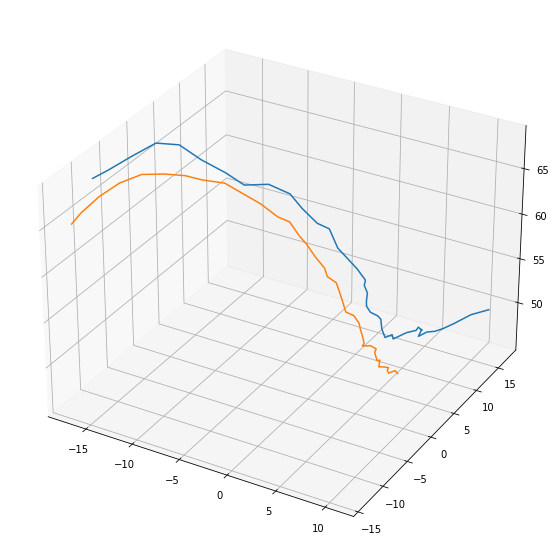

[-0.34678705  3.09980762  0.18381254  0.69628796 -0.8685458   0.51895018
  0.2619446  -0.37359187 -0.35288927 -0.35661079 -0.31933205  0.30126265
 -0.21574407 -0.29811471 -2.84486224 -0.47743182]


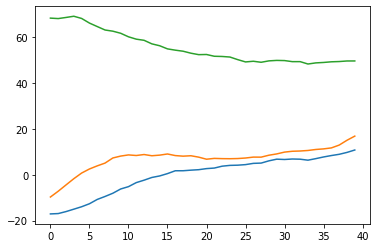

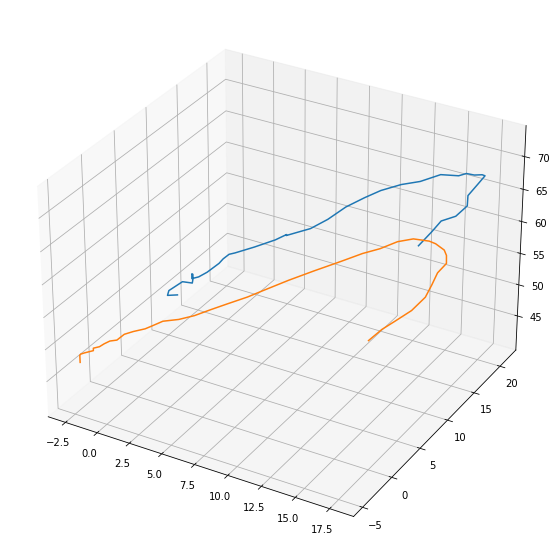

[ 0.54069978 -1.19117789 -0.29311024 -0.03329315  2.81758083  0.89697421
  0.43962209 -2.06959531  0.84884554 -0.03765567 -0.08868091  0.88129617
 -0.1990607  -0.21571565 -1.09371117 -0.70245255]


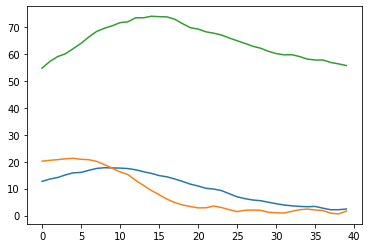

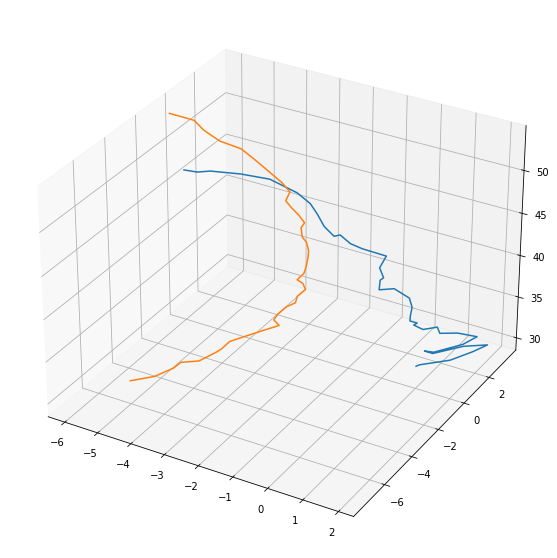

[ 0.22824866  0.35851592  0.40341901 -0.54687725 -0.74060201  0.34661388
  0.72446114 -0.29418623 -0.23217235  0.88422533  0.5270638  -0.45484267
 -0.0443891   0.33341461 -1.36428309  0.21641318]


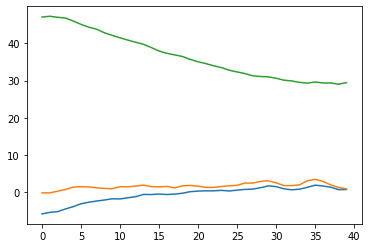

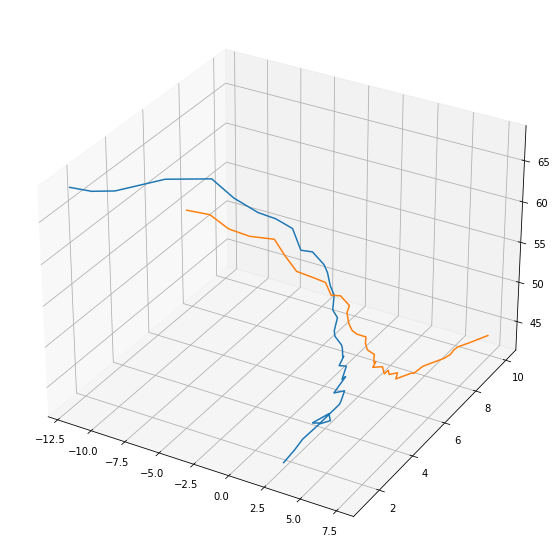

[-0.72211704  1.17449121  0.52434438 -1.13878335 -1.00261116 -0.03693429
 -0.9121566  -1.06715336 -0.37476101 -0.07120861 -0.06686307  0.06089669
 -0.20652283  0.05633452 -2.13659148  0.29342763]


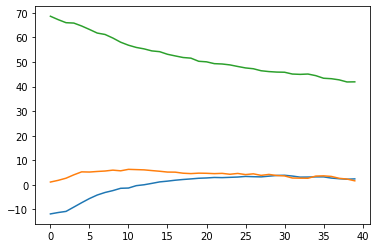

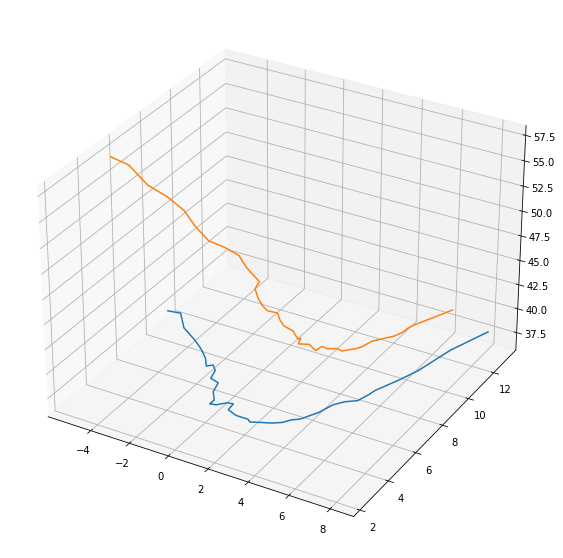

[ 0.87790973  1.50742801  0.31770552 -0.58663428  0.09188101 -0.38678686
 -0.4335531  -0.73714107  0.21642444  0.60397359  0.75676289 -0.30081221
  0.10543875  0.89005345 -1.1874562   0.36066797]


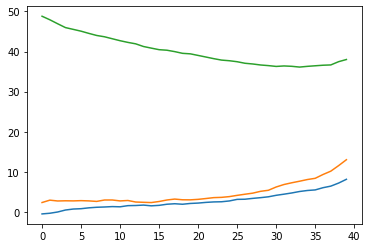

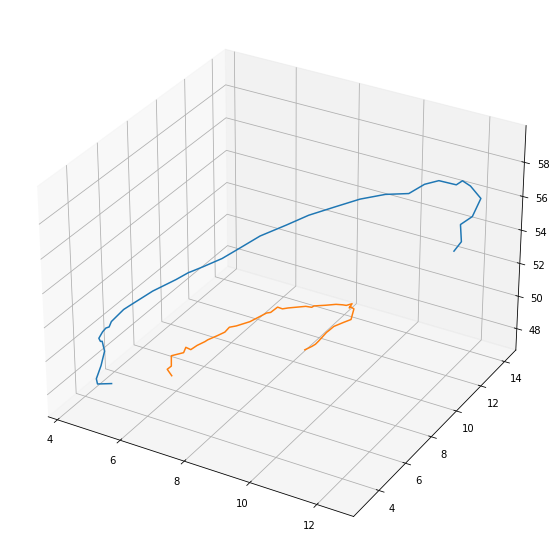

[ 0.68531919 -0.330207    0.32474074  0.71011443  1.73176085 -0.40349236
 -0.14027707 -1.63558128  0.57374964 -0.15752276  0.36506215 -0.2109214
 -0.86256047  0.20063446 -1.02998934 -0.36268304]


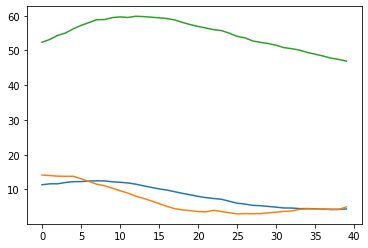

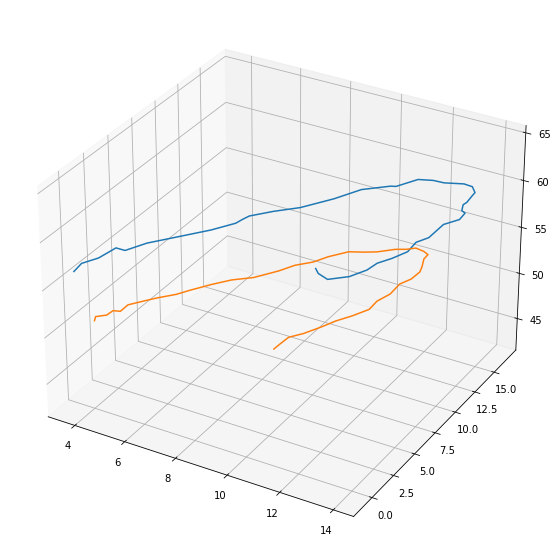

[-0.74752972 -0.21551304 -1.19817213 -0.84035544  0.96987566  0.61596578
  0.64740753 -2.83002904  0.77642567 -0.7209295   0.52036316 -0.75794818
 -0.04428613  0.54462002 -0.44175467  0.73654305]


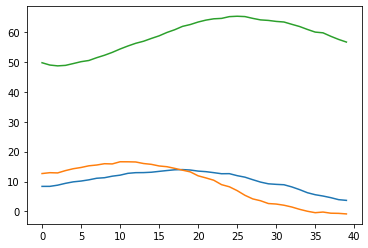

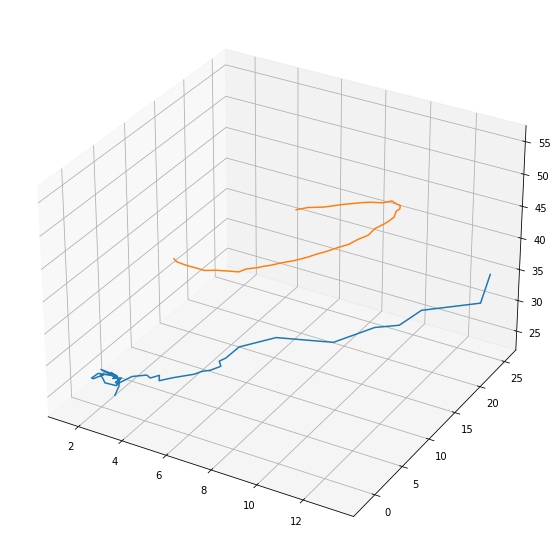

[-0.40527591  0.6200285   0.56441632 -0.06613533  0.26183289  0.27269073
 -0.82982667 -0.27881918  1.40970047  0.09040098 -0.68991577  0.04675645
 -0.20217503  0.34796356 -0.61096904  0.92523525]


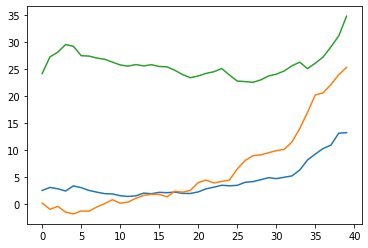

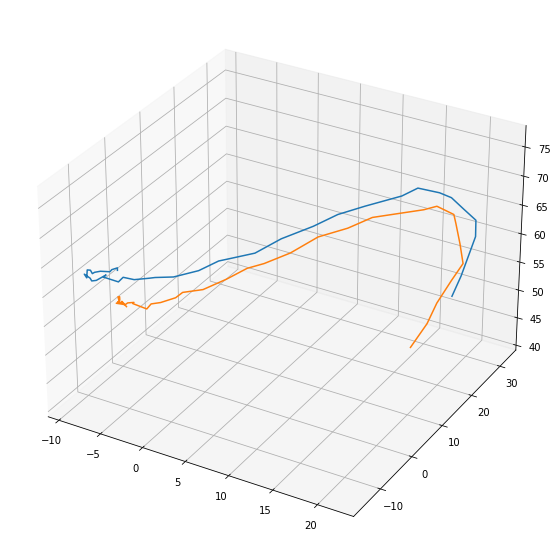

[ 1.04185224e-01 -1.99530171e+00 -2.54326193e-01 -5.47848940e-02
  4.03048895e+00  5.60148782e-01  3.84901546e-01 -1.53751700e+00
 -9.15738821e-01 -2.48100010e-03  6.13813682e-01 -1.03510483e-01
  8.96363369e-01 -3.66653755e-01  4.33416931e-02 -1.25232844e+00]


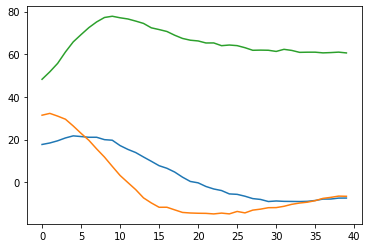

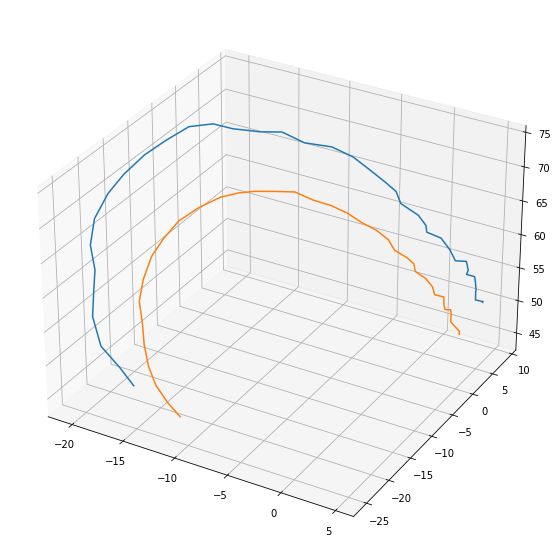

[-0.3537698   1.52954271  0.40999533  0.88054978  1.54634273  0.76206207
  0.33315242  2.09198176 -2.16943254  0.70430618 -0.52320366  0.15252082
 -0.50049709 -0.27680211 -3.08610403 -0.27306138]


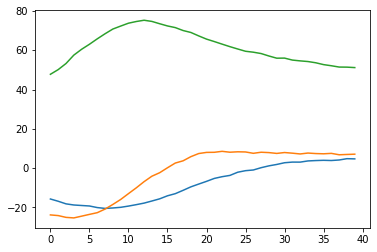

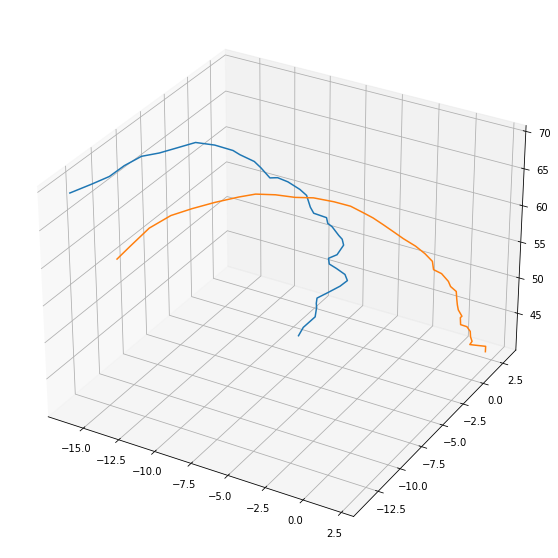

[ 0.2203911   1.87512812 -0.39998417  0.72050308 -0.06265293  0.48497687
  0.34372496 -0.19467891 -2.18603328 -0.38799984  0.67468486 -0.57274068
  0.46849689 -0.30353575 -2.0140777  -0.90198595]


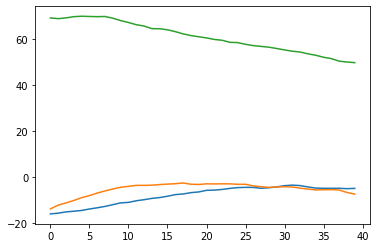

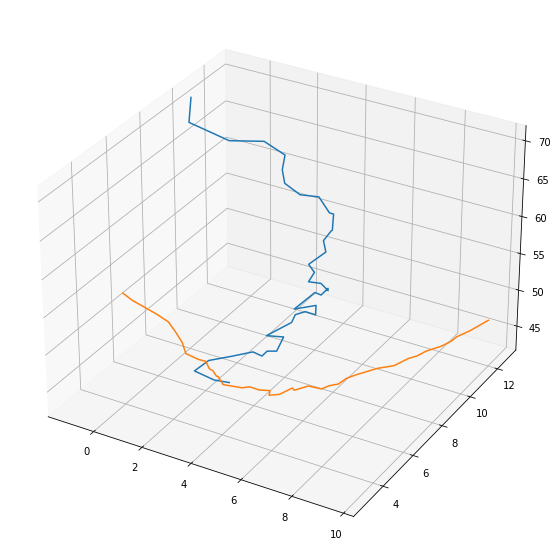

[ 0.58273104  1.21143072  0.65918734  0.10433888  0.19058674 -0.04061329
  0.36474697 -1.93944392 -0.0611751   0.39032248 -0.01161519 -0.13802811
 -0.0793393   0.2608684  -1.75151731  0.24903179]


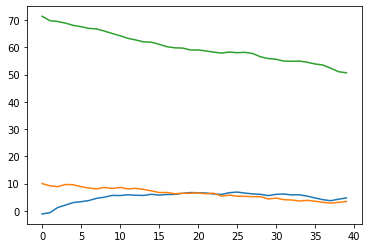

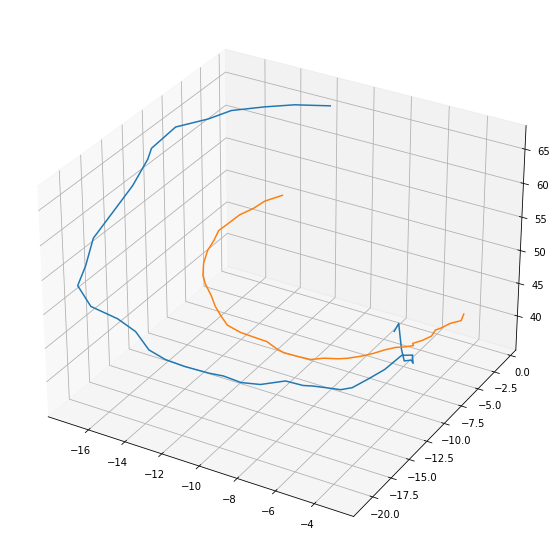

[-0.41072618 -1.47425471  0.38262708  0.54155579 -0.89972549  0.41284324
 -0.53041915 -0.5274525  -3.12093818 -0.50816081 -0.24219444 -0.0143098
  0.73972824  0.50052929  0.90798297  0.59622856]


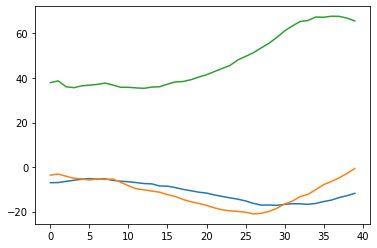

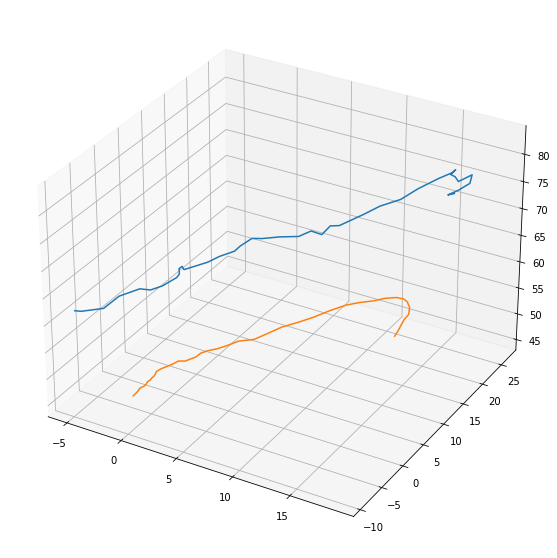

[-0.10039904 -1.04292648  0.35072684  0.02766836  2.29535351 -0.66868247
 -0.07064603 -2.81906478 -0.14643424 -0.44783257  0.38303216 -0.30371152
 -0.12772894  0.69246576 -1.10980118  0.1658022 ]


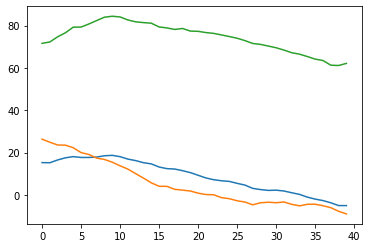

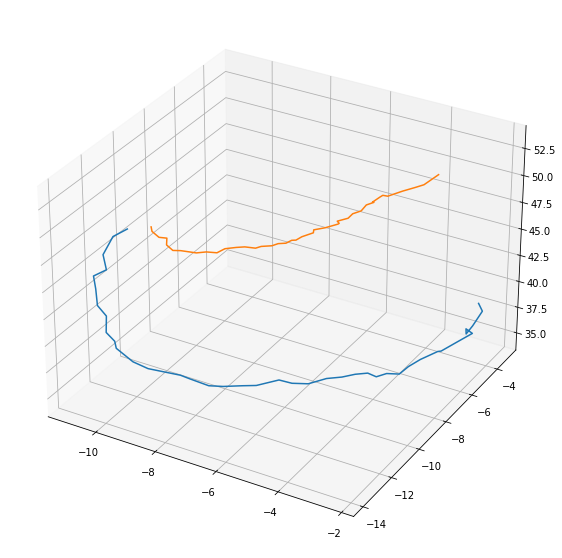

[-0.8920325  -0.26613823  0.19985387  0.42616126 -0.52432963  0.14506252
  0.1308737  -0.70149276 -1.61340548  0.29301305  0.23482105 -0.47578587
 -0.55100622  1.28617125  0.32040459 -0.6936624 ]


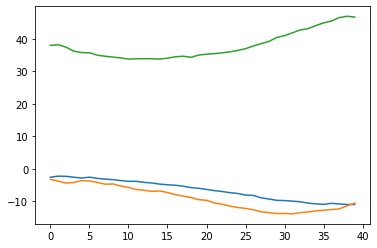

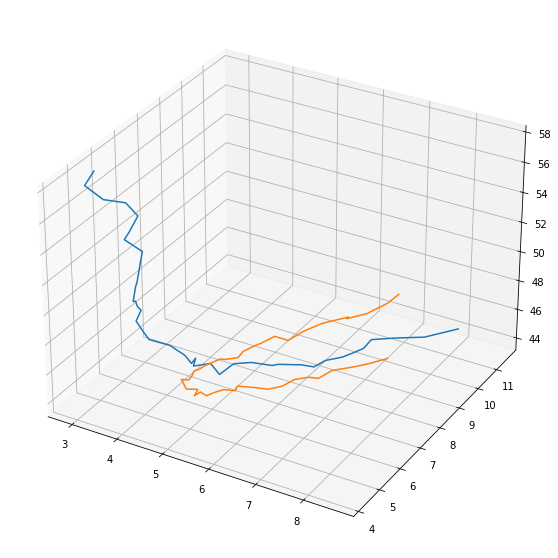

[ 0.22780425  0.84011136  0.45228784  0.08305793  0.36893157 -0.07899182
 -0.25046079 -1.15580467  0.31470512 -0.04004971  0.52127421  0.57135298
 -0.57991862 -0.21943524 -1.58174901  0.60800047]


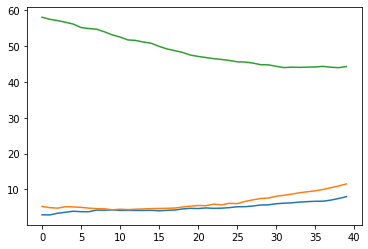

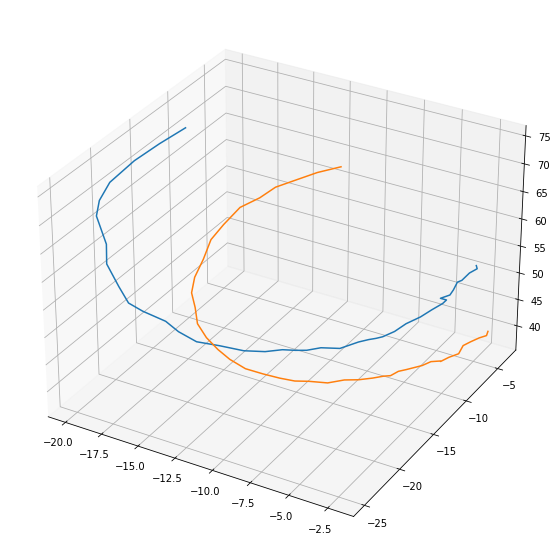

[ 0.00307923 -1.14129936 -0.4097946   0.02862915 -1.23067282  0.65488319
 -0.17544512 -1.78984614 -2.67773422 -1.11496479 -0.02579038  0.15656095
  0.15165233  0.80685476  0.47488362  0.38798223]


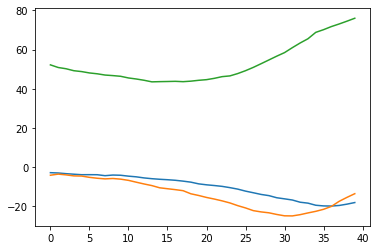

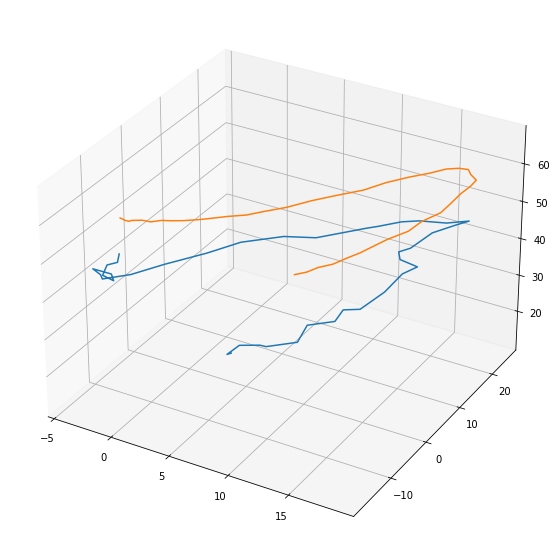

[ 0.17317068 -2.43261    -1.35338539  0.50160939  1.62154067  0.02812475
 -0.61405503 -2.65356907  0.96290065  0.02570348 -0.08412476  0.52954857
  0.47961027  0.40565318  2.39857863 -0.30904657]


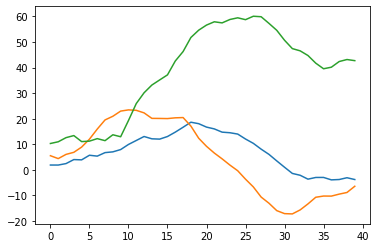

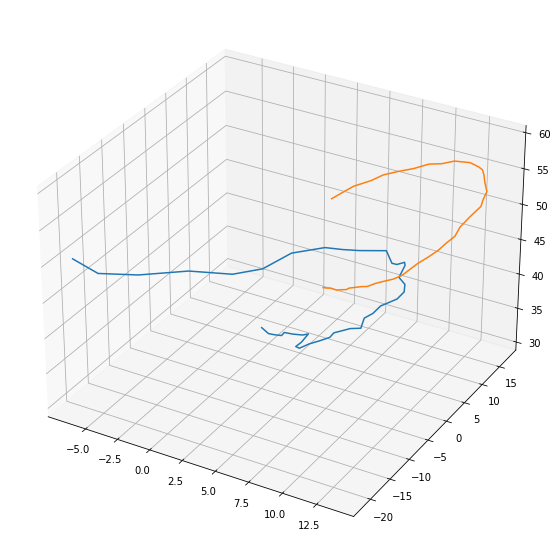

[-0.14053754 -0.81291392  0.26107435 -0.34234837 -1.67846819 -0.61473336
  0.02305799 -2.24815428  0.36330209 -0.26349488 -0.05814759 -0.34077218
  0.3032689   0.03869768 -0.13231162 -0.36112833]


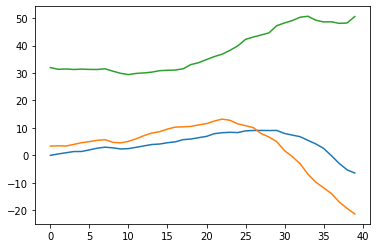

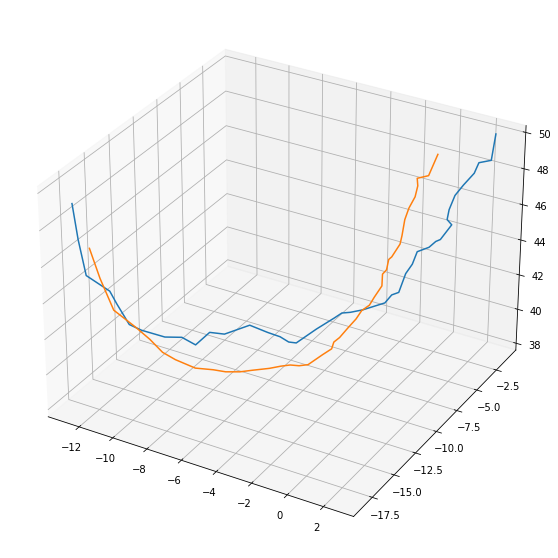

[ 0.78489083 -0.35753484  0.6743889  -0.20715723 -0.33136923 -0.3332766
 -0.47556597 -1.38299005 -1.23518024 -0.07579257  0.76673908 -0.5236233
 -0.53687363  0.88673132 -0.04728729 -0.95300351]


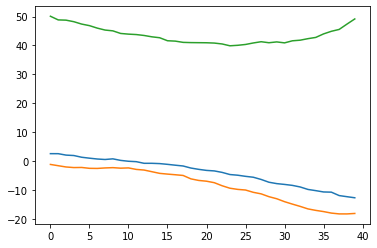

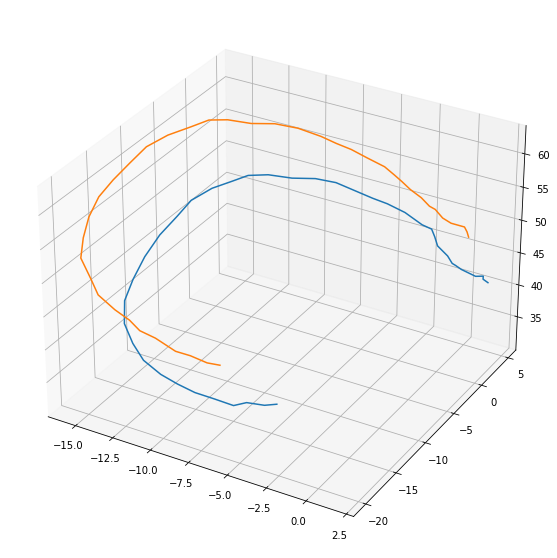

[ 0.17740116  0.09601728 -1.15503918 -0.14199894  2.08221205  0.41658509
  0.5067334   1.35868085 -1.9127685  -0.08112055 -0.44597472 -0.52440329
  0.21725122 -0.97913814 -0.88588655 -0.57953013]


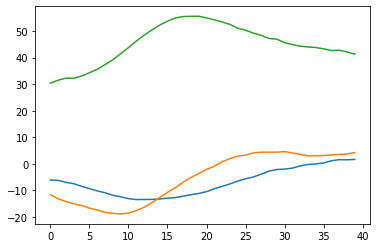

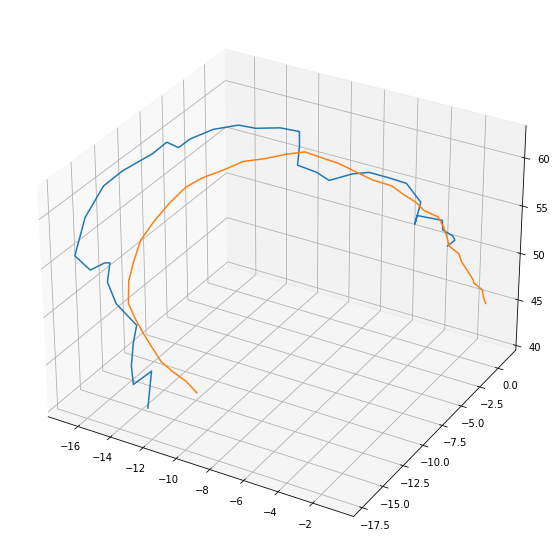

[-0.21021865  0.7983431   0.63302808 -0.94714243  0.93294913  0.05125563
 -0.29546619  1.4163427  -3.22063855  0.20020828  0.2233915  -0.02697923
  0.53636416 -0.6129961  -0.9651734  -0.36546305]


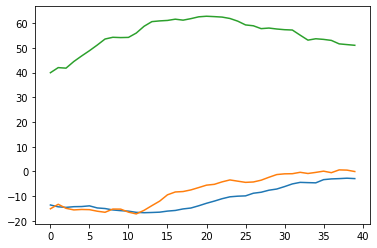

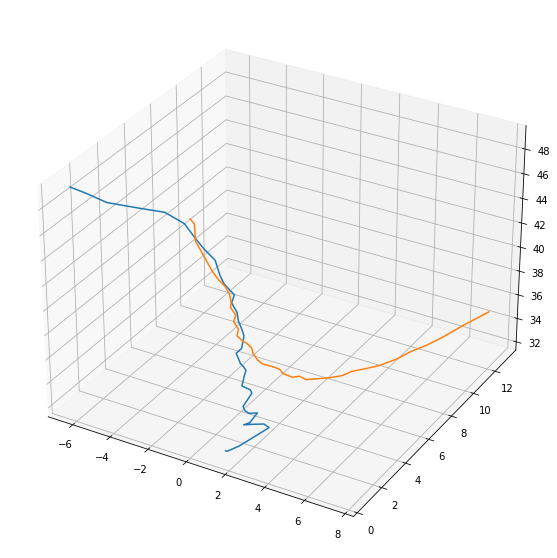

[ 0.2771981   0.94319712  0.60061501  0.43339482 -0.71302861 -0.02176138
 -0.00359139 -0.65546956 -0.19695647  0.90171729  0.05431772  0.76176159
 -0.35080594 -0.52709388 -1.22241683 -0.31388309]


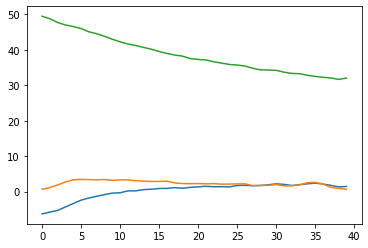

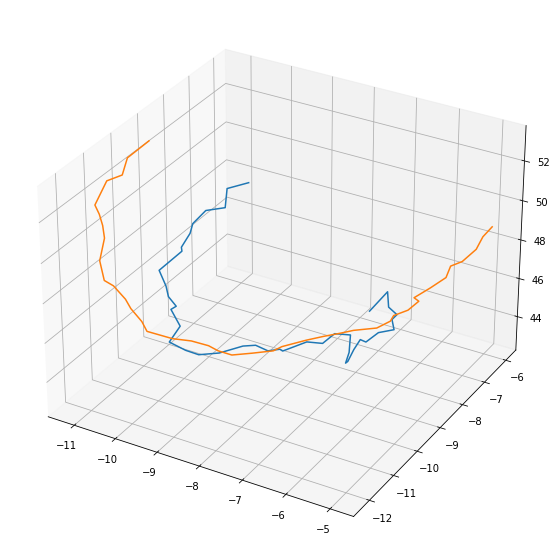

[ 1.24417115 -0.53650778  0.53701368 -0.11115247 -0.44109335 -0.02562137
  0.15795432 -0.24618041 -2.07787121 -0.28462589 -0.50953767  0.00617379
  0.32306124  0.2683621  -0.35625684 -0.30292217]


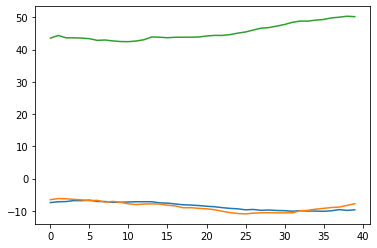

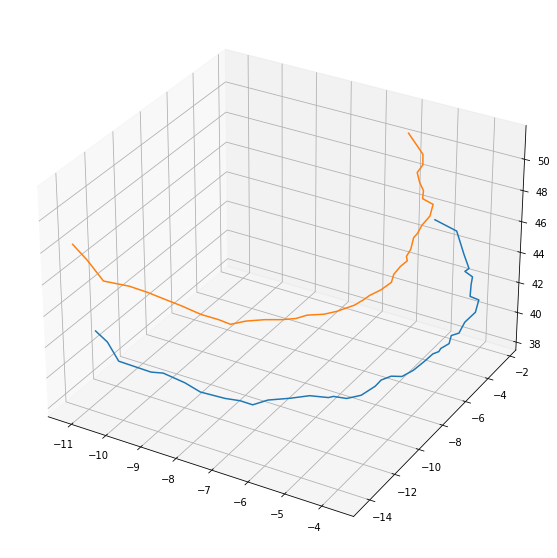

[ 0.11786045  0.18837593  0.03044324  0.05542855 -0.64824127  0.44779122
 -0.24069215 -0.66824611 -1.37760841  0.41753768  0.77238914  0.37480308
  0.33647215 -0.70100771 -0.34427697  1.14447765]


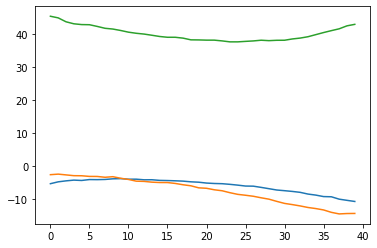

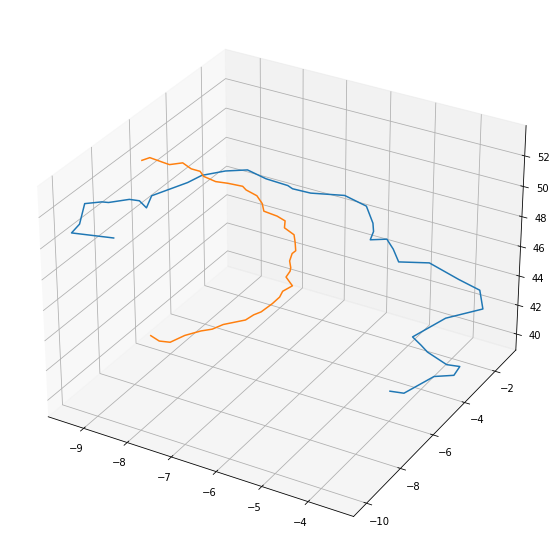

[-0.37496399 -0.17218774 -0.02718429  0.50831438  0.05006717 -0.24827268
 -0.04508847  0.22940734 -1.39057807  1.27123992  0.53732472  0.1853311
  0.34676178 -0.15030658 -1.55941012  0.08600983]


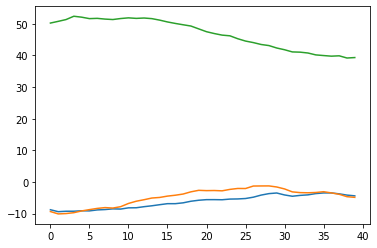

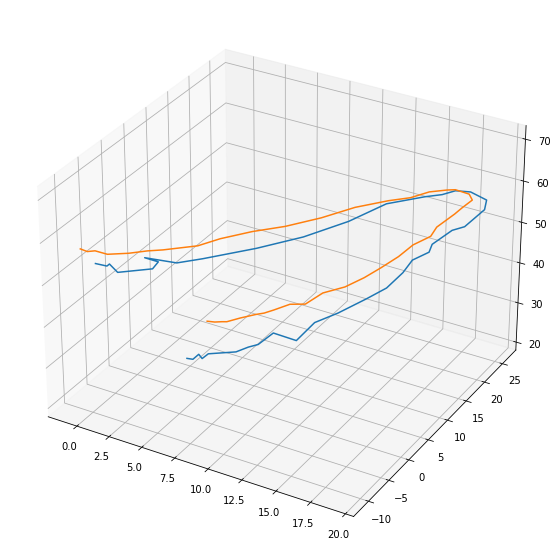

[ 0.29951443 -2.75253    -0.44767601 -0.17277828  0.20988226 -0.1324511
  0.22794484 -3.55272739  1.72120594 -0.82339246  0.8181802   0.77318748
  0.04996176  0.38327238  1.22680931 -0.37270016]


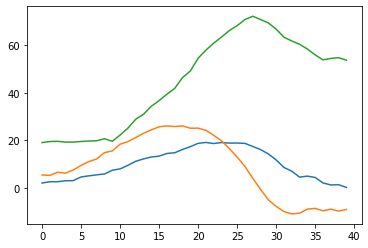

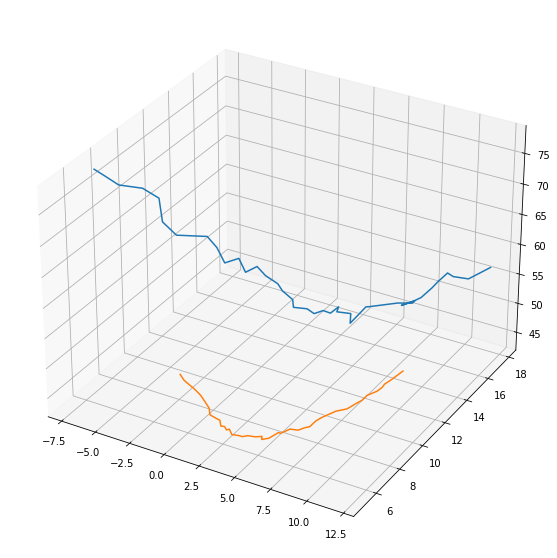

[ 0.08284081  1.56157483  0.36291379  0.53502074 -0.1262055   0.05039557
 -0.39079348 -1.43449776  0.30692104  0.88043119  0.12826123 -0.52323765
  0.21041755 -0.08536339 -2.94263663  0.23411975]


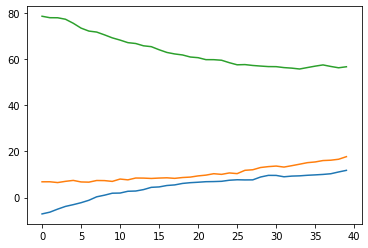

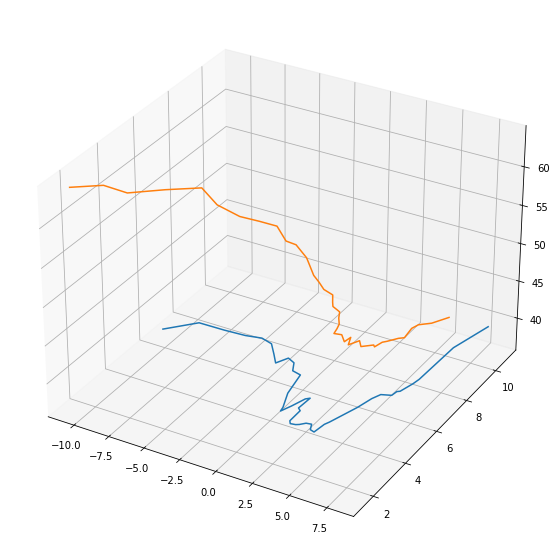

[-0.70033437  2.09384902 -0.19140104 -0.75444931 -0.32927207 -0.78100531
 -0.28380501 -0.82420141  0.13486139  0.45484629  0.05385694 -0.45237596
  1.04696497 -0.29291295 -1.10084456 -0.20786715]


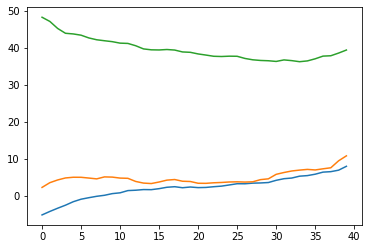

In [49]:
std = 0.5*np.ones((50,16))
randomZ = np.random.normal(encoded_test[0,:,:],std,(50,16))
samplingReconstruction = vae.decoder.predict(randomZ)

for sample in range(50):
    
    fig = plt.figure(figsize=(10,10))
    ax = fig.gca(projection="3d")
    ax.plot(samplingReconstruction[sample,:,0], samplingReconstruction[sample,:,1], samplingReconstruction[sample,:,2])
    ax.plot(vae_test[sample,:,0],vae_test[sample,:,1],vae_test[sample,:,2])
    plt.draw()
    plt.show()
    plt.plot(samplingReconstruction[sample,:,0])
    plt.plot(samplingReconstruction[sample,:,1])
    plt.plot(samplingReconstruction[sample,:,2])
    print(randomZ[sample])
    plt.show()

In [40]:
pd.DataFrame(randomZ).describe().T

,count,mean,std,min,25%,50%,75%,max
0,50.0,0.032881,0.557043,-1.205534,-0.373537,0.093513,0.435770,1.244171
1,50.0,0.030775,1.282618,-2.752530,-0.966307,-0.036749,1.077843,3.099808
2,50.0,0.044003,0.539598,-1.353385,-0.394480,0.224479,0.465139,0.825621
3,50.0,0.077015,0.531112,-1.138783,-0.166232,0.044719,0.488005,1.230854
4,50.0,0.310014,1.291119,-1.781089,-0.622541,0.070974,0.960644,4.030489
5,50.0,-0.075488,0.471561,-1.080579,-0.349604,-0.084157,0.314343,0.896974
6,50.0,-0.041919,0.406958,-0.912157,-0.345406,0.009733,0.285985,0.724461
7,50.0,-0.939677,1.137247,-3.552727,-1.517336,-0.852655,-0.360864,2.091982
8,50.0,-0.602336,1.381046,-3.220639,-1.779069,-0.244505,0.521138,1.721206
9,50.0,0.097190,0.537330,-1.202536,-0.266161,0.058052,0.481902,1.271240


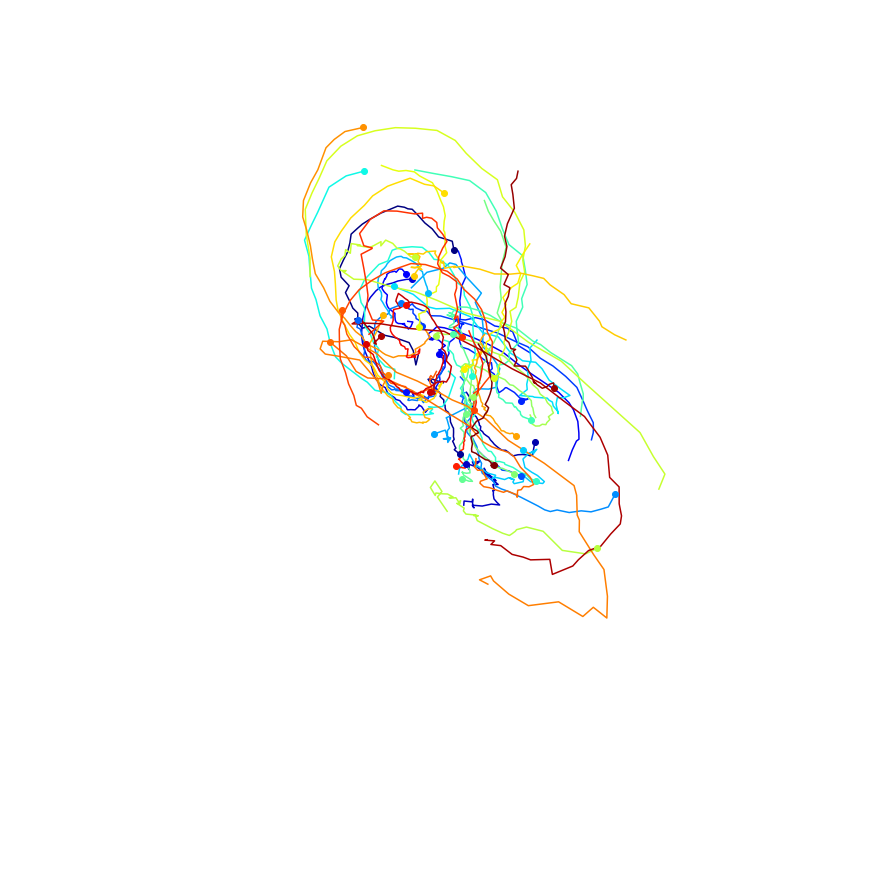

In [42]:
genvideo(samplingReconstruction, 'lorenz_traj_sampling_from_test_init.mp4')

In [48]:
np.mean(np.sum(tf.keras.metrics.mean_squared_error(samplingReconstruction,vae_test)))

67828.14

Better but there is too much noise, we can visualize groups of 10 trajectories

In [52]:
samplingReconstruction[0:10].shape

(10, 40, 3)

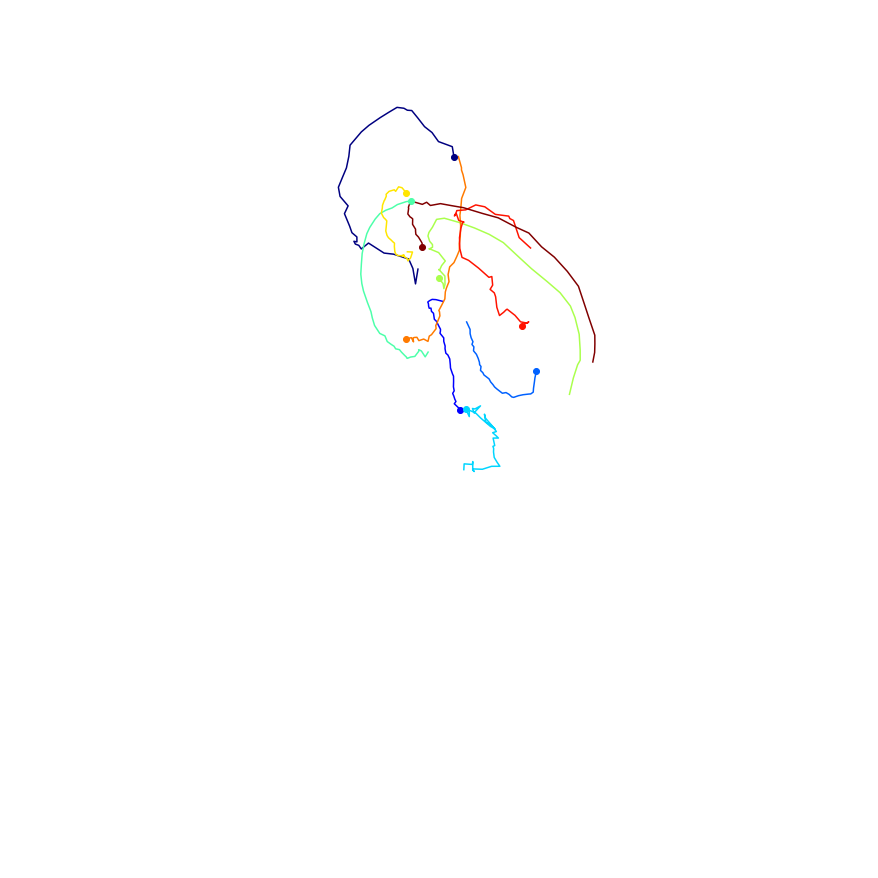

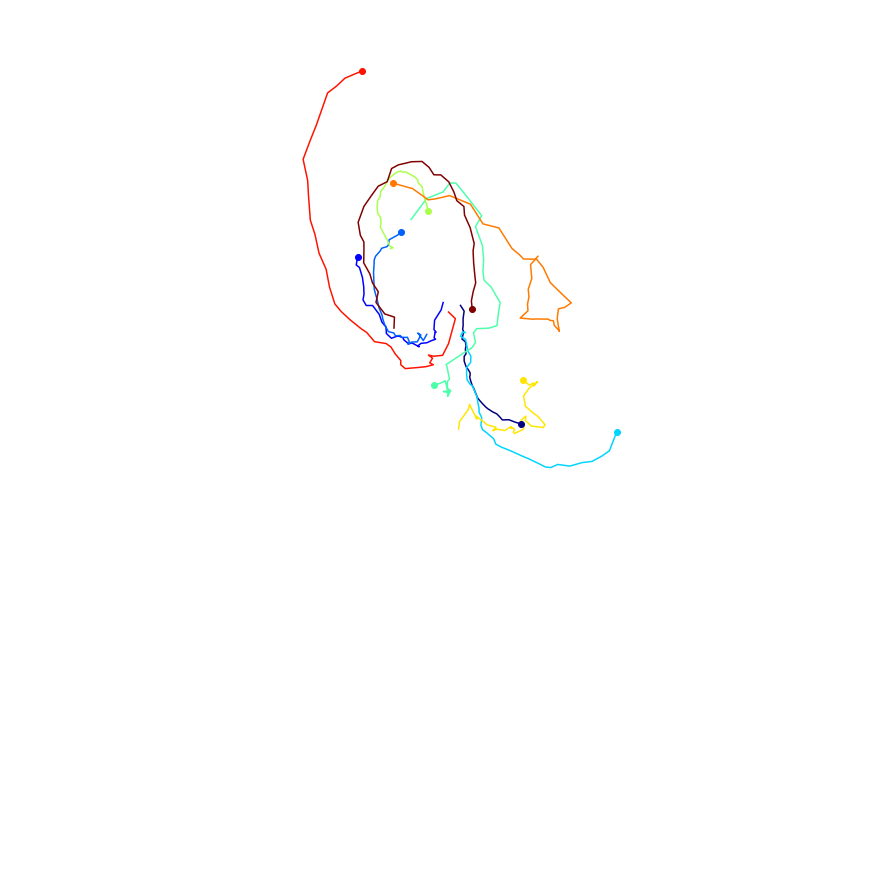

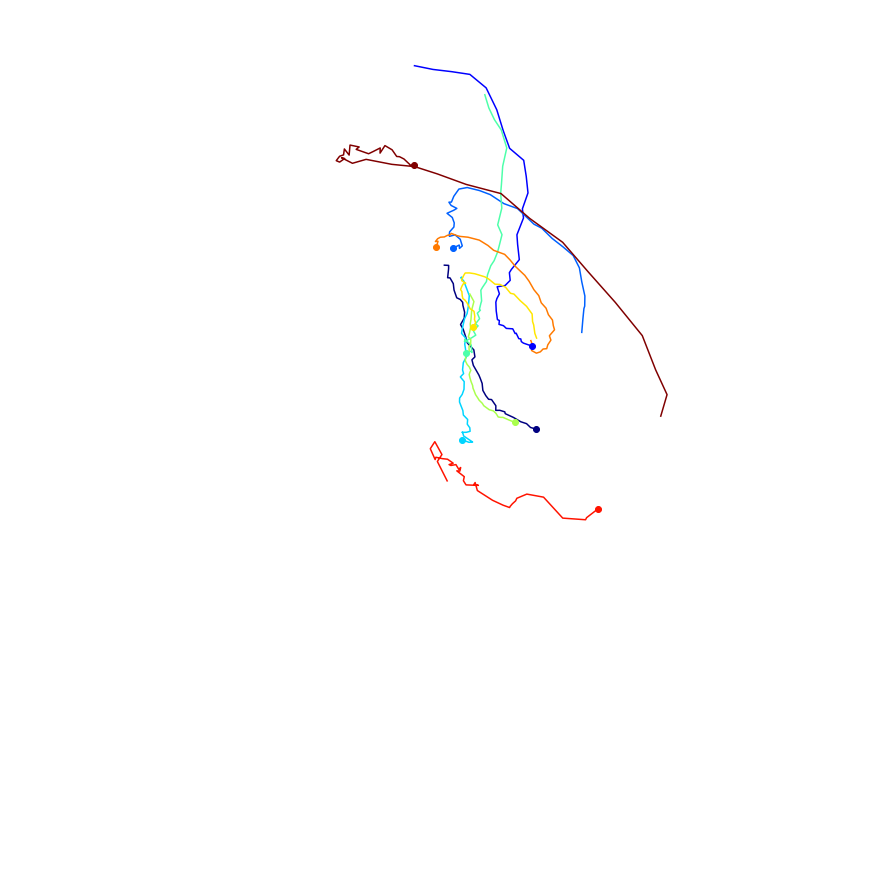

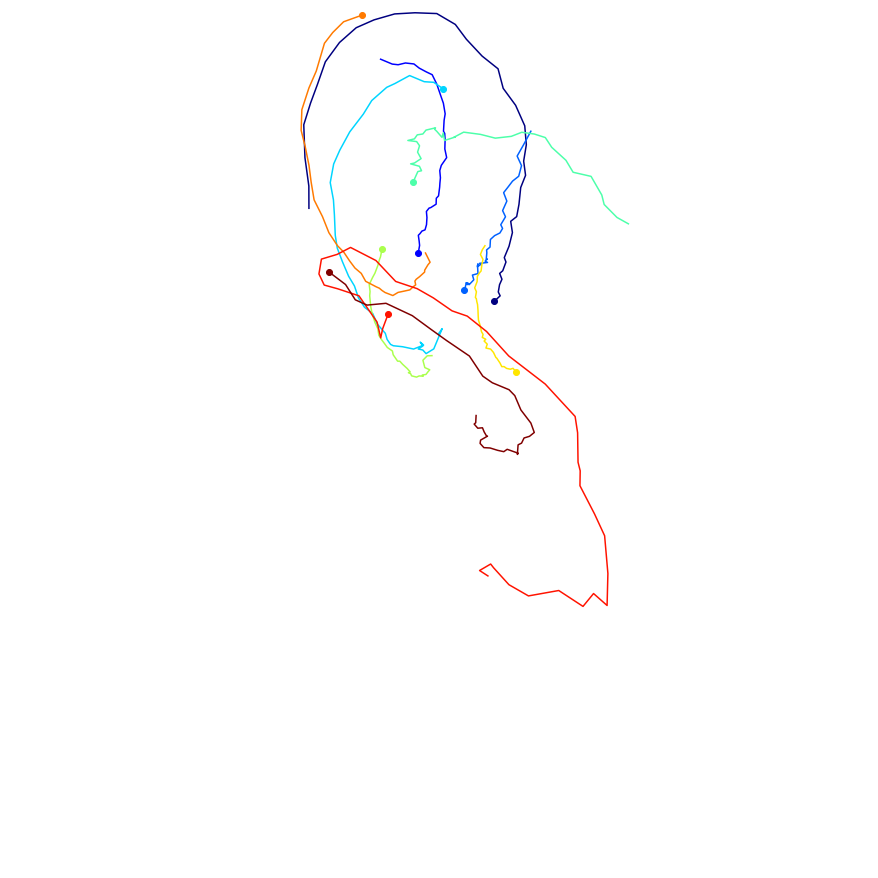

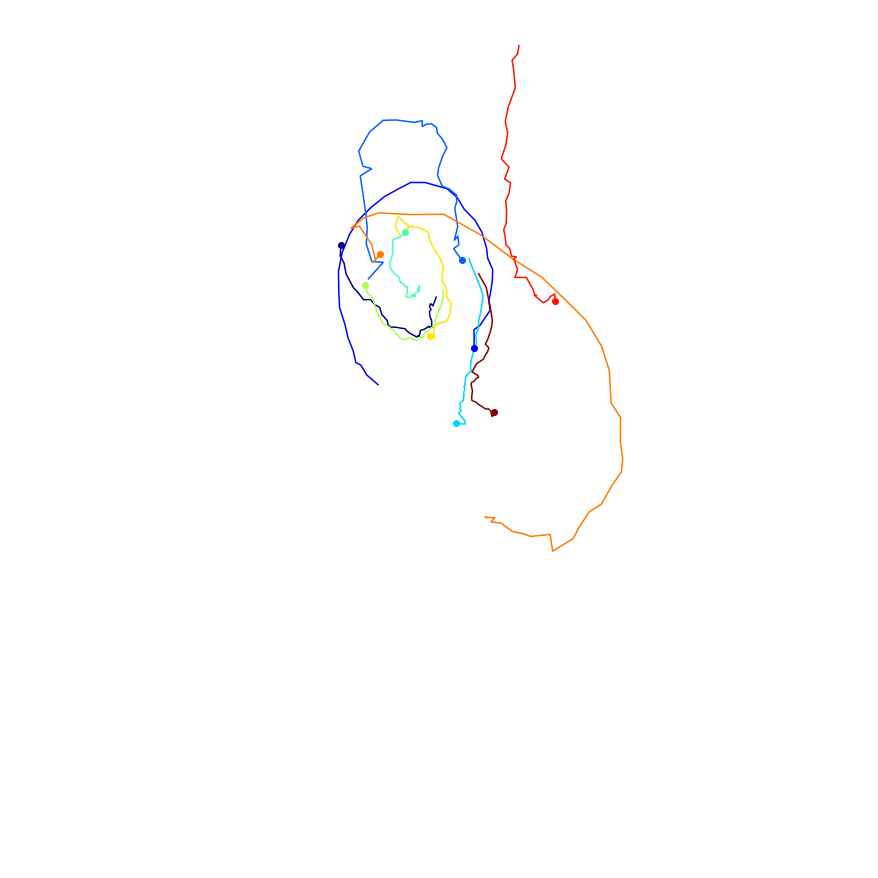

In [53]:
genvideo(samplingReconstruction[0:10], 'lorenz_traj_sampling_from_test_init_1.mp4')
genvideo(samplingReconstruction[10:20], 'lorenz_traj_sampling_from_test_init_2.mp4')
genvideo(samplingReconstruction[20:30], 'lorenz_traj_sampling_from_test_init_3.mp4')
genvideo(samplingReconstruction[30:40], 'lorenz_traj_sampling_from_test_init_4.mp4')
genvideo(samplingReconstruction[40:50], 'lorenz_traj_sampling_from_test_init_5.mp4')

Now compare the perfect reconstruction of the test set with the generated samples from normal distribution.

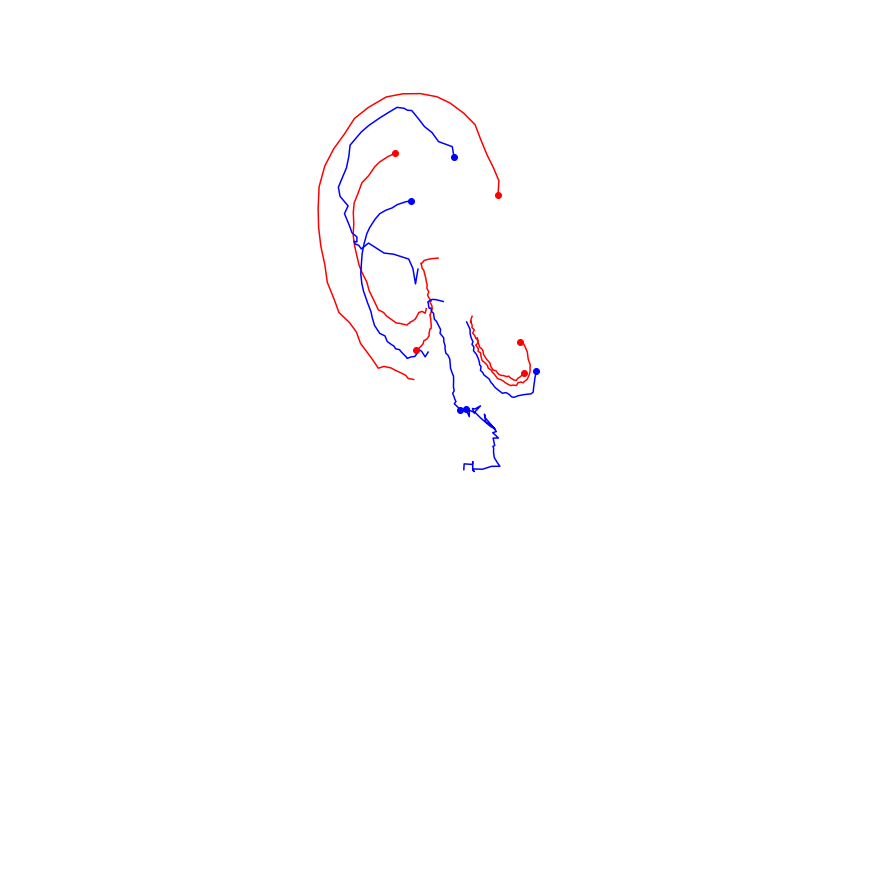

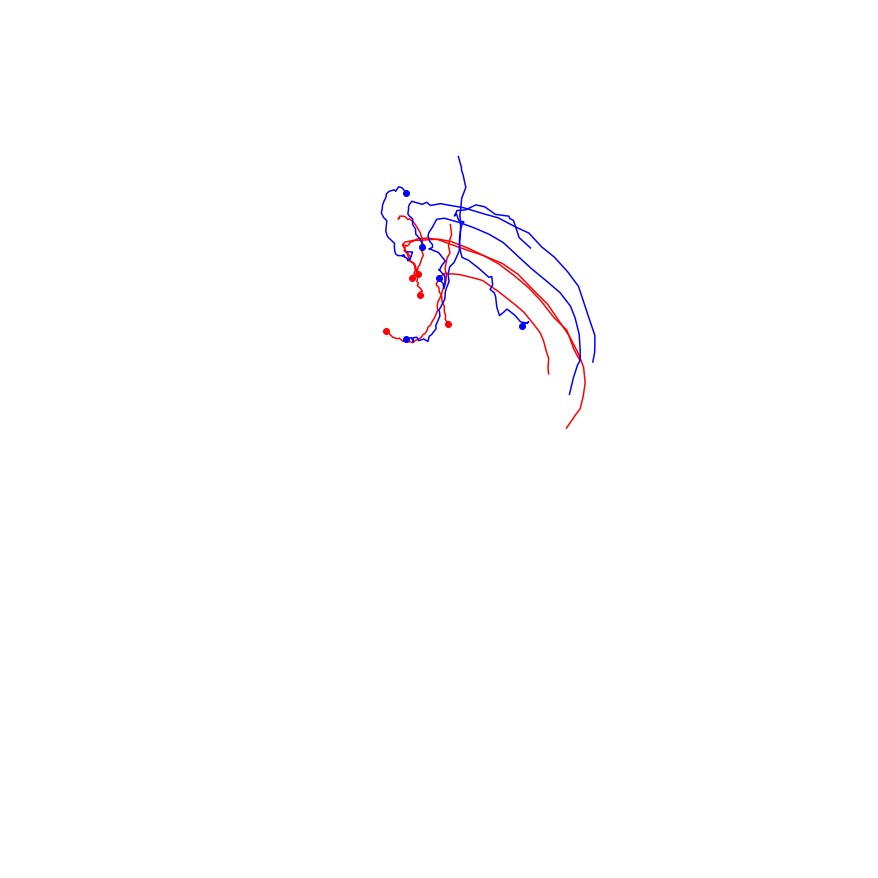

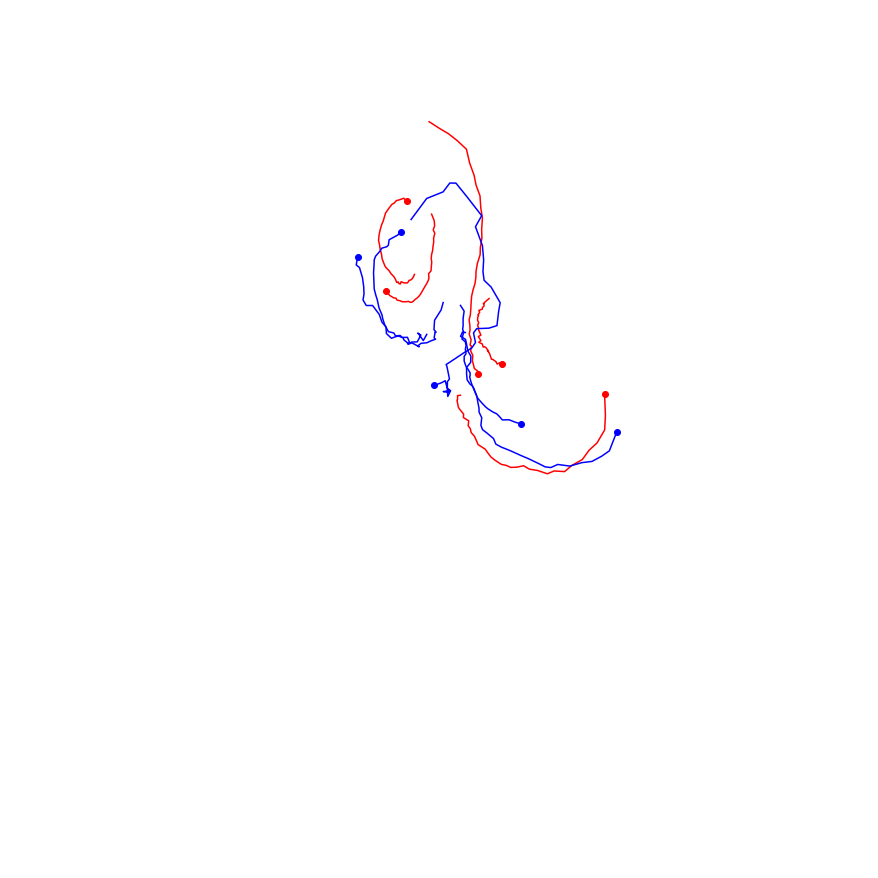

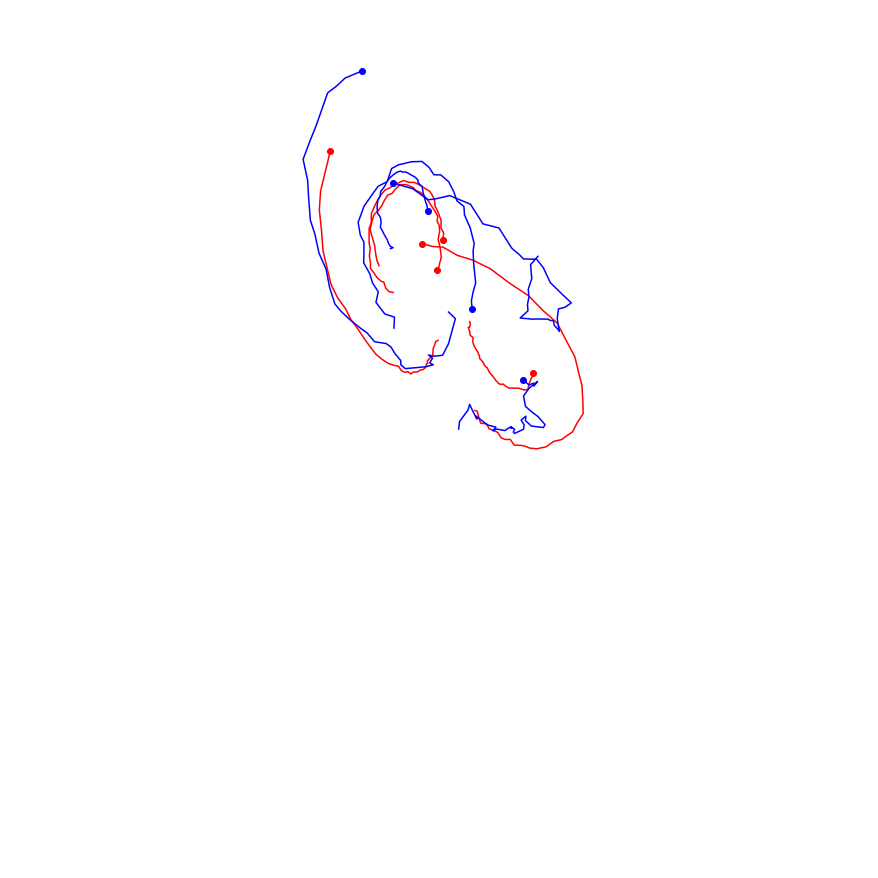

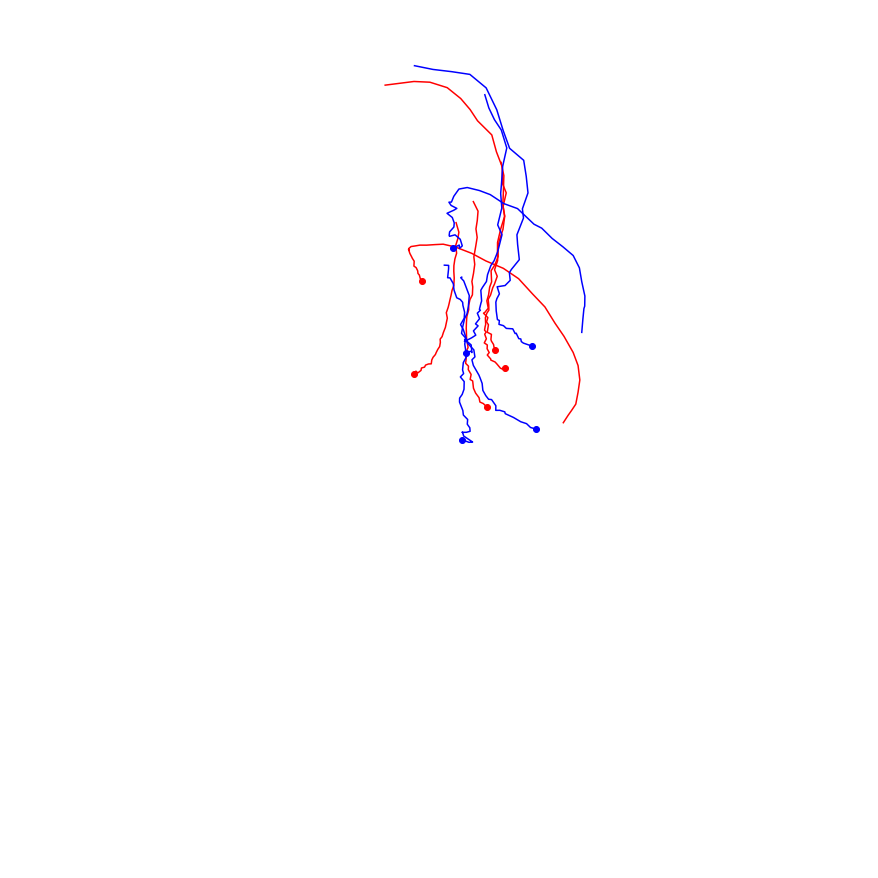

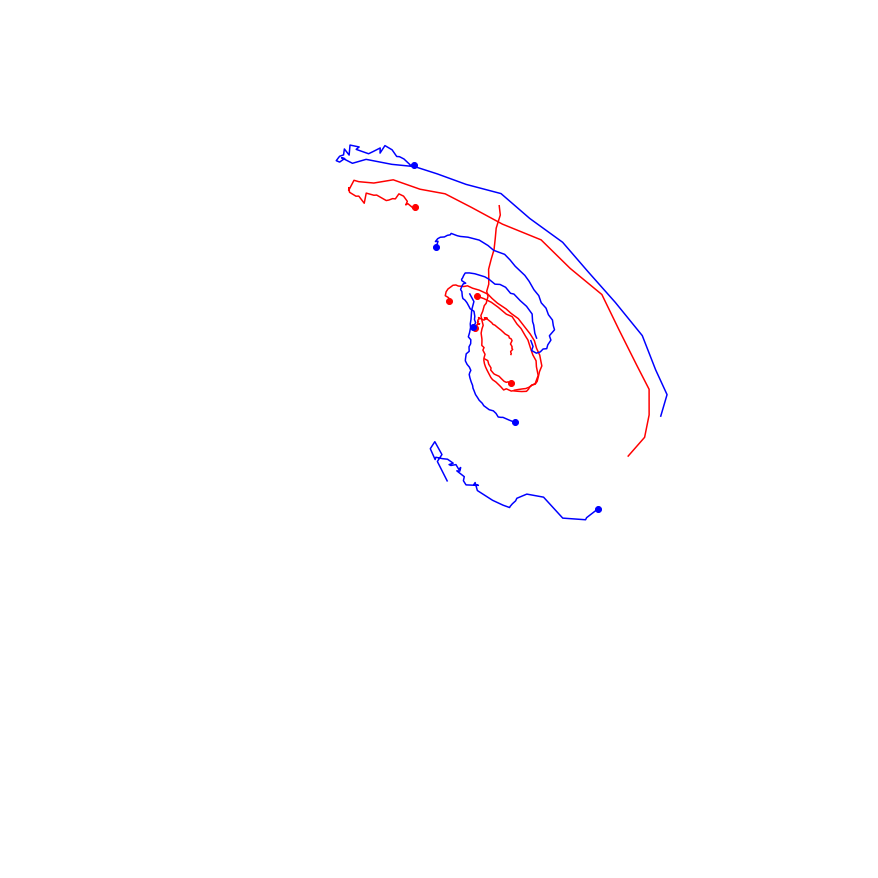

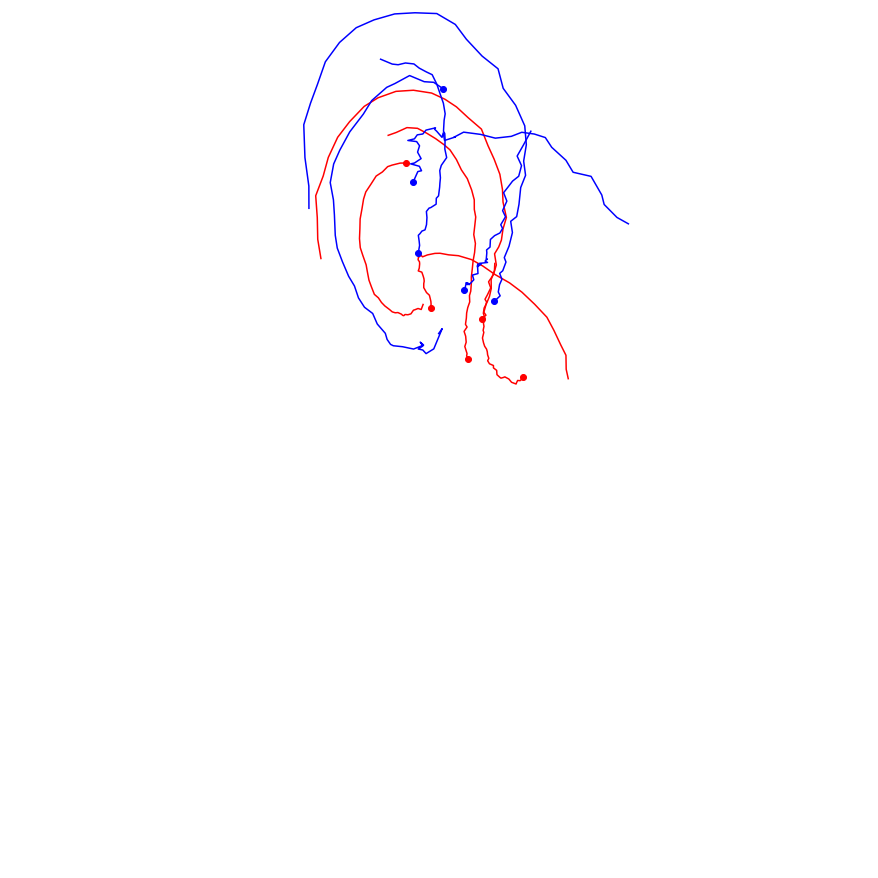

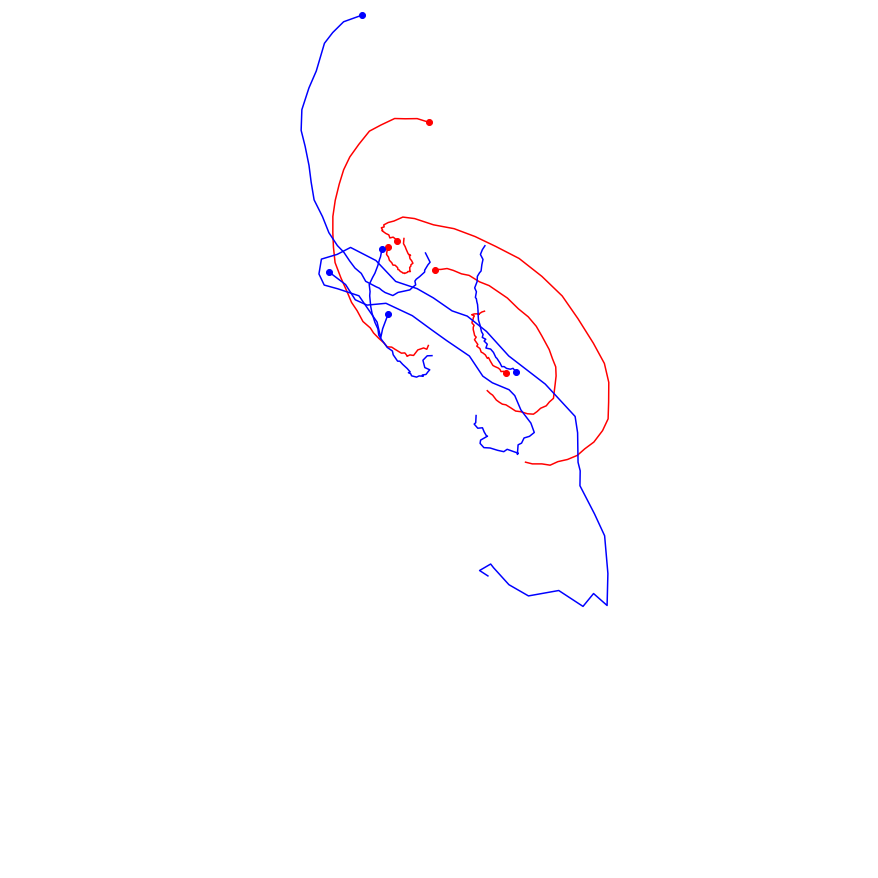

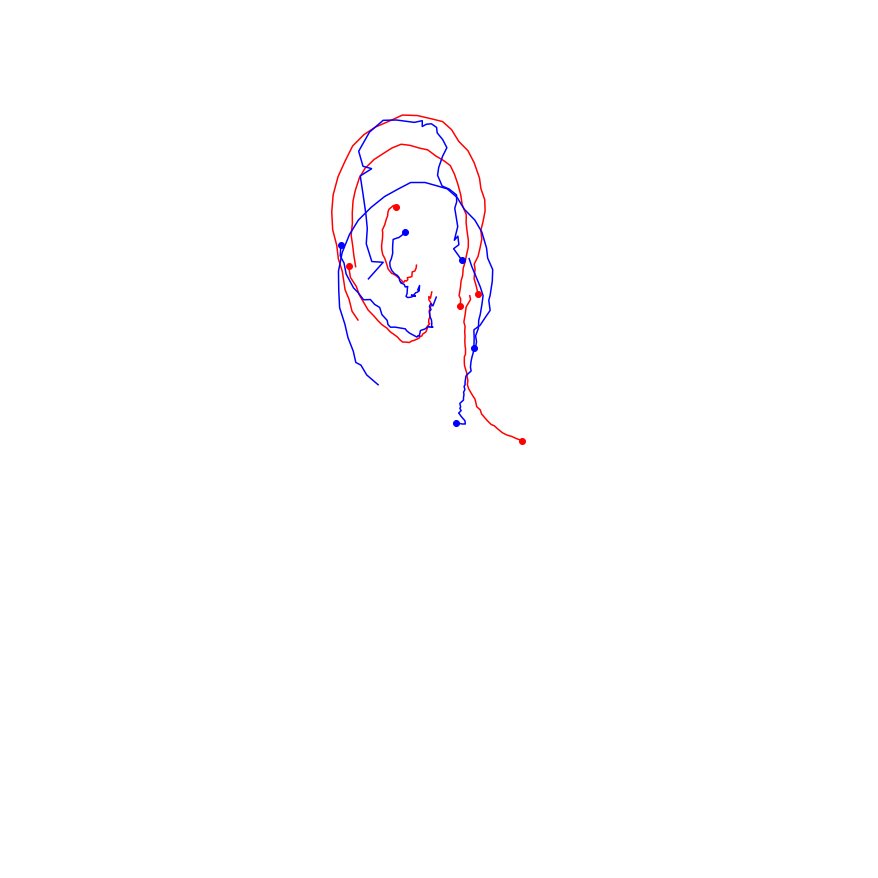

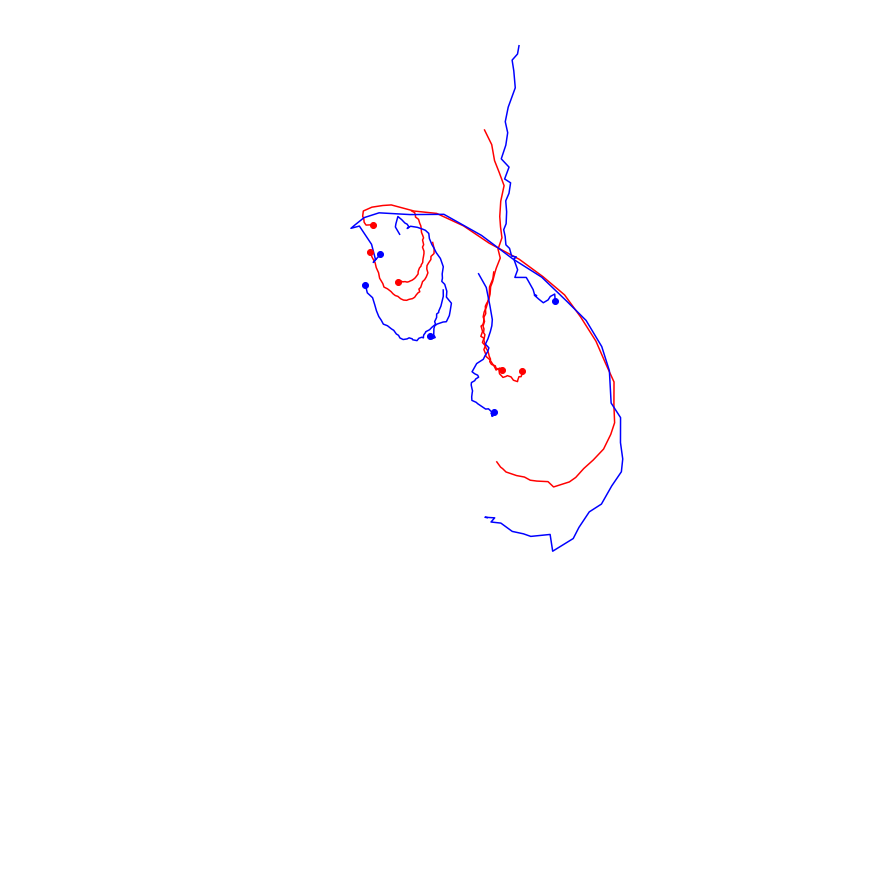

In [68]:
for i in range(0,50,5):
    example = np.vstack((vae_test[i:i+5],samplingReconstruction[i:i+5]))
    genvideo1(example, 'compare_'+str(i)+'.mp4')

### Lessons learned

- take time to analyze the data, do not go straight to the model
- test the model with an incremental level of complexity, do not jump steps.
- sometimes visualizing the results can be better then just see the MSE
